## Import Libs

In [2]:
import pandas as pd
import numpy as np
import json
import math
import matplotlib.pyplot as plt
import pprint
pp = pprint.PrettyPrinter(indent=4)

## ML Utils Libs
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn import svm
from sklearn.ensemble import RandomForestRegressor

In [3]:
def absolute_error(i1, i2):
    return abs(i1-i2)

def percentage_error(true, pred):
    return abs((true-pred)/true) * 100

def squared_error(true, pred):
    return abs(true-pred)**2
        

l1 = [12, 87, 34]
l2 = [23, 34, 45]

print(mean_absolute_error(l1, l2))
# [absolute_error(l1[i], l2[i]) for i in range(len(l1))]
print([absolute_error(l1[i], l2[i]) for i in range(len(l1))])

print([percentage_error(l1[i], l2[i]) for i in range(len(l1))])

print([squared_error(l1[i], l2[i]) for i in range(len(l1))])

25.0
[11, 53, 11]
[91.66666666666666, 60.91954022988506, 32.35294117647059]
[121, 2809, 121]


In [4]:
def avg(lst):
    return sum(lst) / len(lst)

class MachineLearningAnalyzer():
    
    def __init__(self, file_path):
        self.file_path = file_path
        self.colors = [
            "blue",
            "orange",
            "green",
            "red",
            "purple",
            "brown",
            "pink",
            "gray",
            "olive",
            "cyan",
            "blue",
            "orange",
            "green",
            "red",
            "purple",
        ]
        self.__load_datasource()
        self.__plot_data()
        
    def perform_analysis(self):
        results = self.__train_and_predict()
        return results
    
    def __load_datasource(self):
        print("Loading datasource from %s" % (self.file_path))
        self.datasource = pd.read_csv(self.file_path, index_col = 0).sort_values(by=['time_frame'])
        print("Datasource loaded: len = %d" % (len(self.datasource)))
        self.entrypoints = [key for key in self.datasource.keys() if "ENTRYPOINT_N_INVOC_API" in key]
        print("Entrypoints size: %d" % (len(self.entrypoints)))
        print("Entrypoint list")
        pp.pprint(self.entrypoints)
        
    def __plot_data(self):
        titles = self.entrypoints
        feature_keys = self.entrypoints
        date_time_key = "time_frame"
        self.__show_raw_visualization(data = self.datasource, date_time_key = date_time_key, titles = titles, feature_keys = feature_keys, colors = self.colors)


    def __show_raw_visualization(self, data, titles, feature_keys, colors, date_time_key):
        time_data = data[date_time_key]
        fig, axes = plt.subplots(
            nrows=7, ncols=2, figsize=(15, 20), dpi=80, facecolor="w", edgecolor="k"
        )
        for i in range(len(feature_keys)):
            key = feature_keys[i]
            # print(key)
            c = colors[i % (len(colors))]
            t_data = data[key]
            t_data.index = time_data
            t_data.head()
            ax = t_data.plot(
                ax=axes[i // 2, i % 2],
                color=c,
                title="{}".format(titles[i]),
                rot=25,
            )
            ax.legend([titles[i]])
        plt.tight_layout()
        plt.show()
        
    def denormalize(self, lst, feature_name):
        min_val = self.datasource.min()[feature_name]
        max_val = self.datasource.max()[feature_name]
        # print(min_val, max_val)

        values = np.array(lst) * (max_val - min_val) + min_val

        return values
        
    def plot_feature_prediction_barchart(self, y_pred, y_true, y_cols):
        bar_width = 0.25
        
        for idx, col in enumerate(y_cols):
            
            print("ENTRY", col)

            x = np.arange(len(y_pred[idx]))
            fig, ax = plt.subplots(figsize=(15,8))

            pred_values = list(self.denormalize(y_pred[idx], col))
            true_values = list(self.denormalize(y_true[idx], col))

            
            print("PRED", pred_values)
            print("VALS", true_values)
            
            
            rects1 = ax.bar(x - bar_width/2, pred_values, bar_width, label='Prediction')
            rects2 = ax.bar(x + bar_width/2, true_values, bar_width, label='Actual values')


            # Add some text for labels, title and custom x-axis tick labels, etc.
            ax.set_ylabel('Execution Time')
            ax.set_title('Prediction analysis for feature %s' % (col))

            ax.set_xticks(x)
            ax.set_xticks(ax.get_xticks()[::5])
            ax.legend()
            ax.ticklabel_format(style='plain')

            fig.tight_layout()

            plt.show()
            
            MAEs = [absolute_error(pred_values[i], [true_values[i]]) for i in range(len(pred_values))]
            MSEs = [squared_error(pred_values[i], [true_values[i]]) for i in range(len(pred_values))]
            MAPEs = [percentage_error(pred_values[i], [true_values[i]]) for i in range(len(pred_values))]
            
            print(MAEs, MSEs, MAPEs)
            
            MAE_quartiles = np.quantile(MAEs, q = np.arange(0.25, 1, 0.25))
            MSE_quartiles = np.quantile(MSEs, q = np.arange(0.25, 1, 0.25))
            MAPE_quartiles = np.quantile(MAPEs, q = np.arange(0.25, 1, 0.25))
            
            # print("\n\n===== DETAILS ON ERROR DISTRIBUTION ======")
            # print("MIN (MAE: %f, MSE: %f, MAPE: %f)" % (min(MAEs), min(MSEs), min(MAPEs)))
            # print("MAX (MAE: %f, MSE: %f, MAPE: %f)" % (max(MAEs), max(MSEs), max(MAPEs)))
            # print("AVG (MAE: %f, MSE: %f, MAPE: %f)" % (avg(MAEs), avg(MSEs), avg(MAPEs)))
            # print("0.25 Quartile (MAE: %f, MSE: %f, MAPE: %f)" % (MAE_quartiles[0], MSE_quartiles[0], MAPE_quartiles[0]))
            # print("0.50 Quartile (MAE: %f, MSE: %f, MAPE: %f)" % (MAE_quartiles[1], MSE_quartiles[1], MAPE_quartiles[1]))
            # print("0.75 Quartile (MAE: %f, MSE: %f, MAPE: %f)" % (MAE_quartiles[2], MSE_quartiles[2], MAPE_quartiles[2]))
            
            

            # print("MAE: ", mean_absolute_error(pred_values, true_values))
            # print("MAPE: ", round(mean_absolute_percentage_error(pred_values, true_values) * 100, 2), " %")
            # print("MSE: ", mean_squared_error(pred_values, true_values))
        
    def __train_and_predict(self, limit_plot = 10):
        X_cols = [key for key in self.datasource.keys() if "ENDPOINT_N_INVOC_API" in key or "ENTRYPOINT_N_INVOC_API" in key]
        y_cols = [key for key in self.datasource.keys() if "ENTRYPOINT_AVG_EXTIME" in key]
        
        
        #normalized_ds = (datasource-datasource.mean())/datasource.std()
        normalized_ds=(self.datasource-self.datasource.min())/(self.datasource.max()-self.datasource.min())
        print("Data normalized")
        
        X = normalized_ds[X_cols].copy()
        y = normalized_ds[y_cols].copy()

        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=1, shuffle=False)

        input_len = X_train.shape[1]
        output_len = y_train.shape[1]

        print("Input size", input_len, "Output size", output_len)
        
        self.model = RandomForestRegressor(max_depth=4, random_state=0)
        
        self.model.fit(X_train, y_train)
        
        predictions = self.model.predict(X_test)
        
        results_dict = {}
        
        results_dict["TOTAL MSE"] = mean_squared_error(predictions, y_test.to_numpy())
        results_dict["TOTAL MAE"] = mean_absolute_error(predictions, y_test.to_numpy())
        results_dict["TOTAL MAPE"] = round(mean_absolute_percentage_error(predictions, y_test.to_numpy()), 2)
        
        print("TOTAL MSE: ", mean_squared_error(predictions, y_test.to_numpy()))
        print("TOTAL MAE: ", mean_absolute_error(predictions, y_test.to_numpy()))
        print("TOTAL MAPE: ", round(mean_absolute_percentage_error(predictions, y_test.to_numpy()), 2))
        
        # for idx in range(len(predictions[:limit_plot])):
        #    print("\n\n====== Prediction for %d ========" % (idx))
        #    plt.plot(predictions[idx], label="Prediction")
        #    plt.plot(y_test.to_numpy()[idx], label="Actual values")
        #    plt.legend()
        #    plt.show()
        
        transposed_preds = predictions.transpose()
        transposed_vals = y_test.to_numpy().transpose()

        print("FIRST 50 predictions")
        self.plot_feature_prediction_barchart(transposed_preds[:, :50], transposed_vals[:, :50], y_cols)
        
        for idx in range(len(transposed_preds)):
            # print("\n\n========= FEATURE %d ANALYSIS (%s) ==========" % (idx, y_test.keys()[idx]))
            # plt.plot(transposed_preds[idx], label="Prediction")
            # plt.plot(transposed_vals[idx], label="Actual values")
            # plt.legend()
            den_preds = self.denormalize(transposed_preds[idx], y_test.keys()[idx])
            den_vals = self.denormalize(transposed_vals[idx], y_test.keys()[idx])
            
            # plt.show()
            MAE = mean_absolute_error(den_preds, den_vals)
            MAPE = round(mean_absolute_percentage_error(den_preds, den_vals), 2)
            MSE = mean_squared_error(den_preds, den_vals)
            
            MAEs = [absolute_error(den_vals[i], den_preds[i]) for i in range(len(den_preds))]
            MSEs = [squared_error(den_vals[i], den_preds[i]) for i in range(len(den_preds))]
            MAPEs = [percentage_error(den_vals[i], den_preds[i]) for i in range(len(den_preds)) if not math.isnan(percentage_error(den_vals[i], [den_preds[i]]))]
            
            print("ERRORS", MAEs, MSEs, MAPEs)
            
            MAE_quartiles = np.quantile(MAEs, q = np.arange(0.25, 1, 0.25))
            MSE_quartiles = np.quantile(MSEs, q = np.arange(0.25, 1, 0.25))
            
            if len(MAPEs) > 0:
                MAPE_quartiles = np.quantile(MAPEs, q = np.arange(0.25, 1, 0.25))
                results_dict[y_test.keys()[idx] + " MAPE Min"] = min(MAPEs)
                results_dict[y_test.keys()[idx] + " MAPE Max"] = max(MAPEs)
                # results_dict[y_test.keys()[idx] + " MAPE Avg"] = avg(MAPEs)
                results_dict[y_test.keys()[idx] + " MAPE Mean"] = MAPE
                print("0.25 Quartile (MAE: %f, MSE: %f, MAPE: %f)" % (MAE_quartiles[0], MSE_quartiles[0], MAPE_quartiles[0]))
                print("0.50 Quartile (MAE: %f, MSE: %f, MAPE: %f)" % (MAE_quartiles[1], MSE_quartiles[1], MAPE_quartiles[1]))
                print("0.75 Quartile (MAE: %f, MSE: %f, MAPE: %f)" % (MAE_quartiles[2], MSE_quartiles[2], MAPE_quartiles[2]))

            else:
                results_dict[y_test.keys()[idx] + " MAPE Min"] = -1
                results_dict[y_test.keys()[idx] + " MAPE Max"] = -1
                results_dict[y_test.keys()[idx] + " MAPE Mean"] = -1
            
            results_dict[y_test.keys()[idx] + " MAE Min"] = min(MAEs)
            results_dict[y_test.keys()[idx] + " MSE Min"] = min(MSEs)
            
            
            results_dict[y_test.keys()[idx] + " MAE Max"] = max(MAEs)
            results_dict[y_test.keys()[idx] + " MSE Max"] = max(MSEs)
            
            
            results_dict[y_test.keys()[idx] + " MAE Mean"] = MAE
            results_dict[y_test.keys()[idx] + " MSE Mean"] = MSE
            
            
            
            # results_dict[y_test.keys()[idx] + " MAE"] = MAE
            # results_dict[y_test.keys()[idx] + " MSE"] = MSE
            # results_dict[y_test.keys()[idx] + " MAPE"] = MAPE
        
        
        return results_dict

In [5]:
results = {}

Loading datasource from avv_dataset_DT_1000.csv
Datasource loaded: len = 1497
Entrypoints size: 13
Entrypoint list
[   'ENTRYPOINT_N_INVOC_API_ts-consign-service:findByOrderId',
    'ENTRYPOINT_N_INVOC_API_ts-consign-service:updateConsign',
    'ENTRYPOINT_N_INVOC_API_ts-travel-plan-service:getByCheapest',
    'ENTRYPOINT_N_INVOC_API_ts-preserve-service:preserve',
    'ENTRYPOINT_N_INVOC_API_ts-contacts-service:findContactsByAccountId',
    'ENTRYPOINT_N_INVOC_API_ts-food-service:getAllFood',
    'ENTRYPOINT_N_INVOC_API_ts-order-service:queryOrdersForRefresh',
    'ENTRYPOINT_N_INVOC_API_ts-cancel-service:cancelTicket',
    'ENTRYPOINT_N_INVOC_API_ts-inside-payment-service:pay',
    'ENTRYPOINT_N_INVOC_API_ts-travel-service:queryInfo',
    'ENTRYPOINT_N_INVOC_API_ts-assurance-service:getAllAssuranceType',
    'ENTRYPOINT_N_INVOC_API_ts-auth-service:getToken',
    'ENTRYPOINT_N_INVOC_API_ts-order-service:POST']


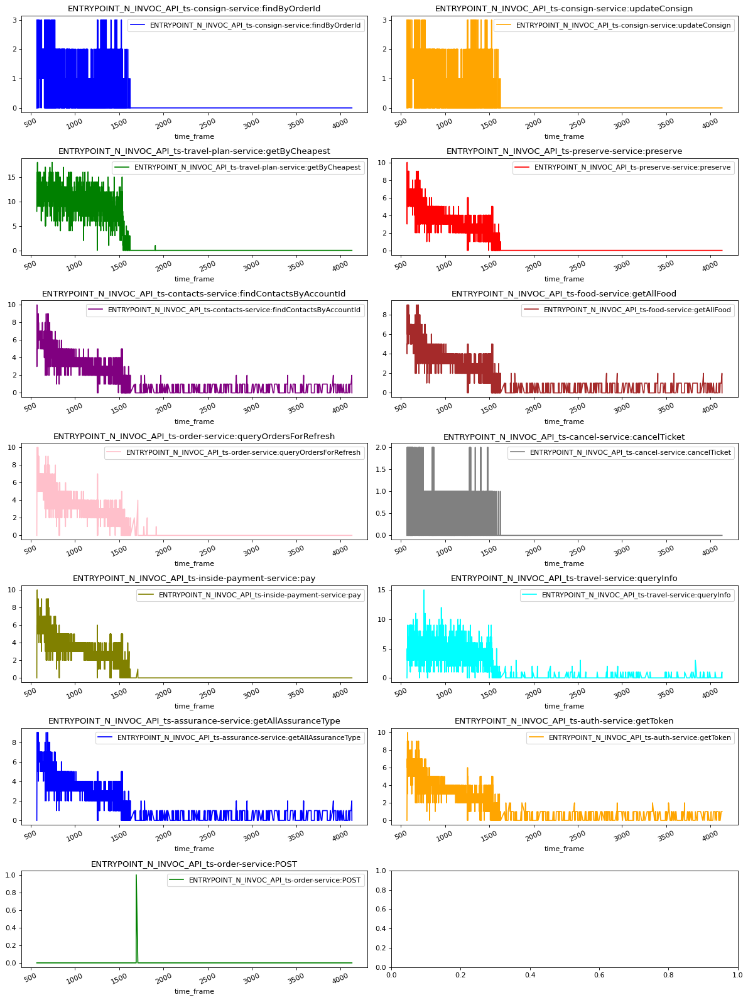

Data normalized
Input size 45 Output size 13
TOTAL MSE:  0.005779069479795955
TOTAL MAE:  0.028805417662216833
TOTAL MAPE:  699860081955.0
FIRST 50 predictions
ENTRY ENTRYPOINT_AVG_EXTIME_ts-consign-service:findByOrderId
PRED [0.0, 0.0, 2920.5384085497826, 4.238142035024006, 0.0, 0.0, 0.0, 3.0271047178919885, 0.0, 0.0, 3269.069362013252, 3.427662729428432, 0.0, 3.6123132222628045, 1.8066873330691833, 0.0, 3.2981523831019657, 0.0, 0.0, 0.0, 0.7679829106044792, 0.0, 0.0, 0.0, 0.0, 2938.261918530543, 2988.9845971610002, 0.0, 0.0, 0.0, 3121.2528667628662, 0.7679829106044792, 0.0, 0.0, 0.0, 5.420424439140085, 0.0, 0.0, 2920.5384085497826, 0.45397565397565404, 0.0, 3.9225239553983386, 0.0, 0.0, 3134.987232503607, 0.0, 3.9234075122085015, 2.5331487202093697, 0.0, 0.6019817375063503]
VALS [0.0, 0.0, 2135.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2964.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3367.5, 3974.0, 0.0, 0.0, 0.0, 2443.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 27

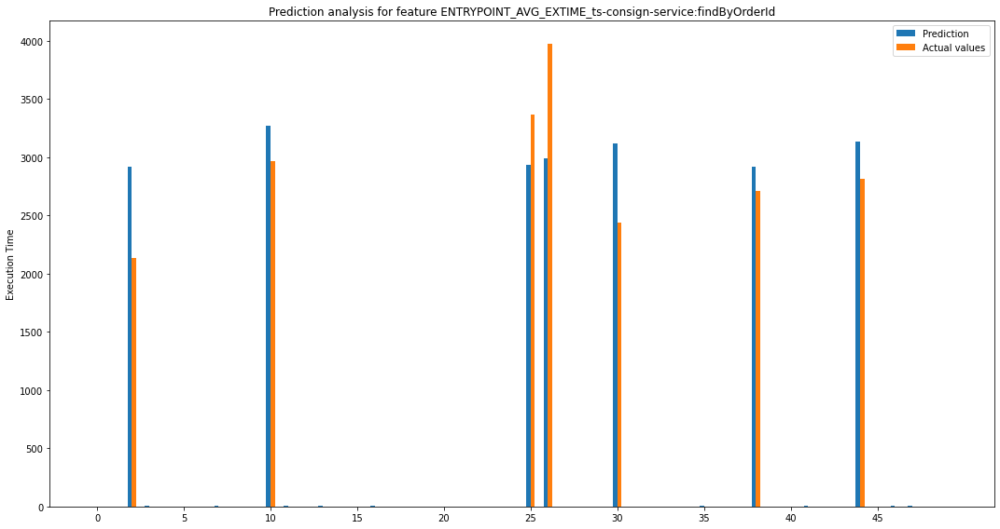

/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100


[array([0.]), array([0.]), array([785.53840855]), array([4.23814204]), array([0.]), array([0.]), array([0.]), array([3.02710472]), array([0.]), array([0.]), array([304.56936201]), array([3.42766273]), array([0.]), array([3.61231322]), array([1.80668733]), array([0.]), array([3.29815238]), array([0.]), array([0.]), array([0.]), array([0.76798291]), array([0.]), array([0.]), array([0.]), array([0.]), array([429.23808147]), array([985.01540284]), array([0.]), array([0.]), array([0.]), array([678.25286676]), array([0.76798291]), array([0.]), array([0.]), array([0.]), array([5.42042444]), array([0.]), array([0.]), array([208.53840855]), array([0.45397565]), array([0.]), array([3.92252396]), array([0.]), array([0.]), array([318.9872325]), array([0.]), array([3.92340751]), array([2.53314872]), array([0.]), array([0.60198174])] [array([0.]), array([0.]), array([617070.59130693]), array([17.96184791]), array([0.]), array([0.]), array([0.]), array([9.16336297]), array([0.]), array([0.]), array([

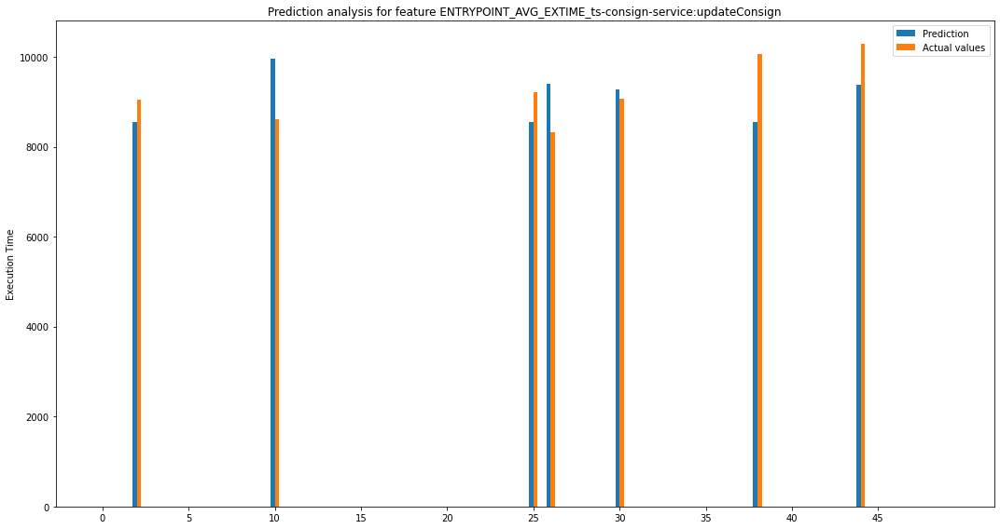

[array([0.]), array([0.]), array([504.31486201]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([1346.88094169]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([681.77033135]), array([1087.78262702]), array([0.]), array([0.]), array([0.]), array([197.1202092]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([1517.31486201]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([896.86961951]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([0.]), array([0.]), array([254333.48004719]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([1814088.27108858]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), ar

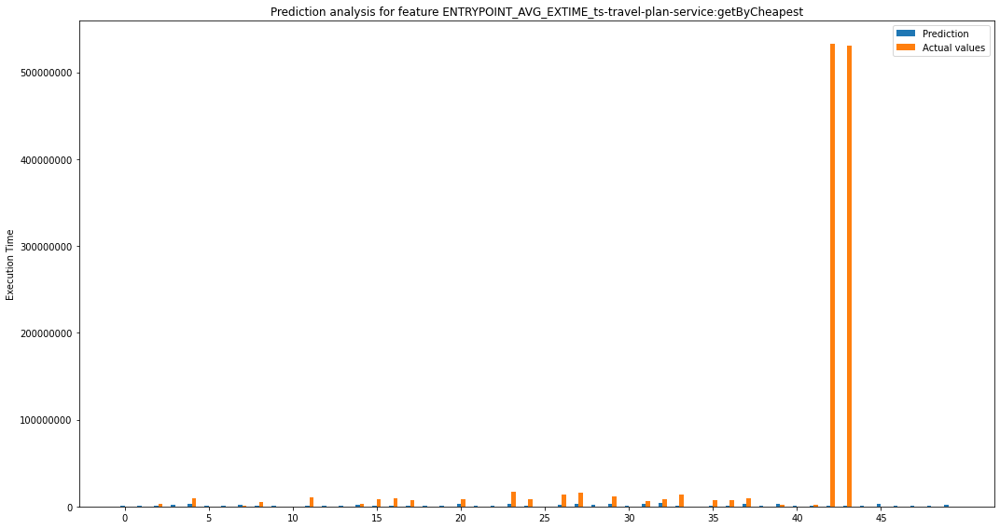

[array([1296477.81455128]), array([1226548.83985609]), array([2390026.18667035]), array([1811156.14455711]), array([5602388.26409147]), array([1292746.76553877]), array([994706.22852224]), array([414271.84985153]), array([4314242.45681727]), array([894397.45521668]), array([207430.80676074]), array([9385702.94947909]), array([599035.36311501]), array([622780.01746001]), array([1886768.36549032]), array([7378853.99153861]), array([8819754.81870072]), array([5861303.84678266]), array([632214.74553661]), array([765719.94593809]), array([5863596.30490002]), array([1044533.78220789]), array([1079029.04867125]), array([13650006.16793402]), array([7045344.96779211]), array([314049.6291098]), array([11319651.79755045]), array([12812363.88890455]), array([1399518.70991438]), array([8612621.14482978]), array([992162.12547935]), array([3088163.11323335]), array([5043655.81828134]), array([12550123.06262774]), array([178089.75410244]), array([7270636.21734221]), array([6246848.38265705]), array([6

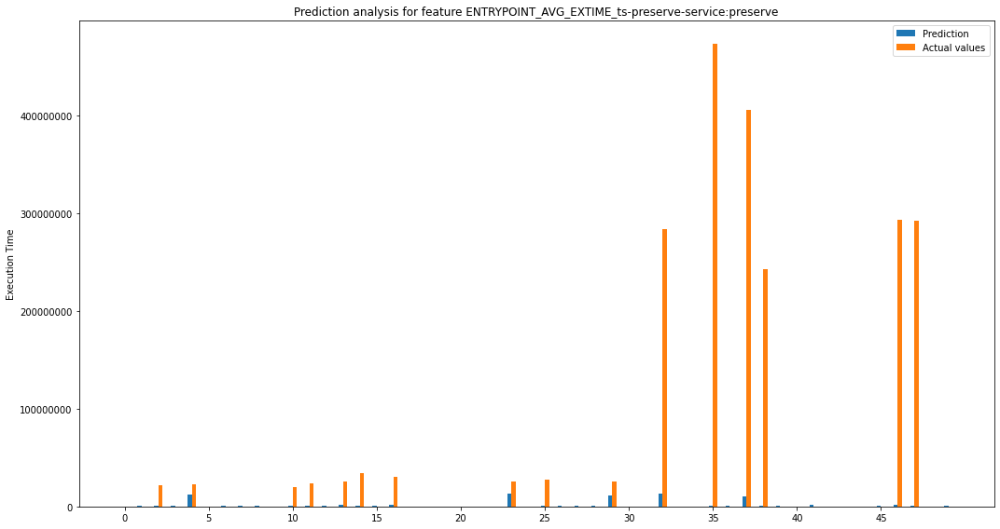

[array([281461.33333333]), array([335869.13047619]), array([20528621.78138492]), array([618213.01829268]), array([10128814.66769523]), array([240781.25214286]), array([325248.64333333]), array([927697.89328771]), array([837638.27955357]), array([281461.33333333]), array([19016346.90829639]), array([22936433.85206936]), array([352303.15685714]), array([24278939.89223246]), array([33125421.79229615]), array([406710.954]), array([28762742.75696749]), array([54407.79714286]), array([0.]), array([54407.79714286]), array([146755.89252837]), array([0.]), array([54407.79714286]), array([12166339.54846795]), array([0.]), array([26793844.06782936]), array([460307.91621945]), array([384091.68618656]), array([764798.19214286]), array([14063498.23855147]), array([0.]), array([146755.89252837]), array([2.70352257e+08]), array([54407.79714286]), array([0.]), array([4.72316202e+08]), array([554094.07547619]), array([3.95443487e+08]), array([2.41937705e+08]), array([487129.88931824]), array([54407.7971

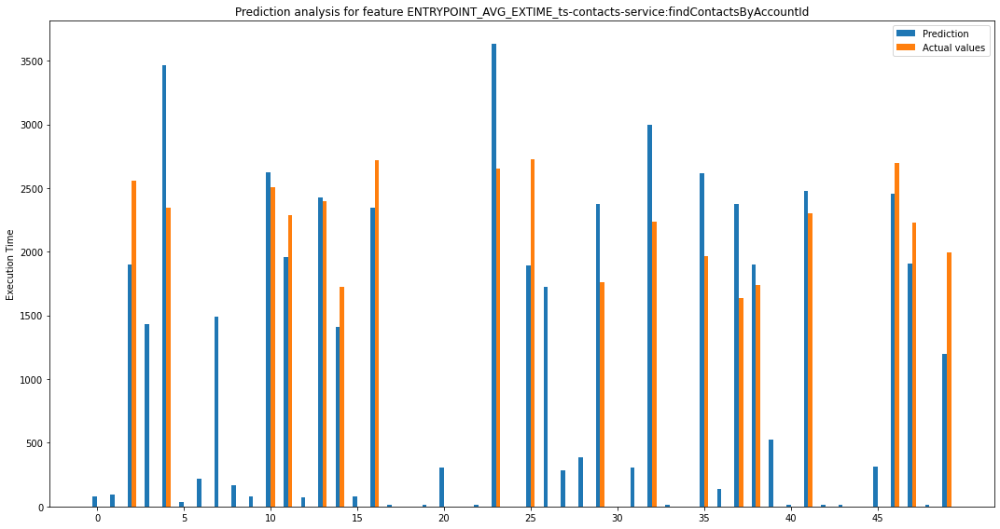

[array([82.26792949]), array([92.52316758]), array([657.19303968]), array([1432.24615684]), array([1117.22675176]), array([33.3402381]), array([219.22852949]), array([1488.21169205]), array([168.82270833]), array([82.26792949]), array([119.01078301]), array([328.37393612]), array([68.44309524]), array([32.56020668]), array([320.23682527]), array([78.69833333]), array([373.01898392]), array([10.2552381]), array([0.]), array([10.2552381]), array([304.37409408]), array([0.]), array([10.2552381]), array([976.07906472]), array([0.]), array([828.31459524]), array([1721.83530793]), array([286.7482581]), array([386.55576758]), array([615.72333905]), array([0.]), array([304.37409408]), array([759.48124567]), array([10.2552381]), array([0.]), array([650.03177301]), array([139.31483425]), array([738.85554434]), array([162.80696032]), array([522.55898041]), array([10.2552381]), array([178.01875137]), array([10.2552381]), array([10.2552381]), array([0.]), array([313.8011711]), array([242.94826832])

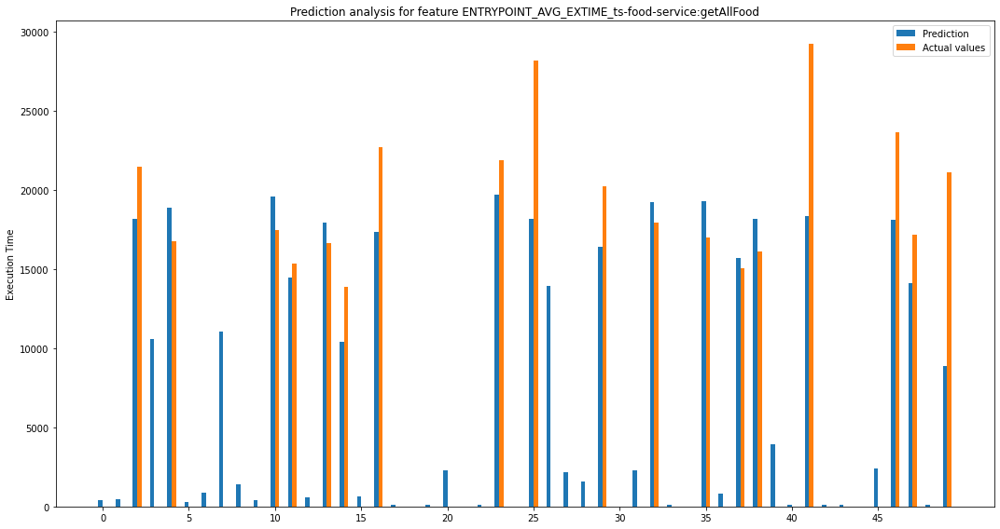

[array([394.95688462]), array([476.7925989]), array([3255.67830159]), array([10593.05553899]), array([2124.45006679]), array([262.79946429]), array([883.78908462]), array([11023.67131026]), array([1417.13071429]), array([394.95688462]), array([2158.83746902]), array([888.54725104]), array([566.01109524]), array([1292.14069738]), array([3450.72095763]), array([647.84680952]), array([5318.50327015]), array([81.83571429]), array([0.]), array([81.83571429]), array([2310.29933233]), array([0.]), array([81.83571429]), array([2146.16836452]), array([0.]), array([9989.3894127]), array([13954.8552347]), array([2179.87909873]), array([1592.3975489]), array([3792.24609488]), array([0.]), array([2310.29933233]), array([1276.43768191]), array([81.83571429]), array([0.]), array([2303.54575876]), array([839.4063489]), array([678.23537457]), array([2098.32169841]), array([3914.19901655]), array([81.83571429]), array([10885.71028786]), array([81.83571429]), array([81.83571429]), array([0.]), array([237

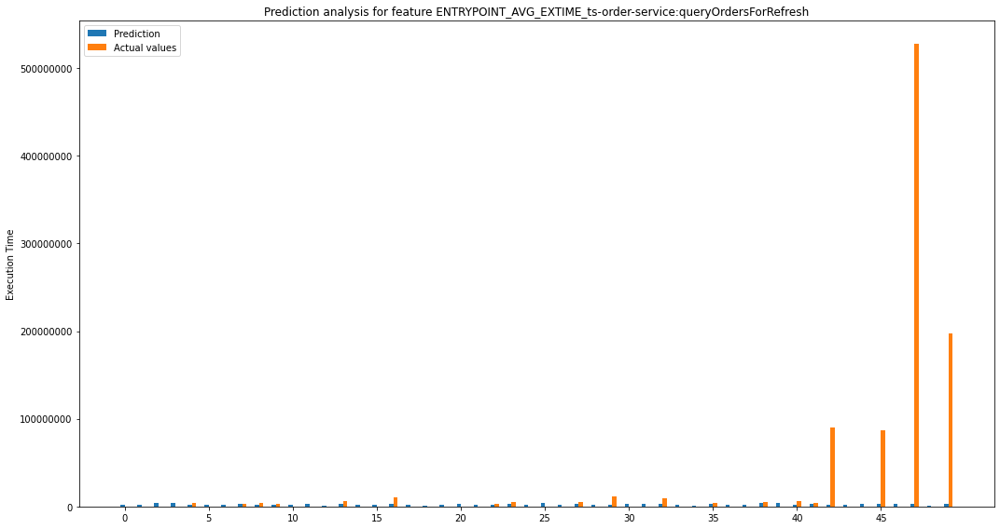

[array([1680894.19052302]), array([1535029.74621228]), array([3873517.23422087]), array([3521935.44247789]), array([1931258.19134785]), array([1704084.56256098]), array([1567198.11624488]), array([32053.23269168]), array([2330673.64643017]), array([1574727.09475512]), array([2327208.89582622]), array([2775511.96822602]), array([908529.81635484]), array([3719893.89990164]), array([1971938.03744216]), array([1664918.52020384]), array([7356485.95600027]), array([1673648.3168467]), array([729515.31077398]), array([1559094.54481914]), array([2806974.38890117]), array([1399607.52635509]), array([1224647.26121359]), array([2868257.80815665]), array([1399607.52635509]), array([3923149.89053147]), array([1986056.24965239]), array([2428429.04751959]), array([1689014.07895159]), array([9514000.1116526]), array([2585316.45274118]), array([2883759.07890117]), array([6220275.08898601]), array([1593050.48477405]), array([695559.37081907]), array([1783576.50111354]), array([1661775.89114207]), array([

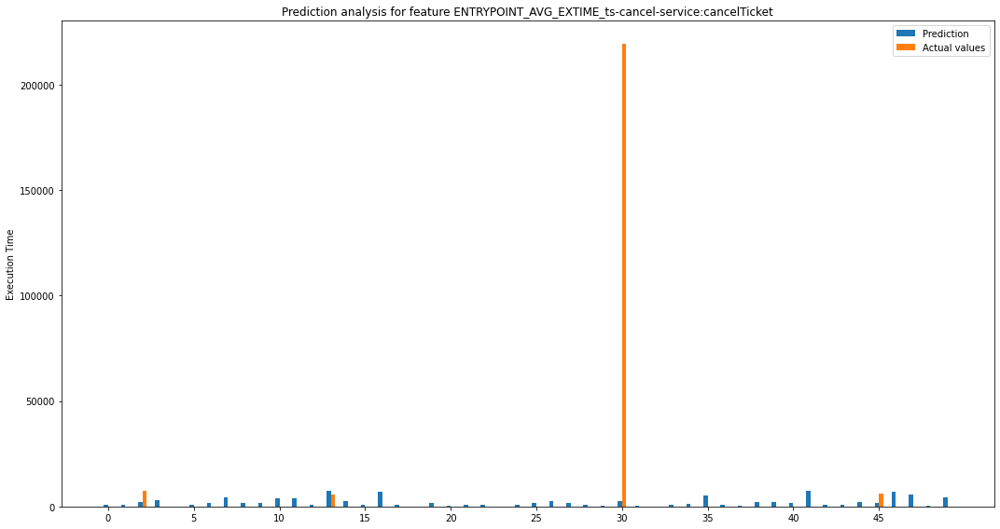

[array([867.98848012]), array([706.82514415]), array([5372.66446609]), array([2811.89983646]), array([103.06146284]), array([885.38133727]), array([1548.86613164]), array([4494.97845039]), array([1673.98929181]), array([1613.79946497]), array([3673.76872706]), array([3770.55601962]), array([958.17456626]), array([1451.50638874]), array([2668.87238543]), array([810.3021706]), array([6972.36523688]), array([820.15812298]), array([127.97342504]), array([1734.50582597]), array([491.22329085]), array([637.34290972]), array([662.29192945]), array([17.39285714]), array([637.34290972]), array([1759.74163781]), array([2727.67425078]), array([1608.885972]), array([958.43133727]), array([170.94631133]), array([216675.82976451]), array([491.22329085]), array([63.38730159]), array([750.35999264]), array([1112.11925837]), array([5133.43615359]), array([852.9146706]), array([246.02547799]), array([2240.33553391]), array([2089.18990176]), array([1601.6771706]), array([7214.71117391]), array([885.38133

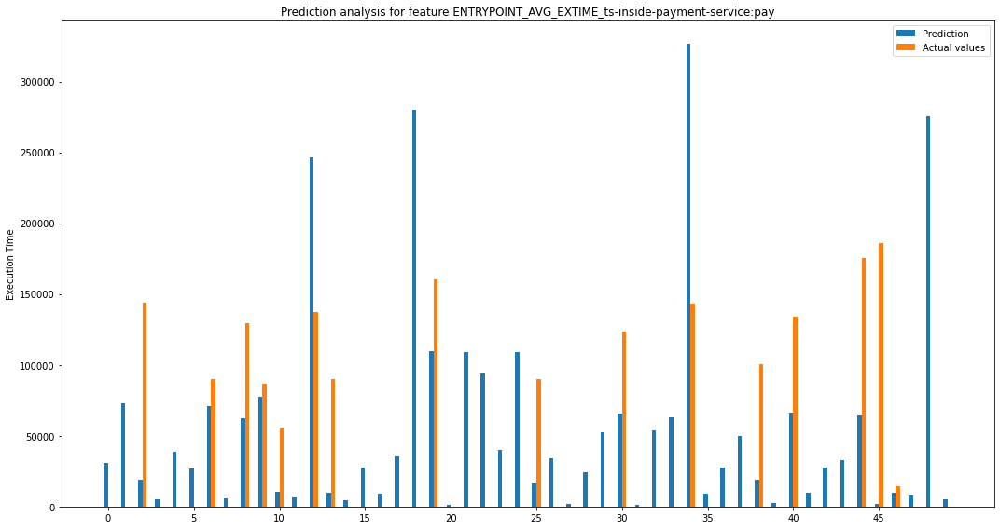

[array([30941.12413366]), array([72624.58664635]), array([124818.05875454]), array([4851.85901671]), array([38795.24663546]), array([26741.94337969]), array([19005.85125703]), array([5936.91446726]), array([66654.27454971]), array([9033.80049513]), array([44525.45264624]), array([6682.26976668]), array([109219.6393272]), array([80490.20967878]), array([4780.49223658]), array([27298.16035985]), array([9344.70967102]), array([35244.01841937]), array([279974.78252702]), array([50276.90755819]), array([997.62684048]), array([108973.46461873]), array([94108.5931271]), array([39906.46784307]), array([108973.46461873]), array([73260.42797931]), array([33854.49548577]), array([1720.30067732]), array([24512.86228445]), array([52575.97507713]), array([58048.2101823]), array([997.62684048]), array([53757.23070815]), array([63256.35085848]), array([183239.02411035]), array([8888.95209448]), array([27651.22204636]), array([49789.90856523]), array([81299.55875454]), array([2529.94628543]), array([67

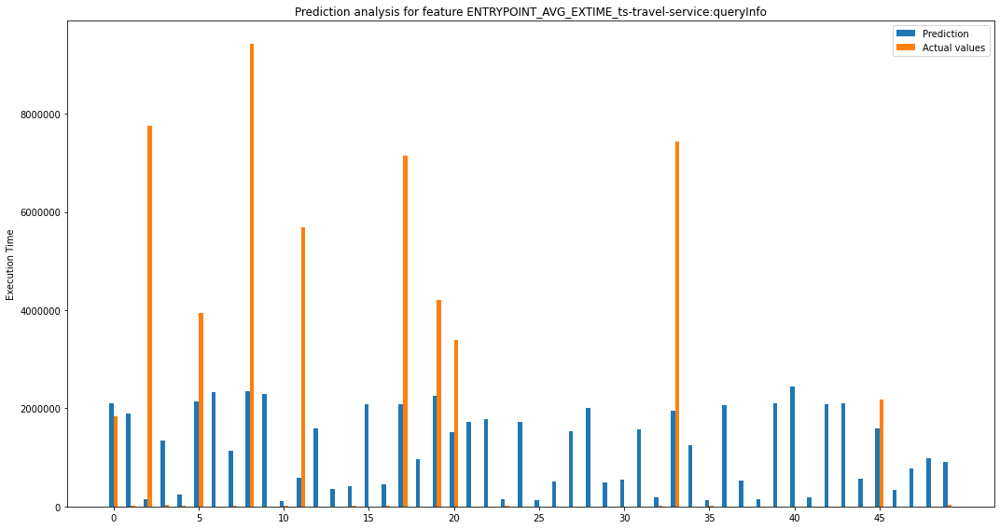

[array([256142.82135889]), array([1868486.83186549]), array([7611015.05899909]), array([1312083.22101306]), array([227186.01391091]), array([1808078.39241179]), array([2337319.79223587]), array([1114777.7478496]), array([7081144.45386874]), array([2295798.28300571]), array([94468.91037245]), array([5088311.44188837]), array([1586443.65051225]), array([362073.32900902]), array([387552.00551091]), array([2080884.62903266]), array([438813.30626297]), array([5067395.91908838]), array([966631.16058537]), array([1964460.69286153]), array([1862294.7879729]), array([1725465.07536756]), array([1774723.35942322]), array([121231.80662214]), array([1725465.07536756]), array([134816.45902208]), array([507697.55032154]), array([1538249.67153886]), array([2012901.91513666]), array([491228.74226182]), array([543451.69132744]), array([1568847.4370271]), array([165136.11932135]), array([5485253.40772192]), array([1254279.87544576]), array([115512.47905102]), array([2056199.24778746]), array([526753.9919

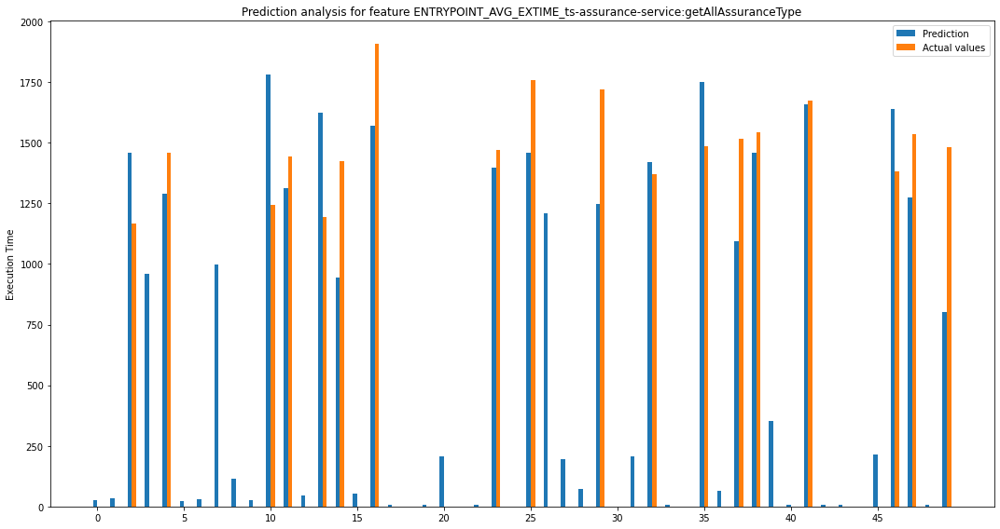

[array([27.86016026]), array([34.46111264]), array([288.66449008]), array([960.53509953]), array([171.24442909]), array([21.57095238]), array([31.69516026]), array([997.2518739]), array([115.91205357]), array([27.86016026]), array([536.93556574]), array([134.2350424]), array([46.68238095]), array([428.6223622]), array([481.0752477]), array([53.28333333]), array([337.02938584]), array([6.60095238]), array([0.]), array([6.60095238]), array([207.86669505]), array([0.]), array([6.60095238]), array([70.89858481]), array([0.]), array([300.92473214]), array([1207.63057716]), array([194.65352857]), array([72.44111264]), array([470.200758]), array([0.]), array([207.86669505]), array([52.65931995]), array([6.60095238]), array([0.]), array([263.73875556]), array([65.26444597]), array([425.8722289]), array([86.33550992]), array([352.1530851]), array([6.60095238]), array([15.20961862]), array([6.60095238]), array([6.60095238]), array([0.]), array([212.90739822]), array([257.07840607]), array([261.1

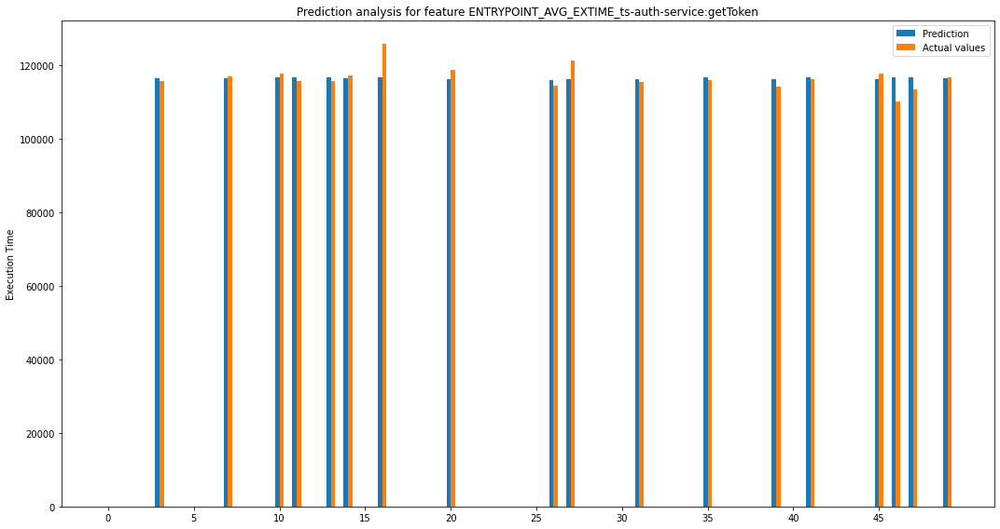

[array([0.]), array([0.]), array([0.]), array([860.43959547]), array([0.]), array([0.]), array([0.]), array([468.39897721]), array([0.]), array([0.]), array([1122.23615662]), array([855.80139028]), array([0.]), array([961.08310122]), array([888.05085048]), array([0.]), array([9066.99586178]), array([0.]), array([0.]), array([0.]), array([2728.61637717]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([1470.47488214]), array([5253.3994875]), array([0.]), array([0.]), array([0.]), array([803.7502895]), array([0.]), array([0.]), array([0.]), array([929.20691249]), array([0.]), array([0.]), array([0.]), array([2147.20766074]), array([0.]), array([512.4845233]), array([0.]), array([0.]), array([0.]), array([1589.81681711]), array([6564.77206151]), array([3298.58458542]), array([0.]), array([359.5446465])] [array([0.]), array([0.]), array([0.]), array([740356.29745594]), array([0.]), array([0.]), array([0.]), array([219397.60184821]), array([0.]), array([0.]), array([

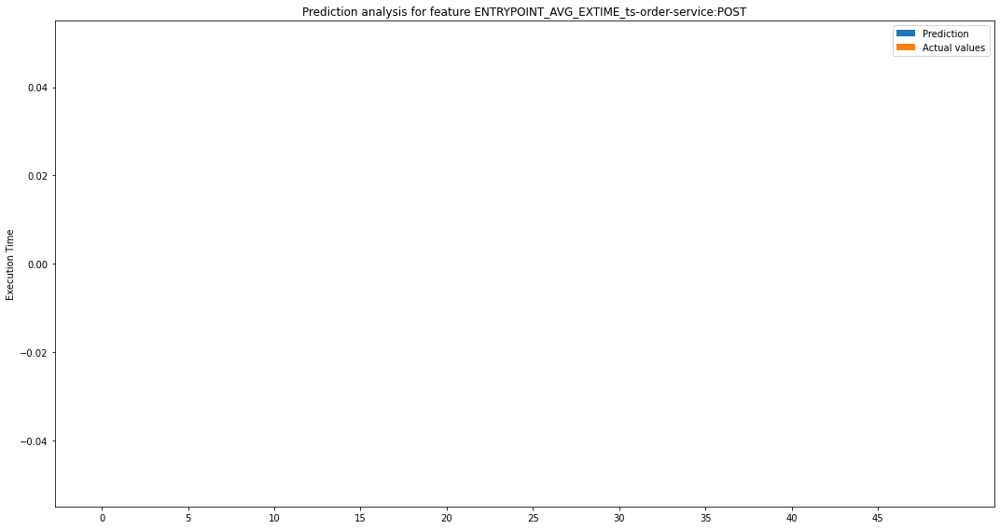

[array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]

/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  return abs((true-pred)/true) * 100
/home/dimenna/AVV/git/obstack/notebooks/env/lib/python3.9/site-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  return abs((true-pred)/true) * 100
/home/dimenna/AVV/git/o

In [6]:
results[1000] = MachineLearningAnalyzer("avv_dataset_DT_1000.csv").perform_analysis()

Loading datasource from avv_dataset_DT_50.csv
Datasource loaded: len = 20708
Entrypoints size: 13
Entrypoint list
[   'ENTRYPOINT_N_INVOC_API_ts-travel-plan-service:getByCheapest',
    'ENTRYPOINT_N_INVOC_API_ts-order-service:queryOrdersForRefresh',
    'ENTRYPOINT_N_INVOC_API_ts-consign-service:findByOrderId',
    'ENTRYPOINT_N_INVOC_API_ts-inside-payment-service:pay',
    'ENTRYPOINT_N_INVOC_API_ts-consign-service:updateConsign',
    'ENTRYPOINT_N_INVOC_API_ts-preserve-service:preserve',
    'ENTRYPOINT_N_INVOC_API_ts-food-service:getAllFood',
    'ENTRYPOINT_N_INVOC_API_ts-contacts-service:findContactsByAccountId',
    'ENTRYPOINT_N_INVOC_API_ts-cancel-service:cancelTicket',
    'ENTRYPOINT_N_INVOC_API_ts-auth-service:getToken',
    'ENTRYPOINT_N_INVOC_API_ts-assurance-service:getAllAssuranceType',
    'ENTRYPOINT_N_INVOC_API_ts-travel-service:queryInfo',
    'ENTRYPOINT_N_INVOC_API_ts-order-service:POST']


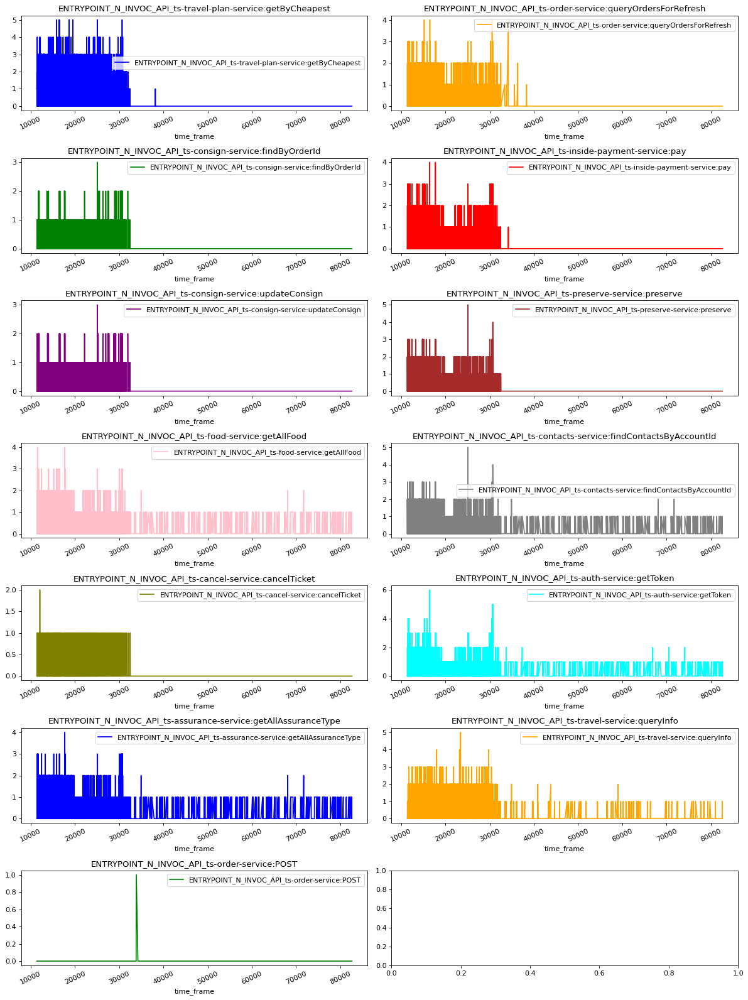

Data normalized
Input size 45 Output size 13
TOTAL MSE:  0.0003510022285175233
TOTAL MAE:  0.0028770189871539435
TOTAL MAPE:  50692235964.8
FIRST 50 predictions
ENTRY ENTRYPOINT_AVG_EXTIME_ts-travel-plan-service:getByCheapest
PRED [79467.30094670842, 78017.73819371236, 78017.73819371236, 80810.04858518291, 80810.04858518291, 80810.04858518291, 80810.04858518291, 80810.04858518291, 101267.90172113826, 81304.9942030568, 80810.04858518291, 80810.04858518291, 100162.30611739305, 80810.04858518291, 80810.04858518291, 80810.04858518291, 80810.04858518291, 100162.30611739305, 78017.73819371236, 80810.04858518291, 80810.04858518291, 80810.04858518291, 81304.9942030568, 80810.04858518291, 80810.04858518291, 80810.04858518291, 80810.04858518291, 80810.04858518291, 80810.04858518291, 78017.73819371236, 80810.04858518291, 80810.04858518291, 80810.04858518291, 64234.75513266152, 79467.30094670842, 100162.30611739305, 80810.04858518291, 80810.04858518291, 78017.73819371236, 80645.84350956886, 79467.

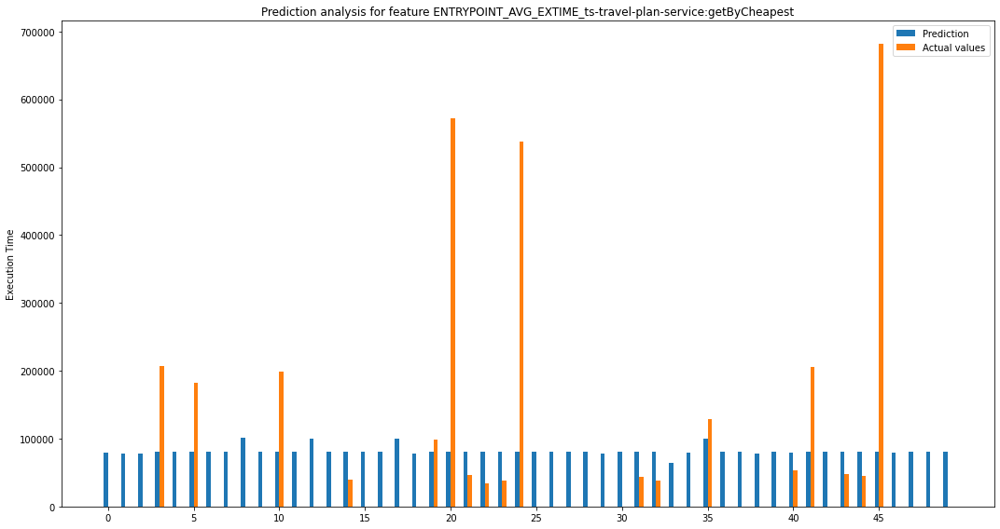

[array([79467.30094671]), array([78017.73819371]), array([78017.73819371]), array([125804.95141482]), array([80810.04858518]), array([101761.95141482]), array([80810.04858518]), array([80810.04858518]), array([101267.90172114]), array([81304.99420306]), array([117329.95141482]), array([80810.04858518]), array([100162.30611739]), array([80810.04858518]), array([41394.04858518]), array([80810.04858518]), array([80810.04858518]), array([100162.30611739]), array([78017.73819371]), array([17582.95141482]), array([491744.45141482]), array([34517.04858518]), array([47052.99420306]), array([42800.54858518]), array([456905.95141482]), array([80810.04858518]), array([80810.04858518]), array([80810.04858518]), array([80810.04858518]), array([78017.73819371]), array([80810.04858518]), array([36512.04858518]), array([42166.04858518]), array([64234.75513266]), array([79467.30094671]), array([28753.19388261]), array([80810.04858518]), array([80810.04858518]), array([78017.73819371]), array([80645.843

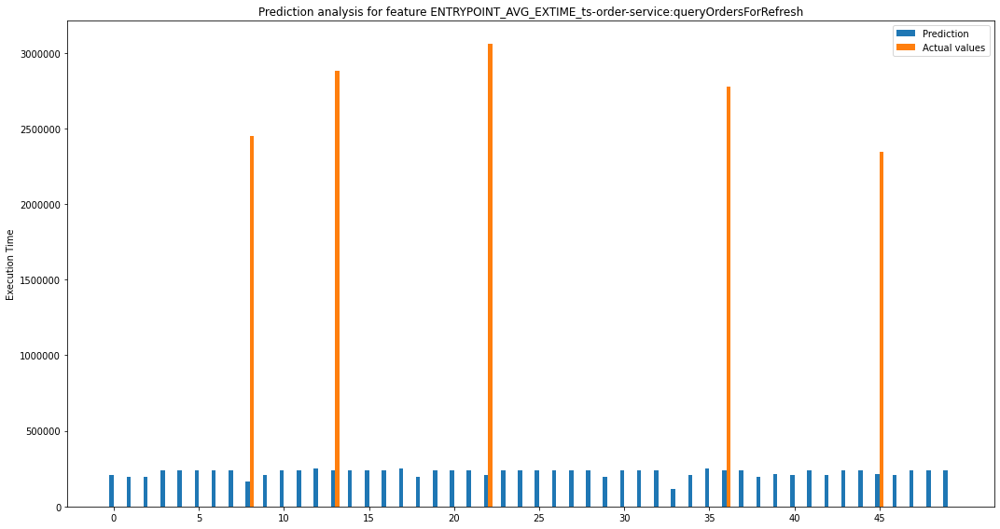

[array([207542.23131384]), array([195693.64995802]), array([195693.64995802]), array([240240.38985506]), array([240240.38985506]), array([240240.38985506]), array([240240.38985506]), array([240240.38985506]), array([2282530.59773428]), array([209032.58065477]), array([240240.38985506]), array([240240.38985506]), array([248529.26269638]), array([2640164.61014494]), array([240240.38985506]), array([240240.38985506]), array([240240.38985506]), array([248529.26269638]), array([195693.64995802]), array([240240.38985506]), array([240240.38985506]), array([240240.38985506]), array([2849930.91934523]), array([240240.38985506]), array([240240.38985506]), array([240240.38985506]), array([240240.38985506]), array([240240.38985506]), array([240240.38985506]), array([195693.64995802]), array([240240.38985506]), array([240240.38985506]), array([240240.38985506]), array([115725.78955265]), array([207542.23131384]), array([248529.26269638]), array([2538376.61014494]), array([240240.38985506]), array([

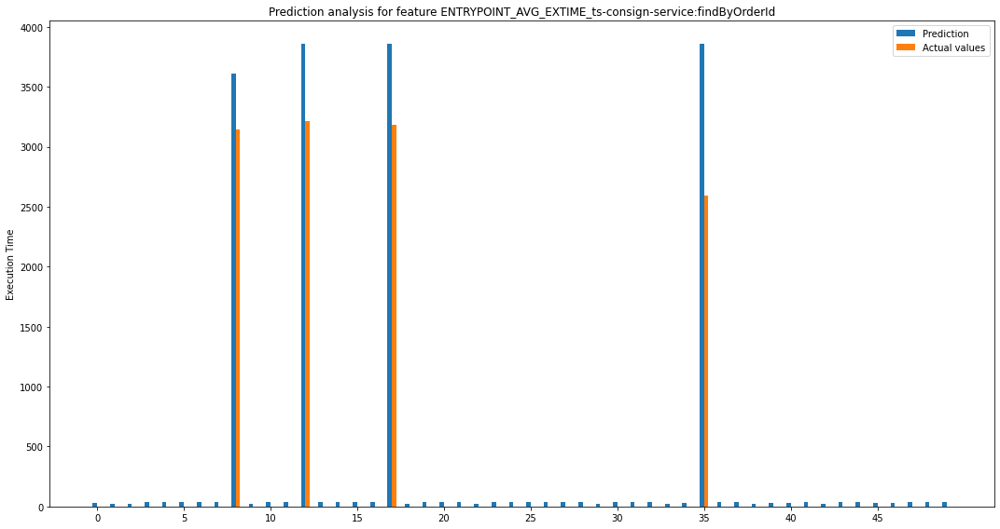

[array([26.15752962]), array([20.81273191]), array([20.81273191]), array([39.6171688]), array([39.6171688]), array([39.6171688]), array([39.6171688]), array([39.6171688]), array([468.01287961]), array([24.66976828]), array([39.6171688]), array([39.6171688]), array([639.65452782]), array([39.6171688]), array([39.6171688]), array([39.6171688]), array([39.6171688]), array([673.65452782]), array([20.81273191]), array([39.6171688]), array([39.6171688]), array([39.6171688]), array([24.66976828]), array([39.6171688]), array([39.6171688]), array([39.6171688]), array([39.6171688]), array([39.6171688]), array([39.6171688]), array([20.81273191]), array([39.6171688]), array([39.6171688]), array([39.6171688]), array([25.53694957]), array([26.15752962]), array([1264.65452782]), array([39.6171688]), array([39.6171688]), array([20.81273191]), array([29.14168465]), array([26.15752962]), array([39.6171688]), array([24.66976828]), array([39.6171688]), array([39.6171688]), array([29.14168465]), array([26.

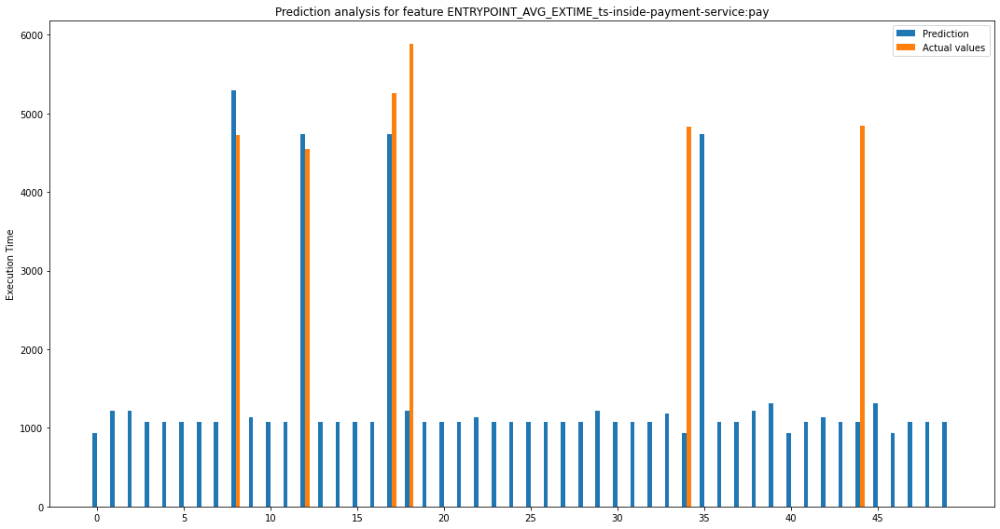

[array([933.31043356]), array([1222.67084305]), array([1222.67084305]), array([1078.16625109]), array([1078.16625109]), array([1078.16625109]), array([1078.16625109]), array([1078.16625109]), array([575.1222034]), array([1138.4337259]), array([1078.16625109]), array([1078.16625109]), array([187.72289533]), array([1078.16625109]), array([1078.16625109]), array([1078.16625109]), array([1078.16625109]), array([520.27710467]), array([4661.32915695]), array([1078.16625109]), array([1078.16625109]), array([1078.16625109]), array([1138.4337259]), array([1078.16625109]), array([1078.16625109]), array([1078.16625109]), array([1078.16625109]), array([1078.16625109]), array([1078.16625109]), array([1222.67084305]), array([1078.16625109]), array([1078.16625109]), array([1078.16625109]), array([1178.21284733]), array([3901.68956644]), array([4735.72289533]), array([1078.16625109]), array([1078.16625109]), array([1222.67084305]), array([1315.63191343]), array([933.31043356]), array([1078.16625109]),

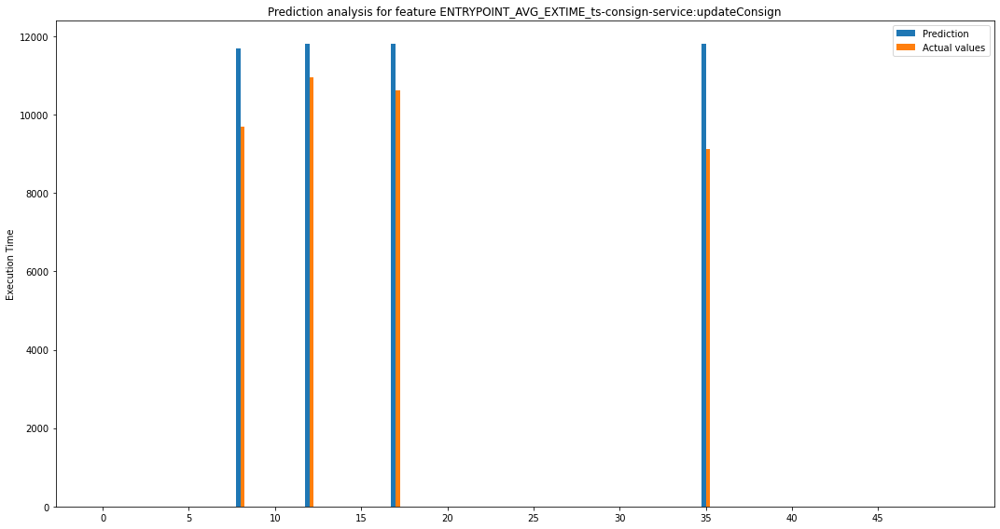

/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100


[array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([1994.25784742]), array([0.]), array([0.]), array([0.]), array([858.56224926]), array([0.]), array([0.]), array([0.]), array([0.]), array([1179.56224926]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([2689.56224926]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([3977064.36200573]), array([0.]), array([0.]), array([0.]), array([737129.13585618]), array([0.]), array([0.]), array([0.]), array([0.]), array([1391367.09988177]), array([0.]), array([0.]), arra

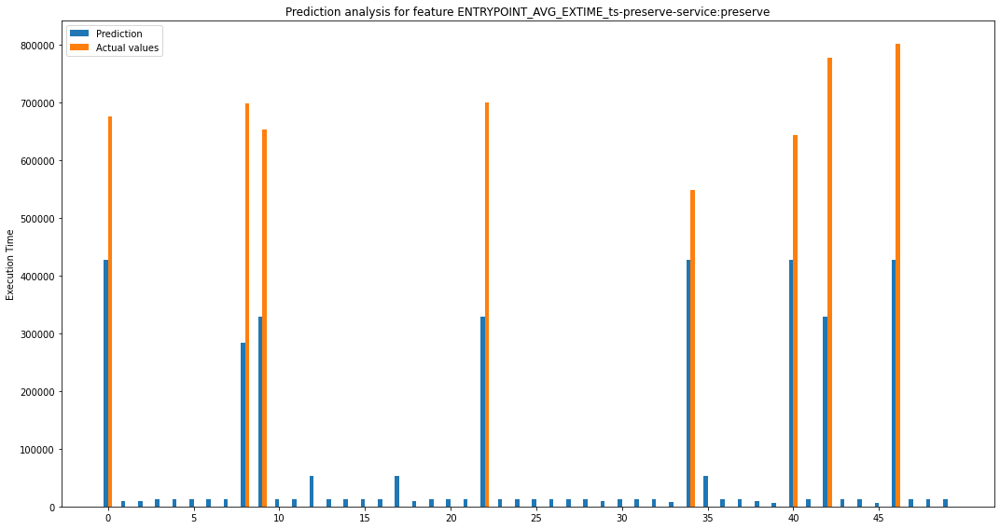

[array([249544.46674871]), array([9774.2066175]), array([9774.2066175]), array([12939.86911623]), array([12939.86911623]), array([12939.86911623]), array([12939.86911623]), array([12939.86911623]), array([414689.72265145]), array([324855.1328492]), array([12939.86911623]), array([12939.86911623]), array([53664.48989452]), array([12939.86911623]), array([12939.86911623]), array([12939.86911623]), array([12939.86911623]), array([53664.48989452]), array([9774.2066175]), array([12939.86911623]), array([12939.86911623]), array([12939.86911623]), array([370954.1328492]), array([12939.86911623]), array([12939.86911623]), array([12939.86911623]), array([12939.86911623]), array([12939.86911623]), array([12939.86911623]), array([9774.2066175]), array([12939.86911623]), array([12939.86911623]), array([12939.86911623]), array([8431.71840814]), array([121484.46674871]), array([53664.48989452]), array([12939.86911623]), array([12939.86911623]), array([9774.2066175]), array([6211.51219366]), array([2

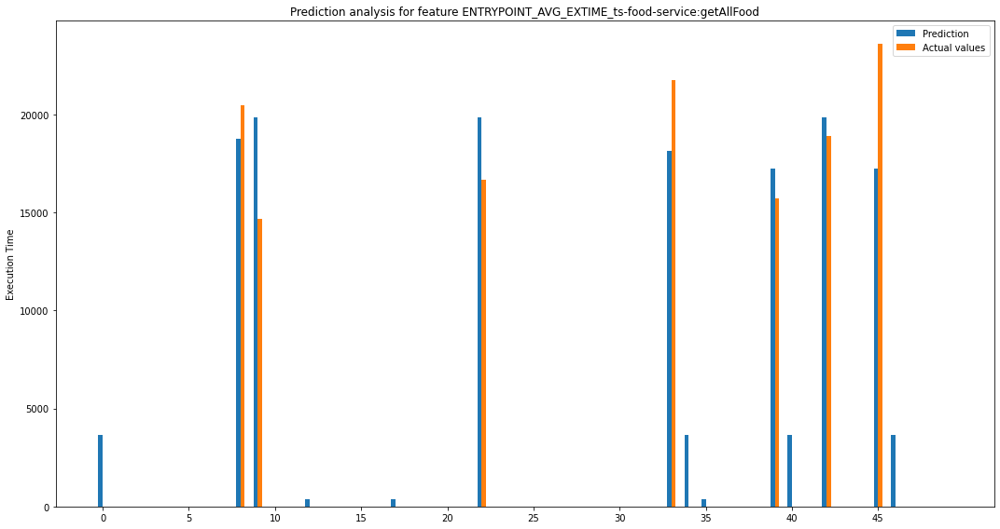

[array([3666.51306218]), array([0.]), array([0.]), array([6.066762]), array([6.066762]), array([6.066762]), array([6.066762]), array([6.066762]), array([1752.46226699]), array([5176.51964807]), array([6.066762]), array([6.066762]), array([371.00180278]), array([6.066762]), array([6.066762]), array([6.066762]), array([6.066762]), array([371.00180278]), array([0.]), array([6.066762]), array([6.066762]), array([6.066762]), array([3168.51964807]), array([6.066762]), array([6.066762]), array([6.066762]), array([6.066762]), array([6.066762]), array([6.066762]), array([0.]), array([6.066762]), array([6.066762]), array([6.066762]), array([3603.72883442]), array([3666.51306218]), array([371.00180278]), array([6.066762]), array([6.066762]), array([0.]), array([1548.36478933]), array([3666.51306218]), array([6.066762]), array([953.51964807]), array([6.066762]), array([6.066762]), array([6345.63521067]), array([3666.51306218]), array([6.066762]), array([6.066762]), array([6.066762])] [array([13443

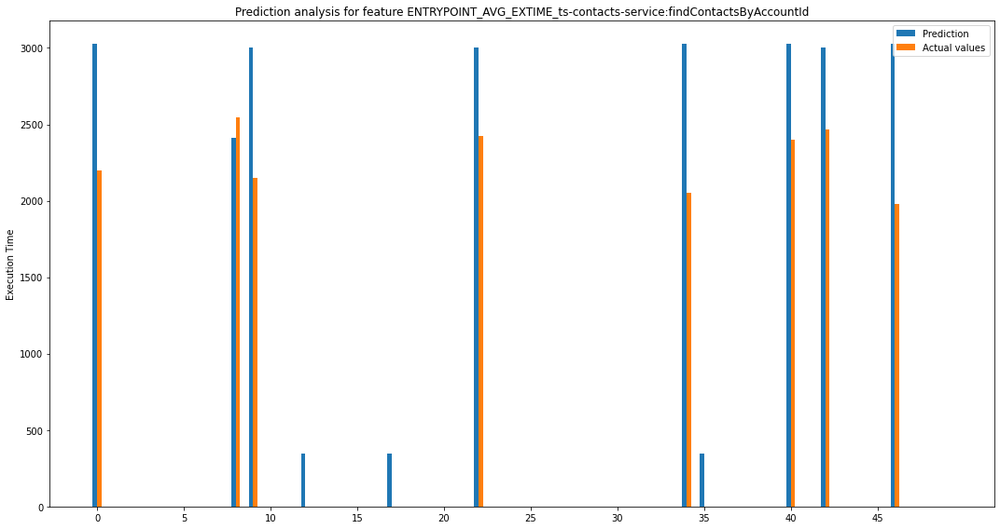

[array([829.98285046]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([130.08779259]), array([855.19144508]), array([0.]), array([0.]), array([343.74086855]), array([0.]), array([0.]), array([0.]), array([0.]), array([343.74086855]), array([0.]), array([0.]), array([0.]), array([0.]), array([581.19144508]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([975.98285046]), array([343.74086855]), array([0.]), array([0.]), array([0.]), array([0.]), array([625.98285046]), array([0.]), array([538.19144508]), array([0.]), array([0.]), array([0.]), array([1048.98285046]), array([0.]), array([0.]), array([0.])] [array([688871.53205067]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([16922.83378142]), array([731352.40773287]), array([0.]), array([0.]), array([118157.78471038]), array([0.]), arra

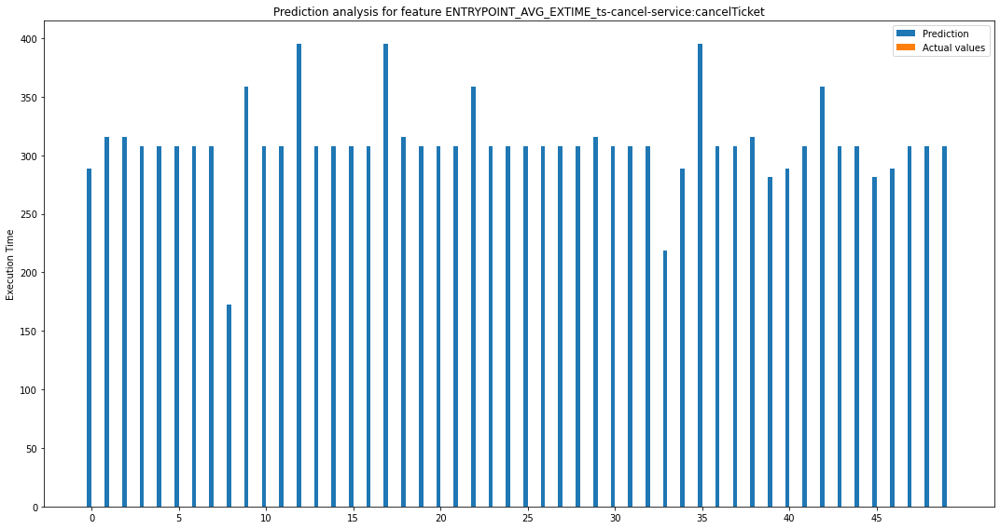

[array([288.37005724]), array([315.74206108]), array([315.74206108]), array([307.45036502]), array([307.45036502]), array([307.45036502]), array([307.45036502]), array([307.45036502]), array([172.43563596]), array([358.90442424]), array([307.45036502]), array([307.45036502]), array([395.07659638]), array([307.45036502]), array([307.45036502]), array([307.45036502]), array([307.45036502]), array([395.07659638]), array([315.74206108]), array([307.45036502]), array([307.45036502]), array([307.45036502]), array([358.90442424]), array([307.45036502]), array([307.45036502]), array([307.45036502]), array([307.45036502]), array([307.45036502]), array([307.45036502]), array([315.74206108]), array([307.45036502]), array([307.45036502]), array([307.45036502]), array([218.82428373]), array([288.37005724]), array([395.07659638]), array([307.45036502]), array([307.45036502]), array([315.74206108]), array([281.3281416]), array([288.37005724]), array([307.45036502]), array([358.90442424]), array([307.

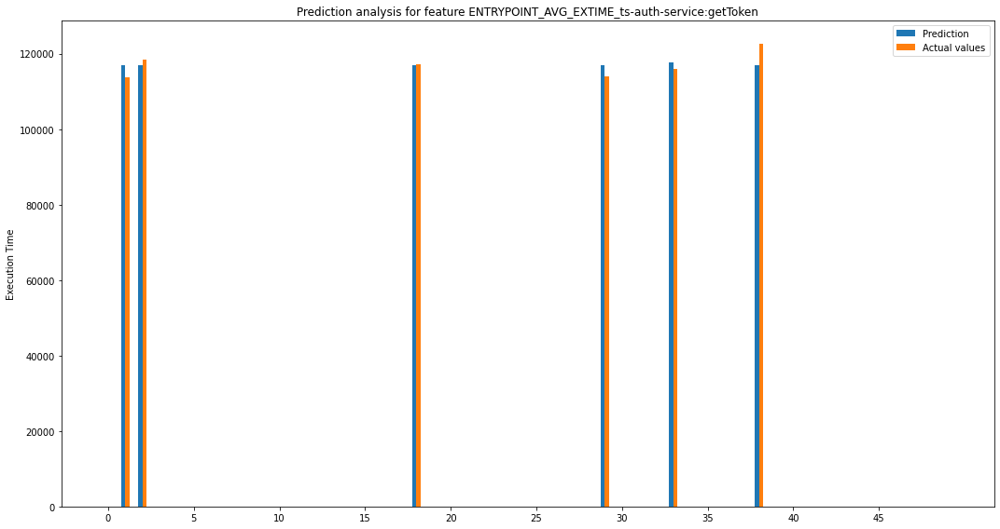

[array([0.]), array([3242.85601776]), array([1394.14398224]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([209.14398224]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([2966.85601776]), array([0.]), array([0.]), array([0.]), array([1931.16868231]), array([0.]), array([0.]), array([0.]), array([0.]), array([5521.14398224]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([0.]), array([10516115.15192055]), array([1943637.44321677]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([43741.2053073

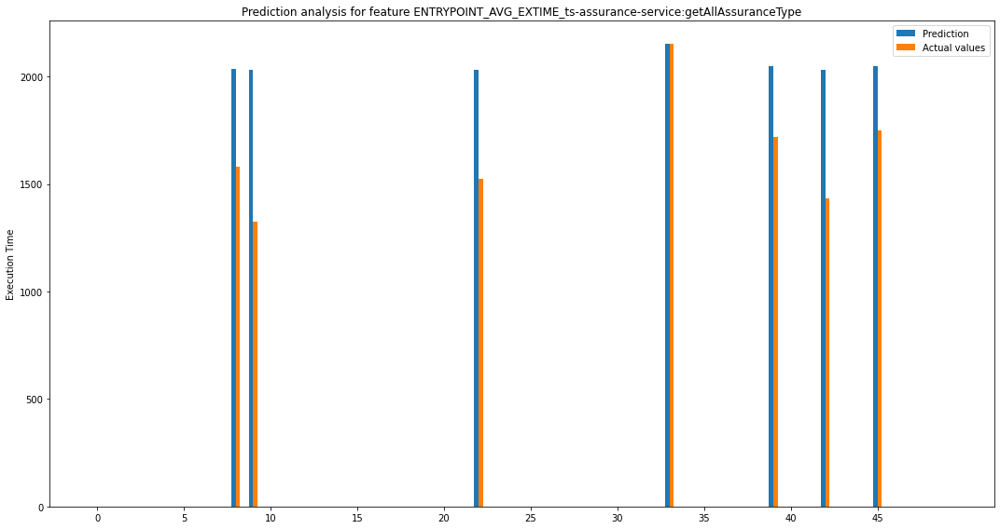

[array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([451.94097944]), array([704.14722388]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([503.14722388]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([1.0996001]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([329.99101206]), array([0.]), array([0.]), array([598.14722388]), array([0.]), array([0.]), array([297.99101206]), array([0.]), array([0.]), array([0.]), array([0.])] [array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([204250.64889538]), array([495823.31290211]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0

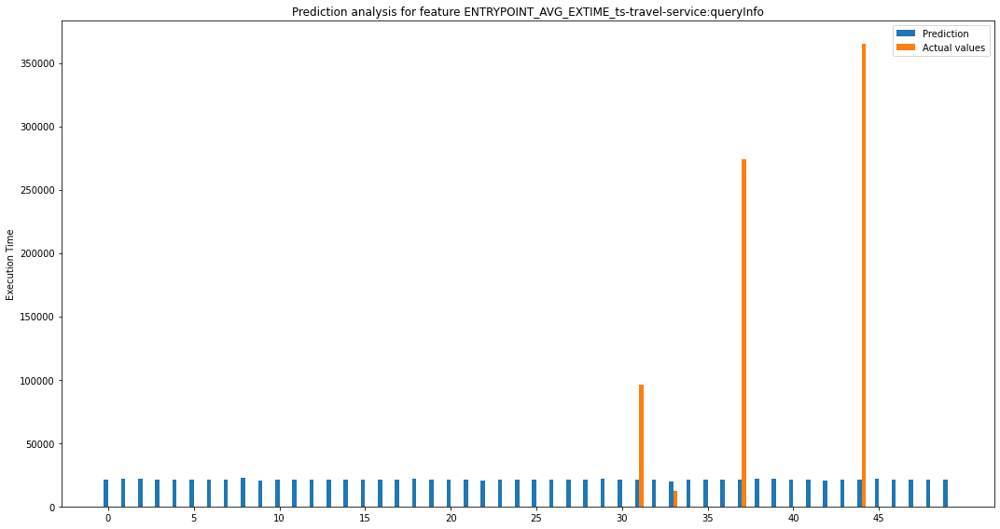

[array([21195.13225666]), array([21739.72708986]), array([21739.72708986]), array([21295.9242603]), array([21295.9242603]), array([21295.9242603]), array([21295.9242603]), array([21295.9242603]), array([22878.32341507]), array([20617.92821585]), array([21295.9242603]), array([21295.9242603]), array([21123.9588697]), array([21295.9242603]), array([21295.9242603]), array([21295.9242603]), array([21295.9242603]), array([21123.9588697]), array([21739.72708986]), array([21295.9242603]), array([21295.9242603]), array([21295.9242603]), array([20617.92821585]), array([21295.9242603]), array([21295.9242603]), array([21295.9242603]), array([21295.9242603]), array([21295.9242603]), array([21295.9242603]), array([21739.72708986]), array([21295.9242603]), array([74663.0757397]), array([21295.9242603]), array([7198.98797645]), array([21195.13225666]), array([21123.9588697]), array([21295.9242603]), array([252972.0757397]), array([21739.72708986]), array([21702.57534027]), array([21195.13225666]), ar

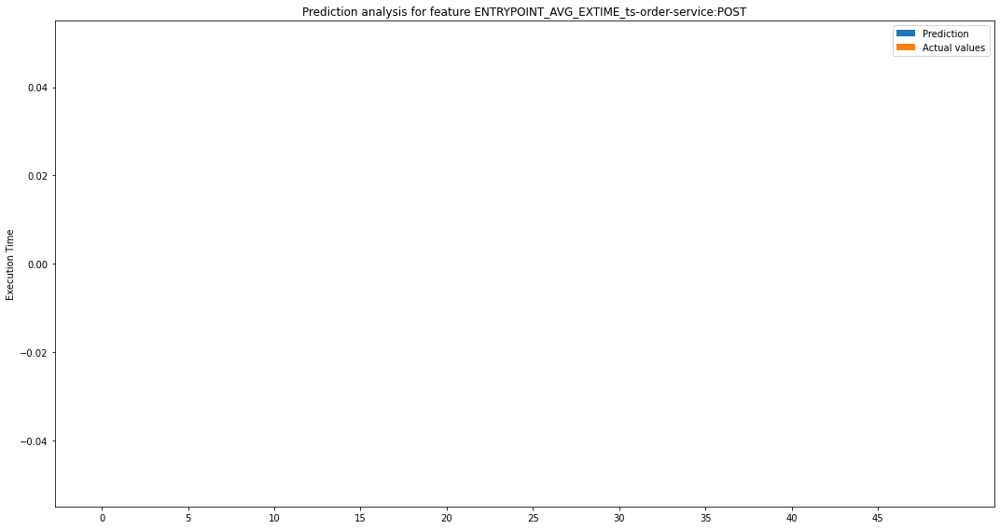

[array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]

/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  return abs((true-pred)/true) * 100
/home/dimenna/AVV/git/obstack/notebooks/env/lib/python3.9/site-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  return abs((true-pred)/true) * 100
/home/dimenna/AVV/git/obstack/notebooks/env/lib/python3.9/site-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


[207542.23131384348, 195693.64995802194, 195693.64995802194, 240240.38985505607, 240240.38985505607, 240240.38985505607, 240240.38985505607, 240240.38985505607, 2282530.5977342753, 209032.580654767, 240240.38985505607, 240240.38985505607, 248529.2626963754, 2640164.610144944, 240240.38985505607, 240240.38985505607, 240240.38985505607, 248529.2626963754, 195693.64995802194, 240240.38985505607, 240240.38985505607, 240240.38985505607, 2849930.919345233, 240240.38985505607, 240240.38985505607, 240240.38985505607, 240240.38985505607, 240240.38985505607, 240240.38985505607, 195693.64995802194, 240240.38985505607, 240240.38985505607, 240240.38985505607, 115725.78955265126, 207542.23131384348, 248529.2626963754, 2538376.610144944, 240240.38985505607, 195693.64995802194, 215102.8986646991, 207542.23131384348, 240240.38985505607, 209032.580654767, 240240.38985505607, 240240.38985505607, 2129701.101335301, 207542.23131384348, 240240.38985505607, 240240.38985505607, 240240.38985505607, 240240.3898

/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100
/home/dimenna/AVV/git/obstack/notebooks/env/lib/python3.9/site-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  return abs((true-pred)/true) * 100


ERRORS [933.3104335642381, 1222.6708430503274, 1222.6708430503274, 1078.166251089149, 1078.166251089149, 1078.166251089149, 1078.166251089149, 1078.166251089149, 575.1222033967406, 1138.4337258950898, 1078.166251089149, 1078.166251089149, 187.72289533129333, 1078.166251089149, 1078.166251089149, 1078.166251089149, 1078.166251089149, 520.2771046687067, 4661.329156949672, 1078.166251089149, 1078.166251089149, 1078.166251089149, 1138.4337258950898, 1078.166251089149, 1078.166251089149, 1078.166251089149, 1078.166251089149, 1078.166251089149, 1078.166251089149, 1222.6708430503274, 1078.166251089149, 1078.166251089149, 1078.166251089149, 1178.2128473274547, 3901.6895664357617, 4735.722895331293, 1078.166251089149, 1078.166251089149, 1222.6708430503274, 1315.631913425778, 933.3104335642381, 1078.166251089149, 1138.4337258950898, 1078.166251089149, 3760.8337489108508, 1315.631913425778, 933.3104335642381, 1078.166251089149, 1078.166251089149, 1078.166251089149, 4783.833748910851, 1078.1662510

/home/dimenna/AVV/git/obstack/notebooks/env/lib/python3.9/site-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  return abs((true-pred)/true) * 100
/home/dimenna/AVV/git/obstack/notebooks/env/lib/python3.9/site-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in sub

ERRORS [3666.5130621754606, 0.0, 0.0, 6.066762000196312, 6.066762000196312, 6.066762000196312, 6.066762000196312, 6.066762000196312, 1752.4622669868077, 5176.519648074456, 6.066762000196312, 6.066762000196312, 371.0018027767292, 6.066762000196312, 6.066762000196312, 6.066762000196312, 6.066762000196312, 371.0018027767292, 0.0, 6.066762000196312, 6.066762000196312, 6.066762000196312, 3168.519648074456, 6.066762000196312, 6.066762000196312, 6.066762000196312, 6.066762000196312, 6.066762000196312, 6.066762000196312, 0.0, 6.066762000196312, 6.066762000196312, 6.066762000196312, 3603.7288344209082, 3666.5130621754606, 371.0018027767292, 6.066762000196312, 6.066762000196312, 0.0, 1548.3647893275192, 3666.5130621754606, 6.066762000196312, 953.5196480744562, 6.066762000196312, 6.066762000196312, 6345.635210672484, 3666.5130621754606, 6.066762000196312, 6.066762000196312, 6.066762000196312, 6.066762000196312, 6.066762000196312, 6.066762000196312, 6.066762000196312, 6.066762000196312, 0.0, 6.066

/home/dimenna/AVV/git/obstack/notebooks/env/lib/python3.9/site-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  return abs((true-pred)/true) * 100
/home/dimenna/AVV/git/obstack/notebooks/env/lib/python3.9/site-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in sub

ERRORS [0.0, 3242.856017759739, 1394.1439822402754, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 209.14398224024626, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2966.856017759739, 0.0, 0.0, 0.0, 1931.1686823055352, 0.0, 0.0, 0.0, 0.0, 5521.143982240261, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2132.856017759739, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 337.8560177597392, 0.0, 0.0, 0.0, 0.0, 505.66885597979126, 0.0, 0.0, 0.0, 2168.143982240261, 0.0, 0.0, 0.0, 2565.856017759739, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1952.1439822402608, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 295.1439822402608, 0.0, 0.0, 0.0, 0.0, 3985.856017759739, 0.0, 0.0, 0.0, 0.0, 0.0, 11849.64398224026, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1117.8560177597392, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1436.1439822402608, 0.0, 0.0, 0.0, 4893.331144020209, 0.0, 0.0, 0.0, 0.0, 0.0

/home/dimenna/AVV/git/obstack/notebooks/env/lib/python3.9/site-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100


0.25 Quartile (MAE: 21295.924260, MSE: 453516390.100235, MAPE: nan)
0.50 Quartile (MAE: 21295.924260, MSE: 453516390.100235, MAPE: nan)
0.75 Quartile (MAE: 21295.924260, MSE: 453516390.100235, MAPE: nan)
ERRORS [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

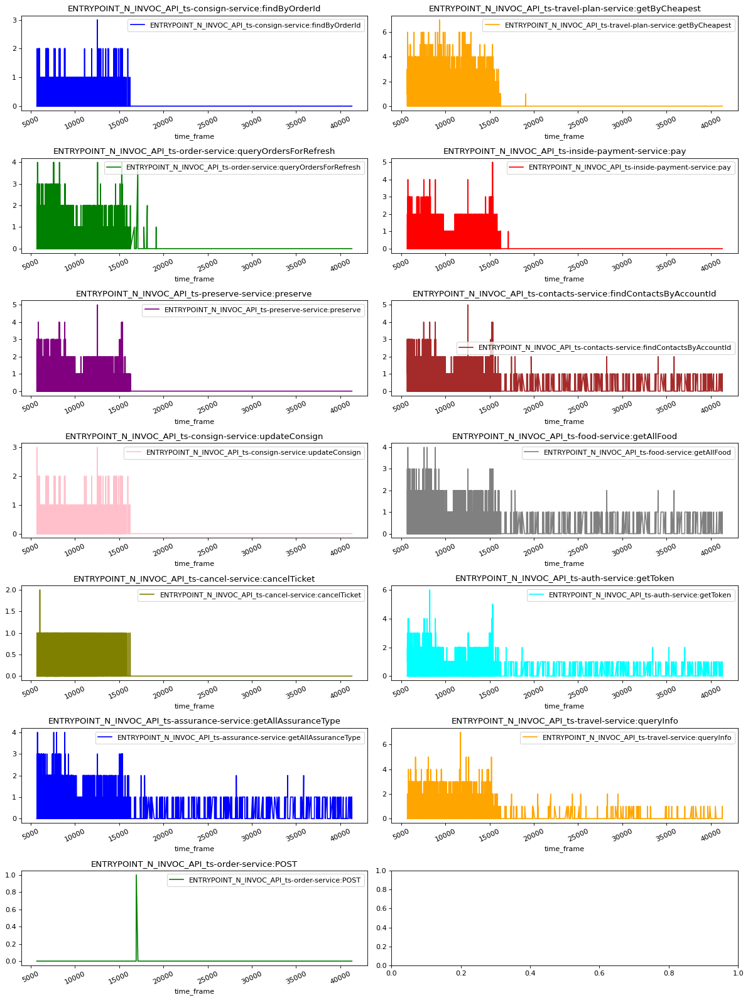

Data normalized
Input size 45 Output size 13
TOTAL MSE:  0.0006070675679204392
TOTAL MAE:  0.004416858418343686
TOTAL MAPE:  96633400439.55
FIRST 50 predictions
ENTRY ENTRYPOINT_AVG_EXTIME_ts-consign-service:findByOrderId
PRED [39.00662396368325, 19.539517142247064, 39.00662396368325, 30.798589774327173, 39.00662396368325, 22.645616077636188, 39.00662396368325, 39.00662396368325, 19.539517142247064, 19.539517142247064, 39.00662396368325, 22.645616077636188, 22.645616077636188, 39.00662396368325, 39.00662396368325, 19.539517142247064, 39.00662396368325, 39.00662396368325, 51.30336079146568, 34.804644192859, 19.539517142247064, 51.30336079146568, 39.53486582627844, 39.00662396368325, 39.00662396368325, 51.30336079146568, 34.804644192859, 19.539517142247064, 3869.4232904684163, 22.645616077636188, 34.804644192859, 39.00662396368325, 39.00662396368325, 19.539517142247064, 39.00662396368325, 39.00662396368325, 3644.241934335473, 3618.3649909473447, 19.539517142247064, 39.00662396368325, 39.

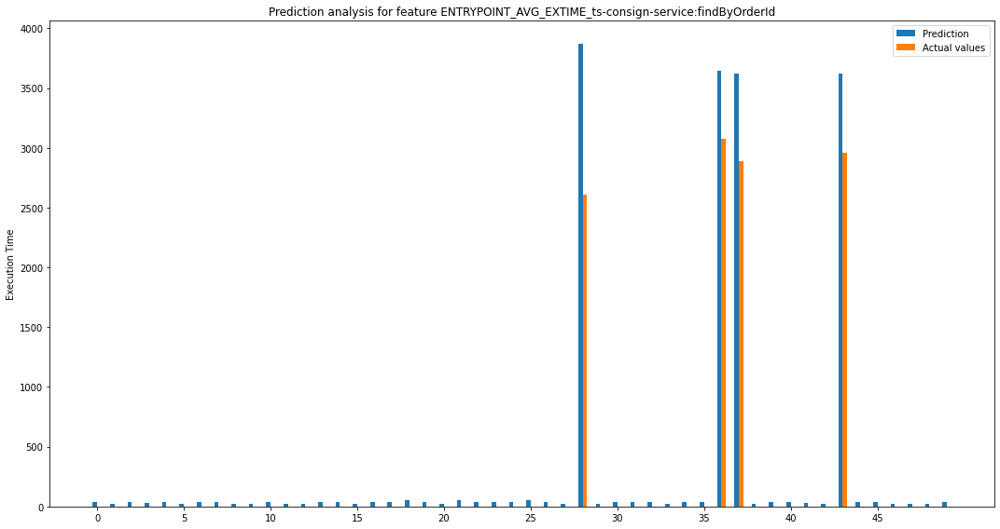

[array([39.00662396]), array([19.53951714]), array([39.00662396]), array([30.79858977]), array([39.00662396]), array([22.64561608]), array([39.00662396]), array([39.00662396]), array([19.53951714]), array([19.53951714]), array([39.00662396]), array([22.64561608]), array([22.64561608]), array([39.00662396]), array([39.00662396]), array([19.53951714]), array([39.00662396]), array([39.00662396]), array([51.30336079]), array([34.80464419]), array([19.53951714]), array([51.30336079]), array([39.53486583]), array([39.00662396]), array([39.00662396]), array([51.30336079]), array([34.80464419]), array([19.53951714]), array([1261.42329047]), array([22.64561608]), array([34.80464419]), array([39.00662396]), array([39.00662396]), array([19.53951714]), array([39.00662396]), array([39.00662396]), array([565.24193434]), array([729.36499095]), array([19.53951714]), array([39.00662396]), array([39.00662396]), array([30.79858977]), array([22.64561608]), array([655.36499095]), array([39.00662396]), arra

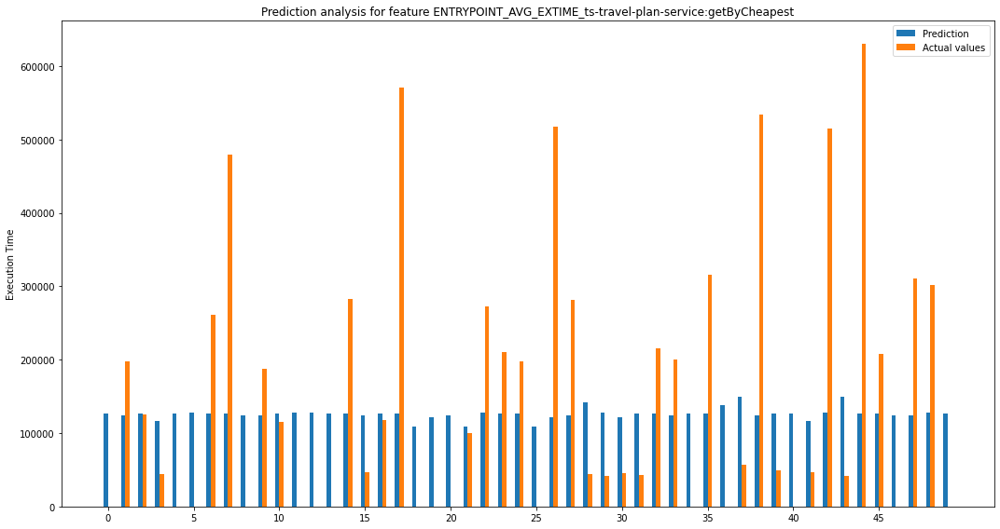

[array([126821.96477455]), array([74359.5736305]), array([1687.96477455]), array([72576.17871727]), array([126821.96477455]), array([127502.20858411]), array([134055.03522545]), array([352399.03522545]), array([123878.4263695]), array([63650.0736305]), array([11955.46477455]), array([127502.20858411]), array([127502.20858411]), array([126821.96477455]), array([156588.03522545]), array([76856.4263695]), array([8474.46477455]), array([443667.03522545]), array([108639.33539033]), array([121876.18193087]), array([123878.4263695]), array([8856.002057]), array([143642.10115008]), array([83010.03522545]), array([70562.03522545]), array([108639.33539033]), array([395222.81806913]), array([157809.24029717]), array([96830.98945689]), array([85997.20858411]), array([76724.18193087]), array([83485.96477455]), array([88629.03522545]), array([75892.5736305]), array([126821.96477455]), array([189466.03522545]), array([137895.16831098]), array([92824.27500958]), array([410388.5736305]), array([77108.9

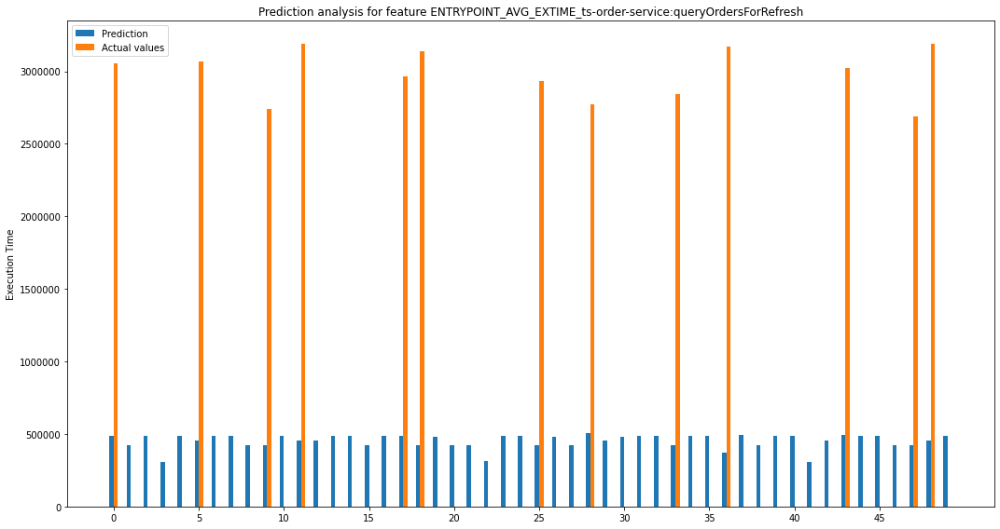

[array([2570509.14335743]), array([425189.26552144]), array([486462.85664257]), array([304267.76449074]), array([486462.85664257]), array([2612033.88949127]), array([486462.85664257]), array([486462.85664257]), array([425189.26552144]), array([2316522.73447856]), array([486462.85664257]), array([2731899.88949127]), array([454965.11050873]), array([486462.85664257]), array([486462.85664257]), array([425189.26552144]), array([486462.85664257]), array([2477123.14335743]), array([2714885.19612523]), array([478013.62696508]), array([425189.26552144]), array([422692.80387477]), array([311950.56062655]), array([486462.85664257]), array([486462.85664257]), array([2509865.19612523]), array([478013.62696508]), array([425189.26552144]), array([2264970.72279193]), array([454965.11050873]), array([478013.62696508]), array([486462.85664257]), array([486462.85664257]), array([2417459.73447856]), array([486462.85664257]), array([486462.85664257]), array([2800614.84145938]), array([493882.45640535]), a

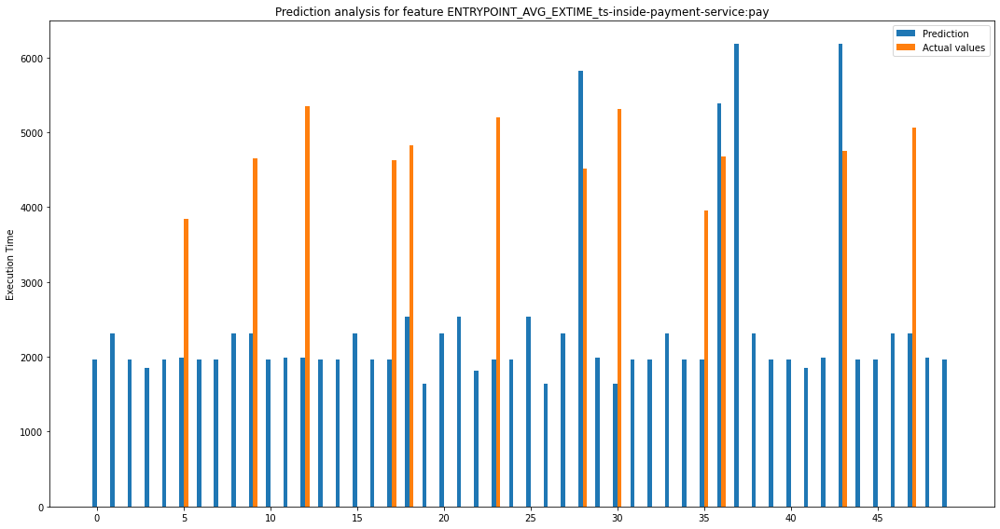

[array([1963.16680313]), array([2308.11199451]), array([1963.16680313]), array([1852.43106332]), array([1963.16680313]), array([1855.21951845]), array([1963.16680313]), array([1963.16680313]), array([2308.11199451]), array([2349.88800549]), array([1963.16680313]), array([1987.78048155]), array([3365.21951845]), array([1963.16680313]), array([1963.16680313]), array([2308.11199451]), array([1963.16680313]), array([2667.83319687]), array([2298.74548773]), array([1645.61695735]), array([2308.11199451]), array([2534.25451227]), array([1819.21669312]), array([3235.83319687]), array([1963.16680313]), array([2534.25451227]), array([1645.61695735]), array([2308.11199451]), array([1303.57396544]), array([1987.78048155]), array([3661.38304265]), array([1963.16680313]), array([1963.16680313]), array([2308.11199451]), array([1963.16680313]), array([1987.83319687]), array([699.54029717]), array([6181.5775049]), array([2308.11199451]), array([1963.16680313]), array([1963.16680313]), array([1852.43106

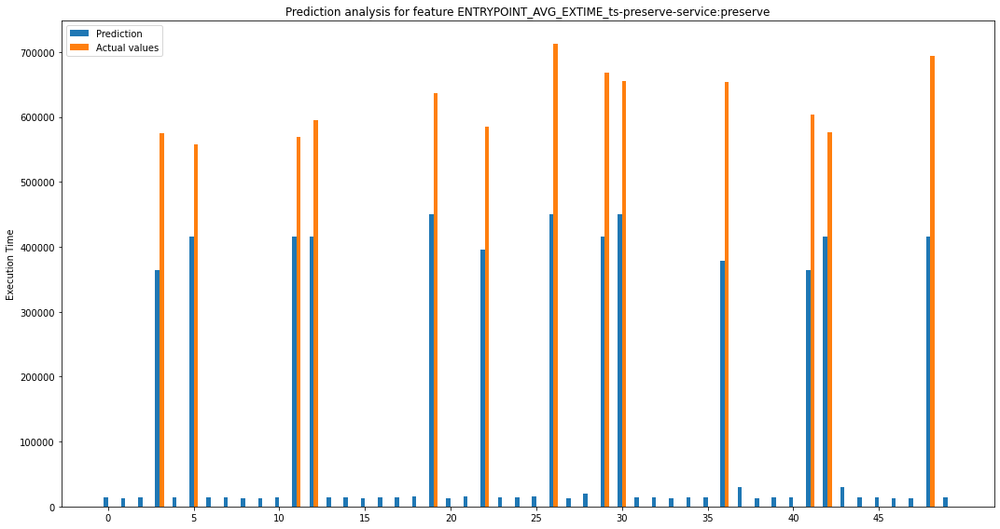

[array([14645.34046619]), array([12122.02305896]), array([14645.34046619]), array([210853.76235484]), array([14645.34046619]), array([141872.49161211]), array([14645.34046619]), array([14645.34046619]), array([12122.02305896]), array([12122.02305896]), array([14645.34046619]), array([152946.49161211]), array([179369.49161211]), array([14645.34046619]), array([14645.34046619]), array([12122.02305896]), array([14645.34046619]), array([14645.34046619]), array([15075.42543428]), array([187076.24221268]), array([12122.02305896]), array([15075.42543428]), array([188692.85161853]), array([14645.34046619]), array([14645.34046619]), array([15075.42543428]), array([262088.24221268]), array([12122.02305896]), array([20131.11126937]), array([252908.49161211]), array([204486.24221268]), array([14645.34046619]), array([14645.34046619]), array([12122.02305896]), array([14645.34046619]), array([14645.34046619]), array([275903.31939371]), array([30343.29802315]), array([12122.02305896]), array([14645.3

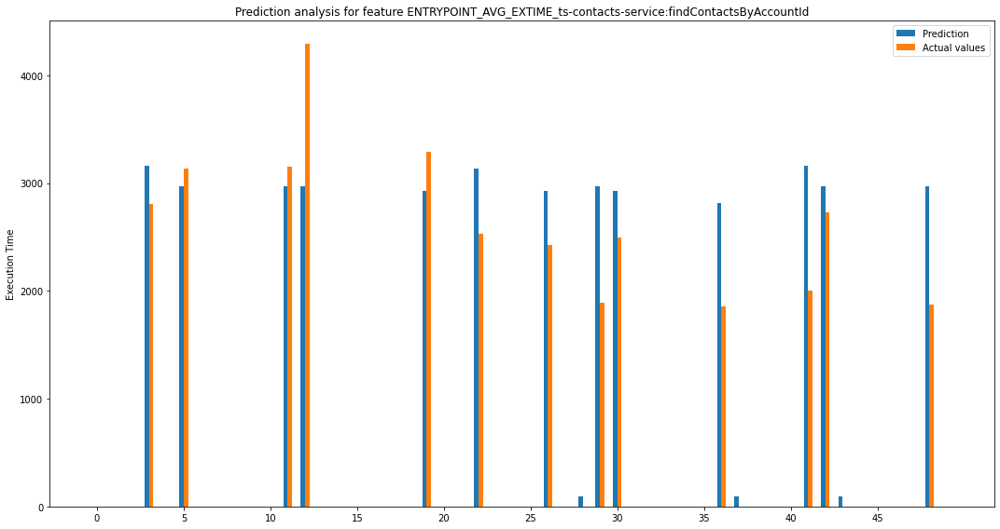

/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100


[array([0.]), array([0.]), array([0.]), array([352.53755821]), array([0.]), array([166.25271921]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([182.25271921]), array([1320.25271921]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([364.98942054]), array([0.]), array([0.]), array([606.03387187]), array([0.]), array([0.]), array([0.]), array([501.01057946]), array([0.]), array([91.58208177]), array([1083.74728079]), array([435.01057946]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([960.69683258]), array([96.00504016]), array([0.]), array([0.]), array([0.]), array([1159.53755821]), array([237.74728079]), array([96.00504016]), array([0.]), array([0.]), array([0.]), array([0.]), array([1098.74728079]), array([0.])] [array([0.]), array([0.]), array([0.]), array([124282.72994919]), array([0.]), array([27639.96664598]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([33216.053660

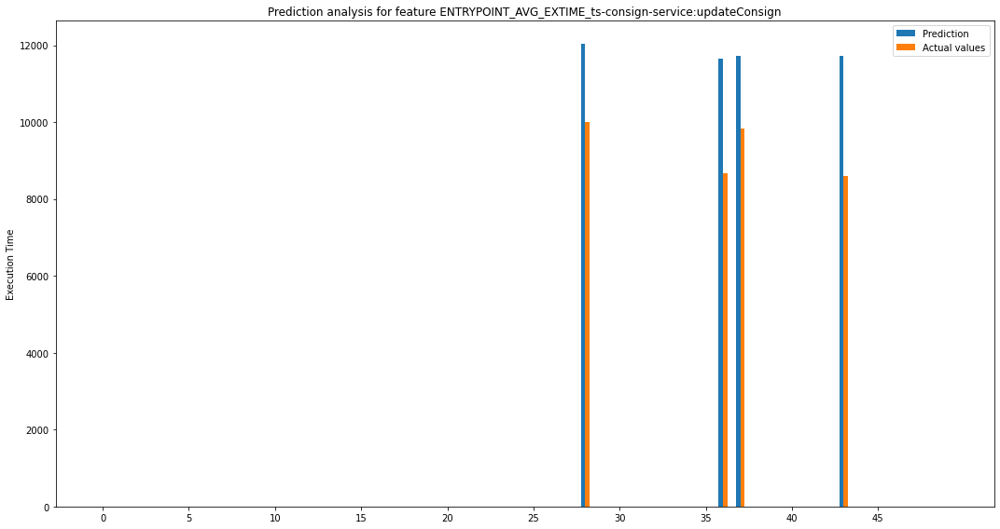

[array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([2021.90090156]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([2964.05961722]), array([1885.49265236]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([3139.49265236]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array

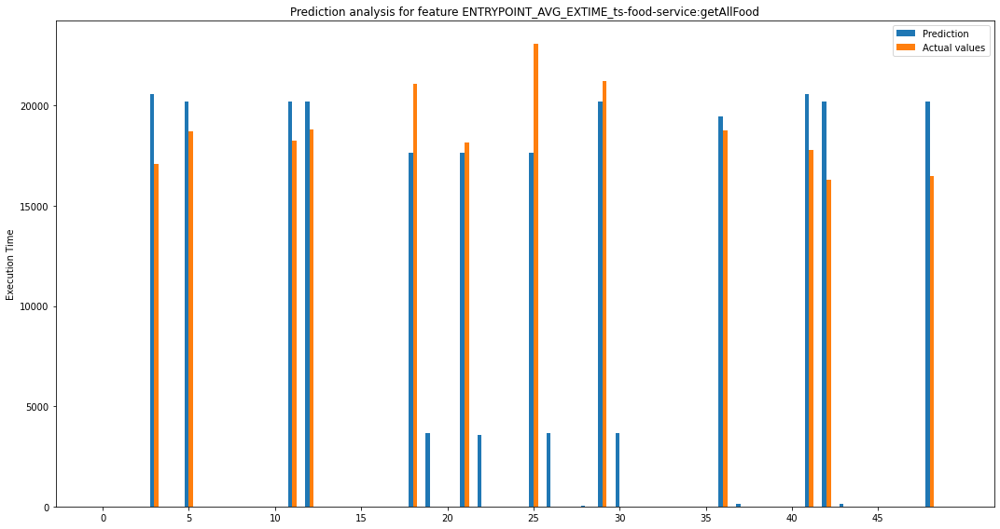

[array([8.32748342]), array([0.]), array([8.32748342]), array([3483.02227461]), array([8.32748342]), array([1485.74430954]), array([8.32748342]), array([8.32748342]), array([0.]), array([0.]), array([8.32748342]), array([1944.74430954]), array([1380.74430954]), array([8.32748342]), array([8.32748342]), array([0.]), array([8.32748342]), array([8.32748342]), array([3459.0719585]), array([3660.45506885]), array([0.]), array([541.0719585]), array([3555.58816604]), array([8.32748342]), array([8.32748342]), array([5443.0719585]), array([3660.45506885]), array([0.]), array([19.1414767]), array([1009.75569046]), array([3660.45506885]), array([8.32748342]), array([8.32748342]), array([0.]), array([8.32748342]), array([8.32748342]), array([703.02441727]), array([117.83822633]), array([0.]), array([8.32748342]), array([8.32748342]), array([2756.02227461]), array([3920.74430954]), array([117.83822633]), array([8.32748342]), array([8.32748342]), array([0.]), array([0.]), array([3701.74430954]), arr

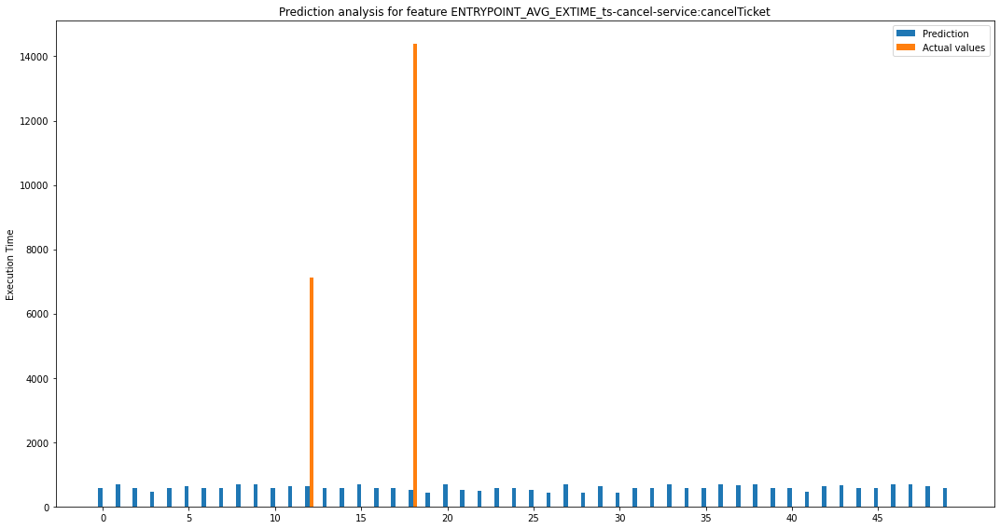

[array([587.09057542]), array([680.70117929]), array([587.09057542]), array([470.68123333]), array([587.09057542]), array([617.45085558]), array([587.09057542]), array([587.09057542]), array([680.70117929]), array([680.70117929]), array([587.09057542]), array([617.45085558]), array([6515.54914442]), array([587.09057542]), array([587.09057542]), array([680.70117929]), array([587.09057542]), array([587.09057542]), array([13881.12512802]), array([415.91502898]), array([680.70117929]), array([501.87487198]), array([497.68929838]), array([587.09057542]), array([587.09057542]), array([501.87487198]), array([415.91502898]), array([680.70117929]), array([421.68303373]), array([617.45085558]), array([415.91502898]), array([587.09057542]), array([587.09057542]), array([680.70117929]), array([587.09057542]), array([587.09057542]), array([677.41038566]), array([669.7361014]), array([680.70117929]), array([587.09057542]), array([587.09057542]), array([470.68123333]), array([617.45085558]), array([6

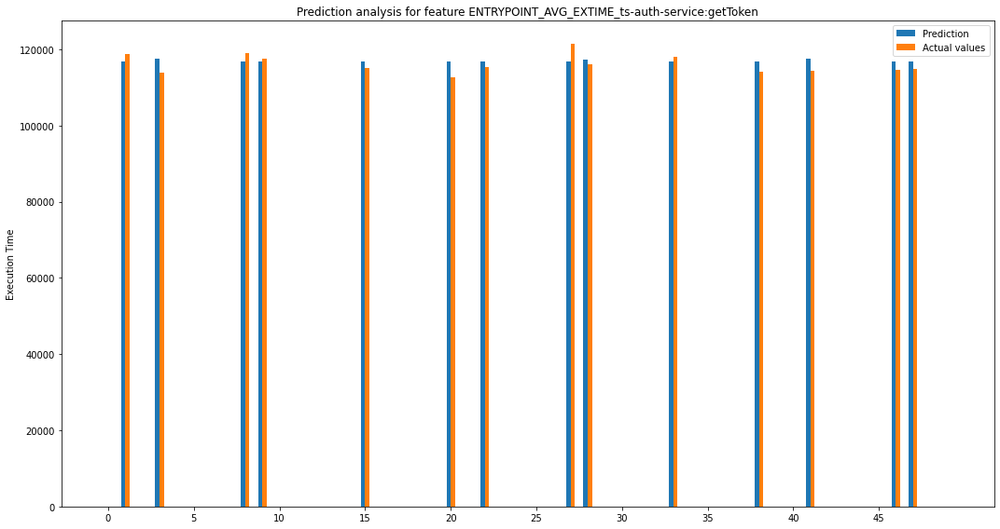

[array([0.]), array([1961.93985775]), array([0.]), array([3752.66584655]), array([0.]), array([0.]), array([0.]), array([0.]), array([2070.93985775]), array([678.93985775]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([1889.06014225]), array([0.]), array([0.]), array([0.]), array([0.]), array([4328.06014225]), array([0.]), array([1466.13779569]), array([0.]), array([0.]), array([0.]), array([0.]), array([4488.93985775]), array([1243.18257452]), array([0.]), array([0.]), array([0.]), array([0.]), array([1104.93985775]), array([0.]), array([0.]), array([0.]), array([0.]), array([2706.06014225]), array([0.]), array([0.]), array([3256.66584655]), array([0.]), array([0.]), array([0.]), array([0.]), array([2242.06014225]), array([2152.06014225]), array([0.]), array([0.])] [array([0.]), array([3849208.00544378]), array([0.]), array([14082500.95584399]), array([0.]), array([0.]), array([0.]), array([0.]), array([4288791.89443415]), array([460959.33044702]), array([0.

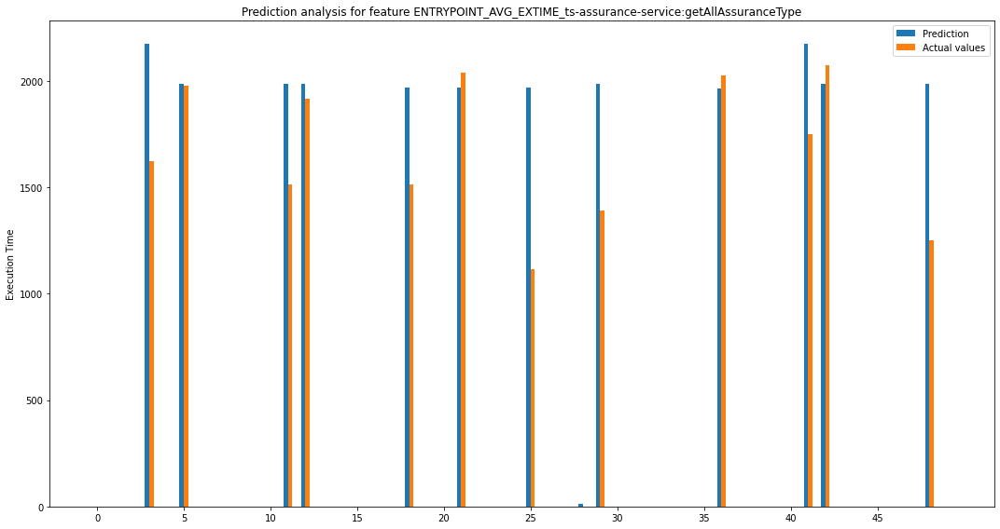

[array([0.]), array([0.]), array([0.]), array([551.12763078]), array([0.]), array([9.96448902]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([471.96448902]), array([71.96448902]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([456.75092497]), array([0.]), array([0.]), array([68.24907503]), array([0.]), array([0.]), array([0.]), array([851.75092497]), array([0.]), array([0.]), array([12.49774037]), array([595.96448902]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([63.32715725]), array([0.53549768]), array([0.]), array([0.]), array([0.]), array([425.12763078]), array([87.03551098]), array([0.53549768]), array([0.]), array([0.]), array([0.]), array([0.]), array([737.96448902]), array([0.])] [array([0.]), array([0.]), array([0.]), array([303741.66540435]), array([0.]), array([99.29104134]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([222750.47889177]), array([5178.887679

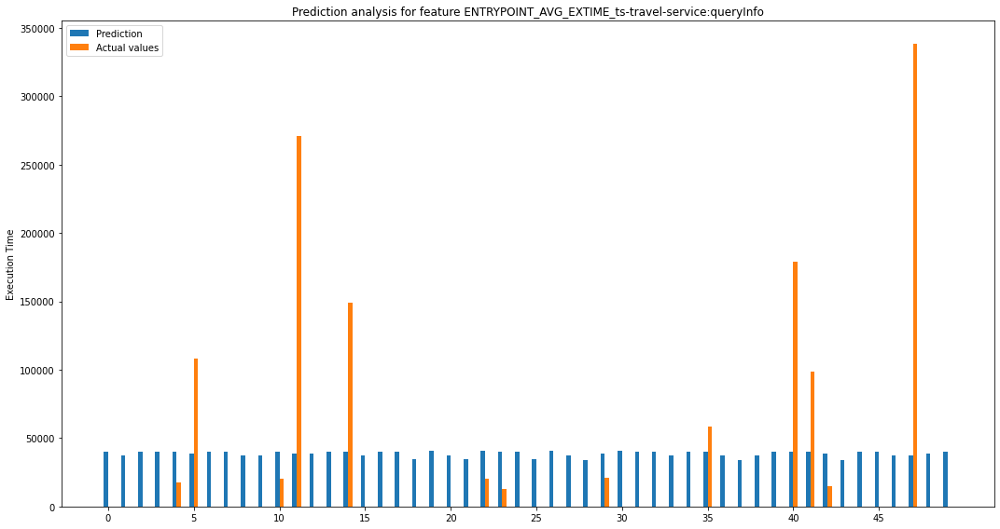

[array([40108.68578463]), array([37608.3407144]), array([40108.68578463]), array([39742.73479229]), array([22425.18578463]), array([69499.82930359]), array([40108.68578463]), array([40108.68578463]), array([37608.3407144]), array([37608.3407144]), array([19984.68578463]), array([232857.82930359]), array([38356.17069641]), array([40108.68578463]), array([108652.81421537]), array([37608.3407144]), array([40108.68578463]), array([40108.68578463]), array([34272.20427896]), array([40510.94770504]), array([37608.3407144]), array([34272.20427896]), array([20281.87516008]), array([27277.68578463]), array([40108.68578463]), array([34272.20427896]), array([40510.94770504]), array([37608.3407144]), array([33913.18186548]), array([17230.17069641]), array([40510.94770504]), array([40108.68578463]), array([40108.68578463]), array([37608.3407144]), array([40108.68578463]), array([18621.31421537]), array([37379.33958039]), array([34119.44672386]), array([37608.3407144]), array([40108.68578463]), array

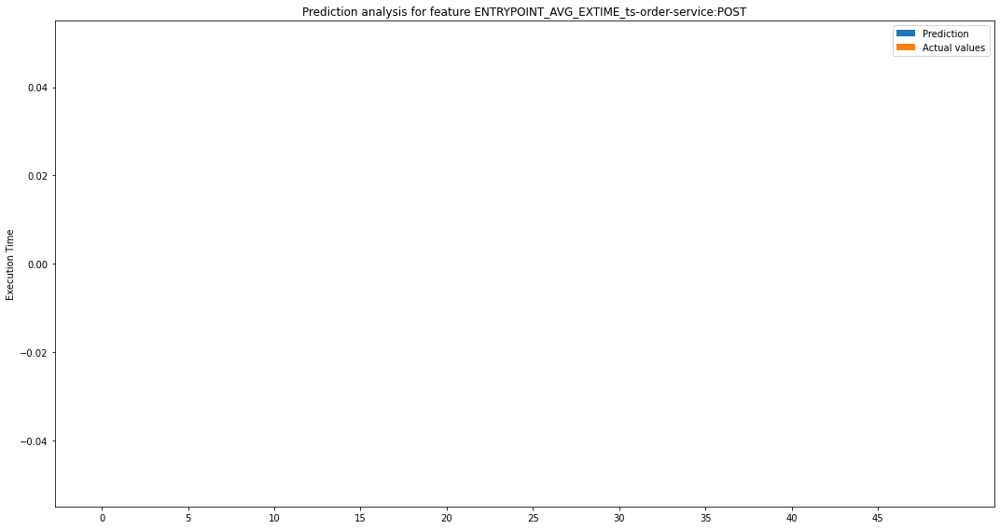

[array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]

/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100
/home/dimenna/AVV/git/obstack/notebooks/env/lib/python3.9/site-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  return abs((true-pred)/true) * 100
/home/dimenna/AVV/git/obstack/notebooks/env/lib/python3.9/site-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in sub

ERRORS [1963.1668031318382, 2308.111994513834, 1963.1668031318382, 1852.43106332441, 1963.1668031318382, 1855.219518451921, 1963.1668031318382, 1963.1668031318382, 2308.111994513834, 2349.888005486166, 1963.1668031318382, 1987.780481548079, 3365.219518451921, 1963.1668031318382, 1963.1668031318382, 2308.111994513834, 1963.1668031318382, 2667.833196868162, 2298.7454877301566, 1645.6169573514353, 2308.111994513834, 2534.2545122698434, 1819.216693116343, 3235.833196868162, 1963.1668031318382, 2534.2545122698434, 1645.6169573514353, 2308.111994513834, 1303.5739654431682, 1987.780481548079, 3661.3830426485647, 1963.1668031318382, 1963.1668031318382, 2308.111994513834, 1963.1668031318382, 1987.8331968681614, 699.5402971660615, 6181.57750490468, 2308.111994513834, 1963.1668031318382, 1963.1668031318382, 1852.43106332441, 1987.780481548079, 1432.5775049046797, 1963.1668031318382, 1963.1668031318382, 2308.111994513834, 2750.888005486166, 1987.780481548079, 1963.1668031318382, 3621.833196868162,

/home/dimenna/AVV/git/obstack/notebooks/env/lib/python3.9/site-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  return abs((true-pred)/true) * 100
/home/dimenna/AVV/git/obstack/notebooks/env/lib/python3.9/site-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  r

ERRORS [8.327483422007328, 0.0, 8.327483422007328, 3483.0222746091677, 8.327483422007328, 1485.744309536978, 8.327483422007328, 8.327483422007328, 0.0, 0.0, 8.327483422007328, 1944.744309536978, 1380.744309536978, 8.327483422007328, 8.327483422007328, 0.0, 8.327483422007328, 8.327483422007328, 3459.071958498611, 3660.4550688476543, 0.0, 541.0719584986109, 3555.588166043489, 8.327483422007328, 8.327483422007328, 5443.071958498611, 3660.4550688476543, 0.0, 19.141476701737485, 1009.7556904630219, 3660.4550688476543, 8.327483422007328, 8.327483422007328, 0.0, 8.327483422007328, 8.327483422007328, 703.024417274275, 117.83822632735081, 0.0, 8.327483422007328, 8.327483422007328, 2756.0222746091677, 3920.744309536978, 117.83822632735081, 8.327483422007328, 8.327483422007328, 0.0, 0.0, 3701.744309536978, 8.327483422007328, 8.327483422007328, 672.7443095369781, 8.327483422007328, 0.0, 8.327483422007328, 707.7443095369781, 0.0, 8.327483422007328, 541.7443095369781, 0.0, 8.327483422007328, 8.32748

/home/dimenna/AVV/git/obstack/notebooks/env/lib/python3.9/site-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  return abs((true-pred)/true) * 100
/home/dimenna/AVV/git/obstack/notebooks/env/lib/python3.9/site-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  retur

[1608706675.3698606, 1414387291.2907672, 1608706675.3698606, 1579484968.7705185, 502888957.47499245, 4830226273.2279005, 1608706675.3698606, 1608706675.3698606, 1414387291.2907672, 1414387291.2907672, 399387665.9102329, 54222768667.97903, 1471195830.492278, 1608706675.3698606, 11805434036.920576, 1414387291.2907672, 1608706675.3698606, 1608706675.3698606, 1174583986.1384776, 1641136883.9603815, 1414387291.2907672, 1174583986.1384776, 411354460.00896454, 744072141.7647879, 1608706675.3698606, 1174583986.1384776, 1641136883.9603815, 1414387291.2907672, 1150103904.2410777, 296878782.2274873, 1641136883.9603815, 1608706675.3698606, 1608706675.3698606, 1414387291.2907672, 1608706675.3698606, 346753343.10768944, 1397215027.465788, 1164136644.7423553, 1414387291.2907672, 1608706675.3698606, 19373804381.31033, 3439736309.4039774, 564474433.260536, 1164136644.7423553, 1608706675.3698606, 1608706675.3698606, 1414387291.2907672, 90402845355.23439, 1471195830.492278, 1608706675.3698606, 1608706675

/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100


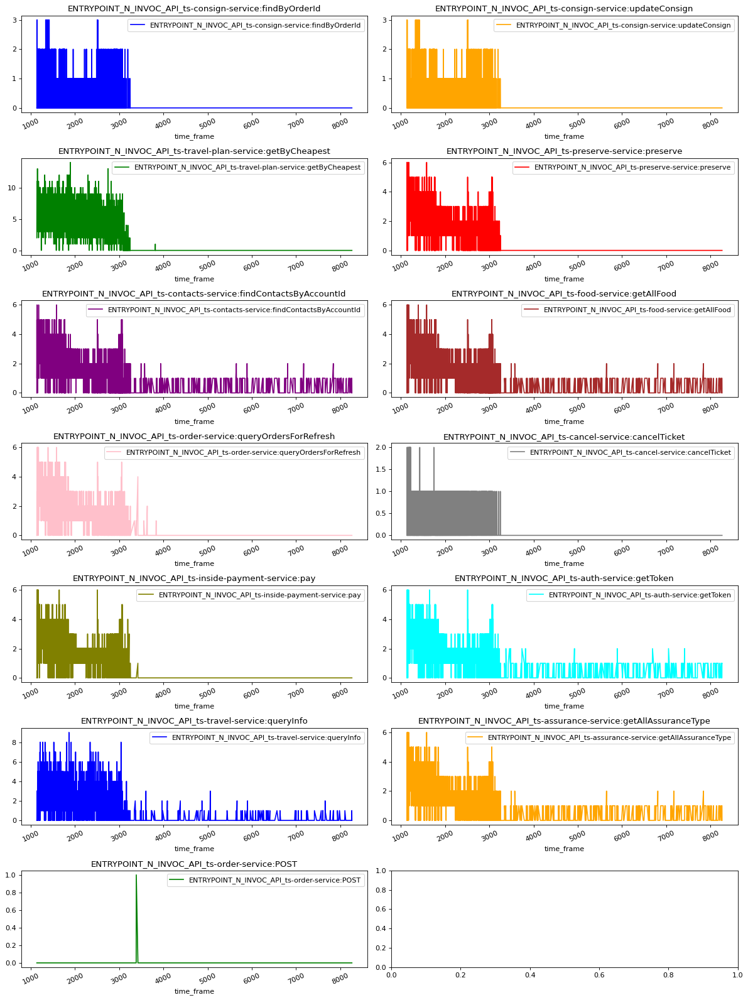

Data normalized
Input size 45 Output size 13
TOTAL MSE:  0.002177729401899528
TOTAL MAE:  0.013129173881718883
TOTAL MAPE:  405182152713.69
FIRST 50 predictions
ENTRY ENTRYPOINT_AVG_EXTIME_ts-consign-service:findByOrderId
PRED [0.0, 23.580067113044525, 9.773308993923726, 3570.5014703185557, 0.0, 9.773308993923726, 3544.4648917853206, 3594.8604854700707, 0.0, 9.773308993923726, 22.032504657717787, 3594.8604854700707, 28.236666666666665, 9.773308993923726, 21.645852971564928, 9.773308993923726, 3620.2716306378115, 9.773308993923726, 21.645852971564928, 9.773308993923726, 3726.9995991537685, 3431.4750841933314, 9.773308993923726, 23.580067113044525, 3600.708596581181, 0.0, 9.773308993923726, 23.580067113044525, 9.088358234267153, 9.773308993923726, 3406.851207013798, 9.773308993923726, 9.773308993923726, 3448.539100859998, 3614.345400009554, 21.645852971564928, 9.773308993923726, 2965.6337230187123, 9.773308993923726, 0.0, 35.452611090685735, 0.0, 0.0, 10.461769385968436, 3501.25440014162

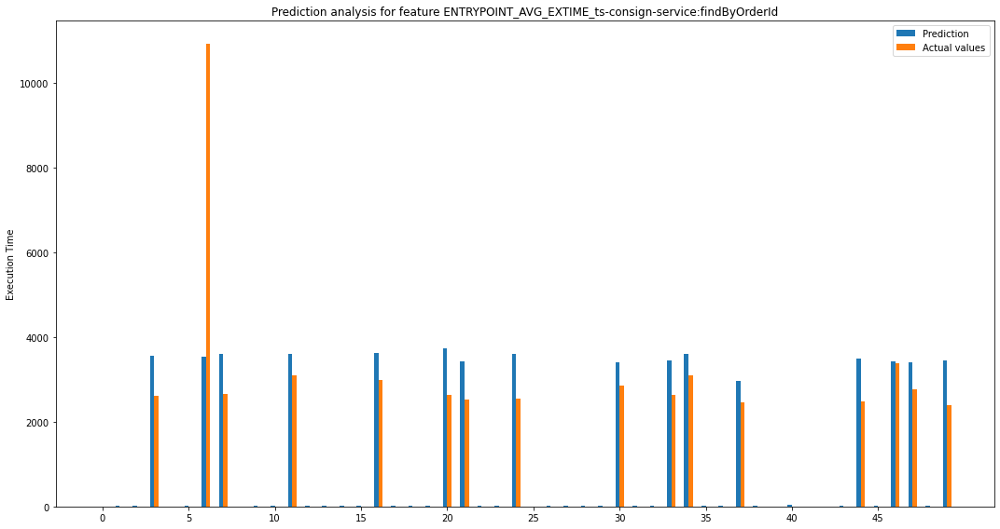

/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100


[array([0.]), array([23.58006711]), array([9.77330899]), array([964.50147032]), array([0.]), array([9.77330899]), array([7384.53510821]), array([932.36048547]), array([0.]), array([9.77330899]), array([22.03250466]), array([486.86048547]), array([28.23666667]), array([9.77330899]), array([21.64585297]), array([9.77330899]), array([625.27163064]), array([9.77330899]), array([21.64585297]), array([9.77330899]), array([1088.99959915]), array([911.47508419]), array([9.77330899]), array([23.58006711]), array([1058.20859658]), array([0.]), array([9.77330899]), array([23.58006711]), array([9.08835823]), array([9.77330899]), array([540.85120701]), array([9.77330899]), array([9.77330899]), array([811.53910086]), array([525.34540001]), array([21.64585297]), array([9.77330899]), array([506.63372302]), array([9.77330899]), array([0.]), array([35.45261109]), array([0.]), array([0.]), array([10.46176939]), array([1012.25440014]), array([9.77330899]), array([53.47508419]), array([627.85120701]), arra

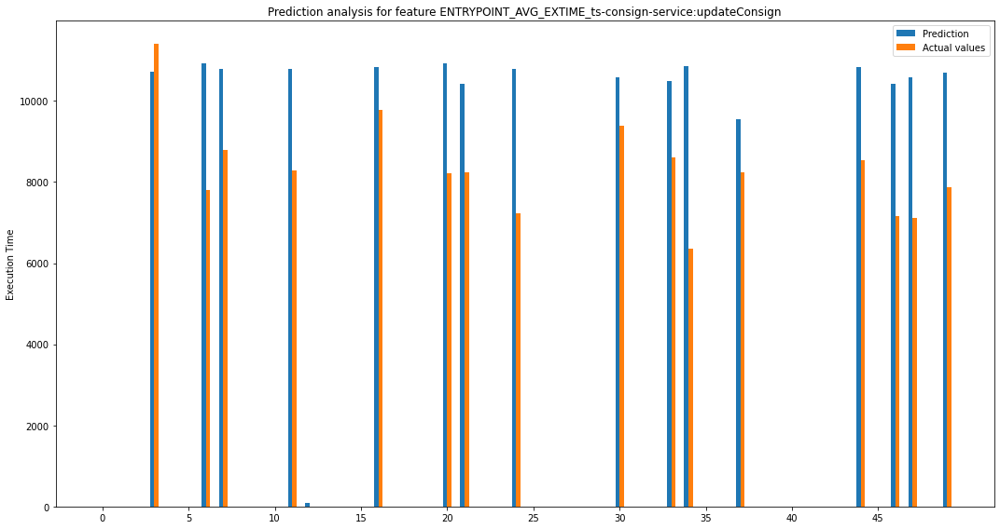

[array([0.]), array([0.]), array([0.]), array([674.73630966]), array([0.]), array([0.]), array([3137.61939364]), array([1992.80073579]), array([0.]), array([0.]), array([0.]), array([2508.80073579]), array([77.20222222]), array([0.]), array([0.]), array([0.]), array([1058.64117915]), array([0.]), array([0.]), array([0.]), array([2694.8589091]), array([2177.78596366]), array([0.]), array([0.]), array([3551.98679135]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([1192.62007839]), array([0.]), array([0.]), array([1888.625547]), array([4507.16753473]), array([0.]), array([0.]), array([1297.45858496]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([2288.98234587]), array([0.]), array([3254.78596366]), array([3487.62007839]), array([0.]), array([2824.6171486])] [array([0.]), array([0.]), array([0.]), array([455269.08757338]), array([0.]), array([0.]), array([9844655.45932701]), array([3971254.77258391]), array([0.]), array([0.]

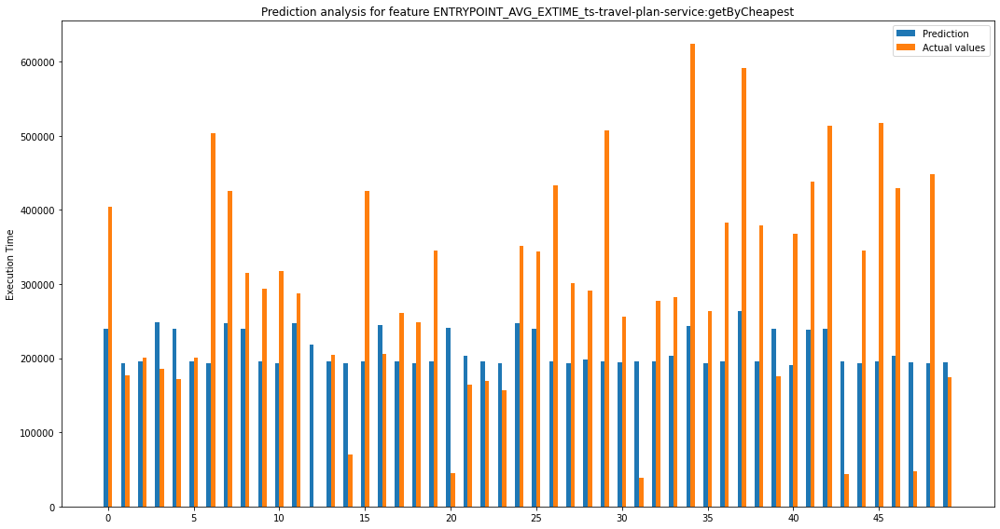

[array([164950.83059839]), array([16128.00915017]), array([4902.95497356]), array([63138.22204058]), array([67821.76940161]), array([5424.70497356]), array([310860.27543216]), array([177780.17453662]), array([76462.83059839]), array([98165.30497356]), array([124408.78498235]), array([40488.28167948]), array([217898.13569975]), array([8371.32997356]), array([123660.39411061]), array([229558.70497356]), array([39522.46895864]), array([65544.70497356]), array([54697.26303224]), array([148896.45497356]), array([195401.3949012]), array([38948.15968502]), array([26877.49502644]), array([35880.00915017]), array([104879.93624985]), array([105267.25916982]), array([236992.20497356]), array([108531.9075165]), array([93093.8133686]), array([311878.95497356]), array([61292.51270984]), array([156820.29502644]), array([81261.70497356]), array([79651.62602403]), array([380023.90394076]), array([70596.46303224]), array([187002.37164023]), array([328326.37196309]), array([183599.37164023]), array([6331

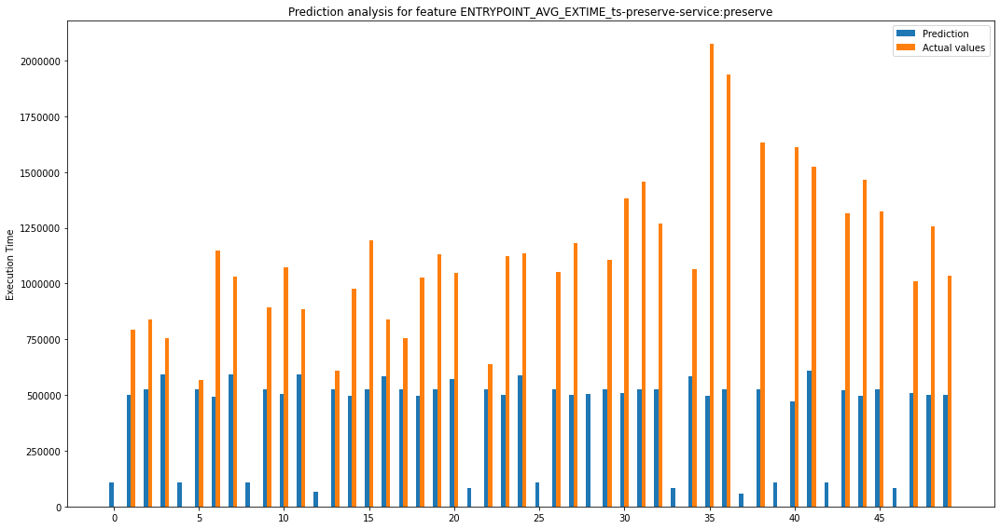

[array([109498.63213017]), array([291520.86024787]), array([313754.47354184]), array([160544.95724526]), array([109498.63213017]), array([39559.47354184]), array([657948.74528063]), array([439427.43729576]), array([109498.63213017]), array([367458.47354184]), array([566712.04088593]), array([292794.93729576]), array([66507.24802369]), array([84009.47354184]), array([479397.15017216]), array([669262.47354184]), array([253548.56064231]), array([228892.47354184]), array([530504.15017216]), array([603109.47354184]), array([475330.61103079]), array([84340.07506499]), array([109940.47354184]), array([621140.19358121]), array([549384.89696243]), array([109498.63213017]), array([523364.47354184]), array([678968.52691454]), array([504059.00458479]), array([577406.47354184]), array([876024.0232793]), array([929023.97354184]), array([743966.47354184]), array([83492.26676499]), array([483778.66567346]), array([1576997.15017216]), array([1411053.97354184]), array([56137.68685897]), array([1107670.4

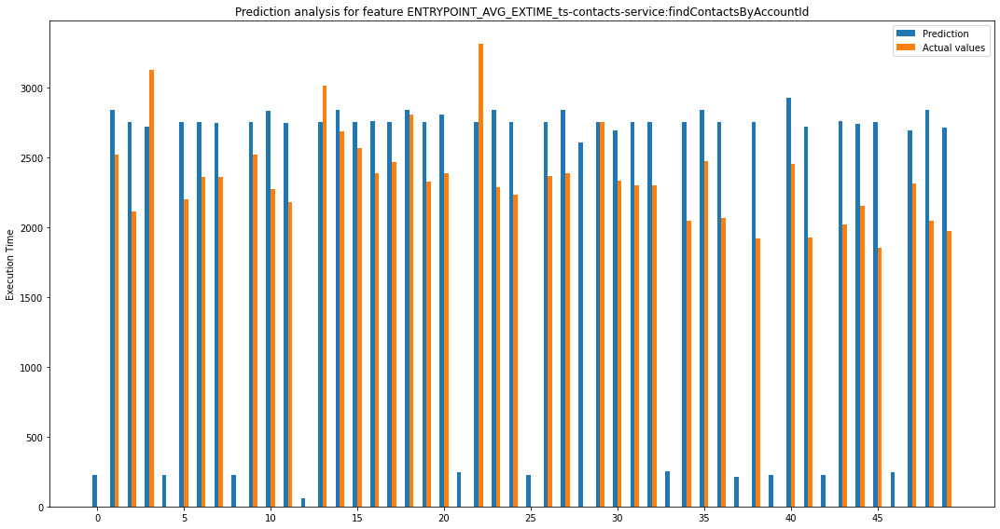

[array([227.37471463]), array([321.46558713]), array([639.03908164]), array([406.09868849]), array([227.37471463]), array([552.03908164]), array([392.94506337]), array([387.74580646]), array([227.37471463]), array([234.03908164]), array([556.69619198]), array([571.74580646]), array([60.14576196]), array([260.96091836]), array([152.82047846]), array([185.03908164]), array([372.50716106]), array([286.03908164]), array([28.82047846]), array([428.53908164]), array([419.59204499]), array([248.69820935]), array([558.96091836]), array([551.46558713]), array([522.98713979]), array([227.37471463]), array([385.03908164]), array([452.46558713]), array([2608.6137595]), array([1.53908164]), array([361.30933156]), array([454.53908164]), array([452.03908164]), array([254.17160935]), array([708.80170516]), array([365.82047846]), array([689.53908164]), array([208.73033333]), array([836.03908164]), array([227.37471463]), array([474.24698396]), array([792.82034483]), array([227.37471463]), array([745.074

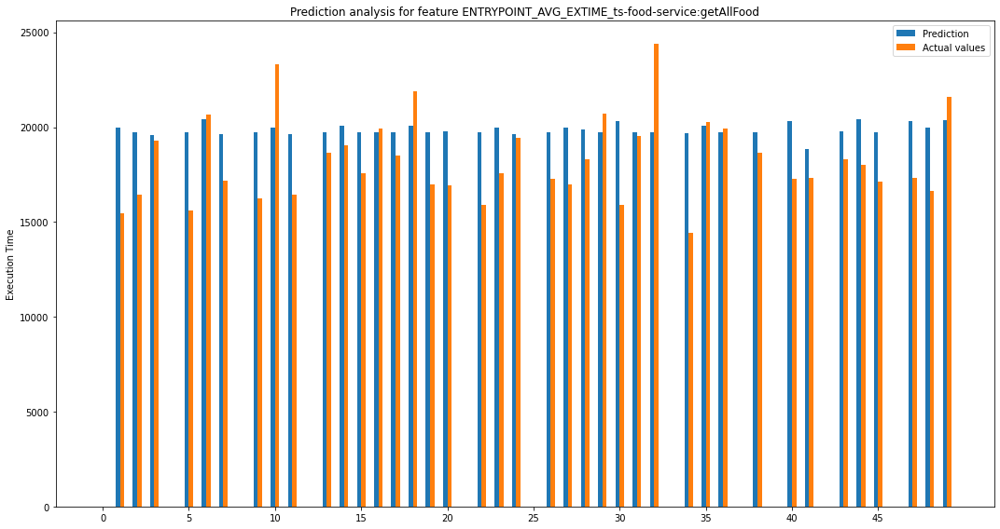

[array([0.]), array([4537.37282001]), array([3296.77891646]), array([318.45049082]), array([0.]), array([4118.77891646]), array([200.15400879]), array([2430.77246052]), array([0.]), array([3475.77891646]), array([3356.18151126]), array([3165.77246052]), array([0.]), array([1106.77891646]), array([1023.86696732]), array([2197.77891646]), array([200.9445768]), array([1219.77891646]), array([1844.13303268]), array([2764.77891646]), array([2857.78761524]), array([0.]), array([3850.77891646]), array([2393.70615334]), array([206.28340496]), array([0.]), array([2474.77891646]), array([3006.03948668]), array([1615.27053712]), array([964.22108354]), array([4435.40032715]), array([194.27891646]), array([4640.22108354]), array([0.]), array([5251.31956085]), array([178.63303268]), array([194.72108354]), array([0.]), array([1079.77891646]), array([0.]), array([3052.12753754]), array([1560.04047163]), array([0.]), array([1487.50883805]), array([2414.37899767]), array([2629.77891646]), array([0.]), a

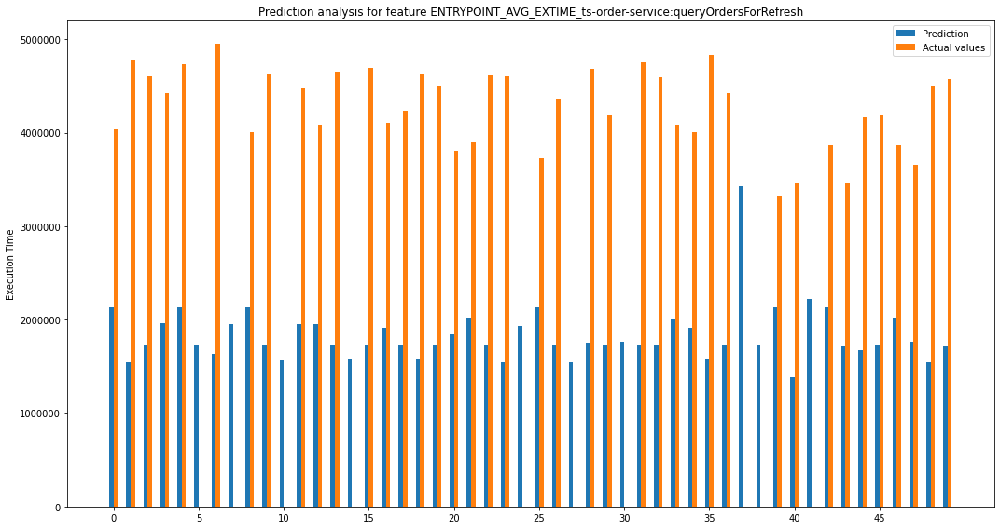

[array([1919040.36834189]), array([3235190.4255336]), array([2868131.58957546]), array([2458546.63501034]), array([2607580.86834189]), array([1734035.91042454]), array([3316714.27928601]), array([1949408.60779521]), array([1871482.86834189]), array([2899475.08957546]), array([1565767.52927604]), array([2526127.39220479]), array([2130476.55630528]), array([2915153.58957546]), array([1576034.59822071]), array([2959786.08957546]), array([2195536.38519183]), array([2499466.08957546]), array([3060320.40177929]), array([2774514.08957546]), array([1958019.4519727]), array([1889931.03356246]), array([2882708.08957546]), array([3053650.4255336]), array([1929601.49046188]), array([1595840.86834189]), array([2625599.58957546]), array([1545401.57446639]), array([2936223.82074371]), array([2455539.75624212]), array([1759448.67812213]), array([3022665.08957546]), array([2863780.08957546]), array([2080292.77008913]), array([2094417.88122574]), array([3255282.40177929]), array([2687181.08957546]), arr

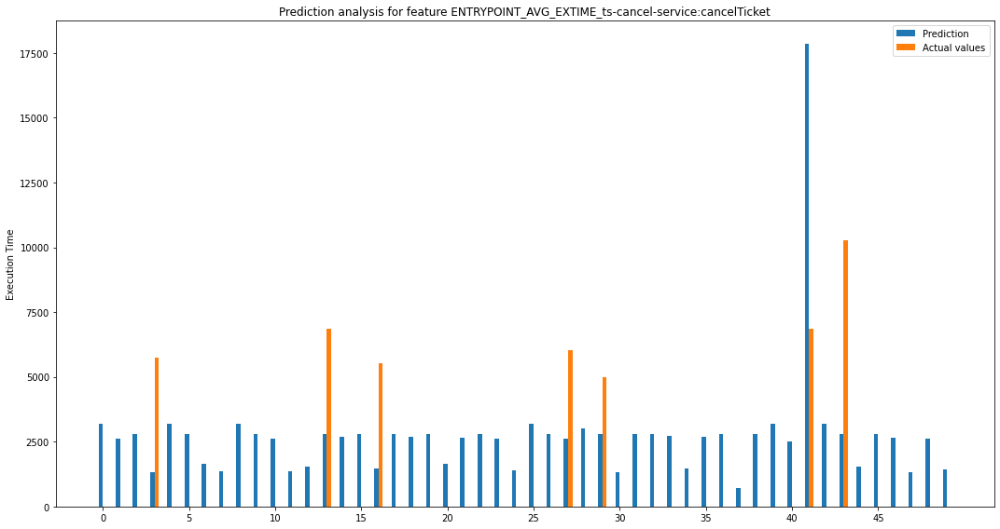

[array([3181.27819266]), array([2607.64087958]), array([2809.45929994]), array([4419.56846975]), array([3181.27819266]), array([2809.45929994]), array([1650.71177477]), array([1340.65637873]), array([3181.27819266]), array([2809.45929994]), array([2630.49819504]), array([1340.65637873]), array([1533.33676478]), array([4036.54070006]), array([2705.07575227]), array([2809.45929994]), array([4043.68861512]), array([2809.45929994]), array([2705.07575227]), array([2809.45929994]), array([1660.78512765]), array([2642.32761012]), array([2809.45929994]), array([2607.64087958]), array([1376.70837873]), array([3181.27819266]), array([2809.45929994]), array([3436.35912042]), array([2999.92270217]), array([2163.54070006]), array([1323.75865098]), array([2809.45929994]), array([2809.45929994]), array([2725.23541012]), array([1479.68313234]), array([2705.07575227]), array([2809.45929994]), array([715.63908608]), array([2809.45929994]), array([3181.27819266]), array([2503.25733191]), array([11001.480

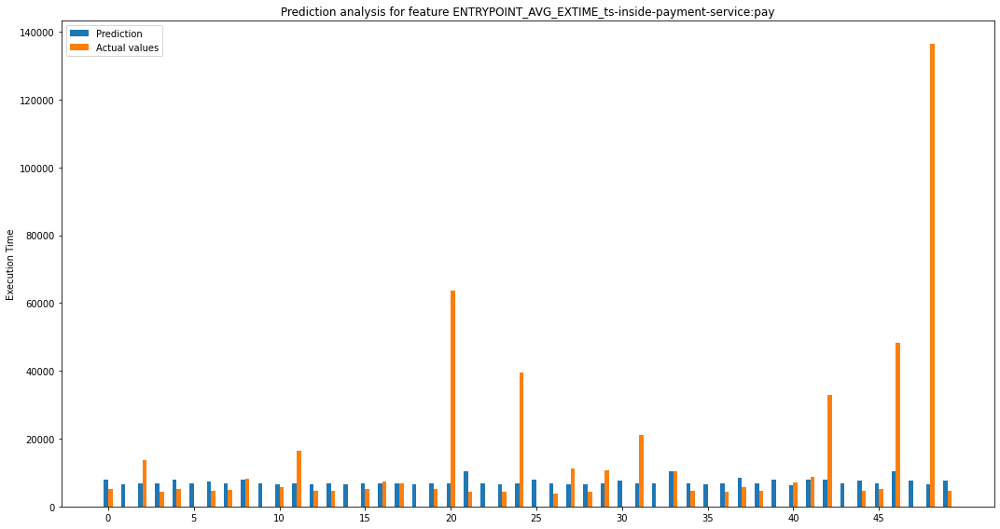

[array([2747.49864591]), array([6571.94685491]), array([6886.09615399]), array([2450.36857578]), array([2858.99864591]), array([6783.90384601]), array([2973.38378341]), array([1993.86209093]), array([356.00135409]), array([6783.90384601]), array([908.97474321]), array([9585.13790907]), array([1748.32484599]), array([2072.90384601]), array([6509.66285491]), array([1614.90384601]), array([464.21502559]), array([100.09615399]), array([6509.66285491]), array([1614.90384601]), array([56689.48411582]), array([6167.34085163]), array([6783.90384601]), array([2288.94685491]), array([32675.68279796]), array([7905.49864591]), array([2953.90384601]), array([4720.05314509]), array([2289.41153686]), array([3834.09615399]), array([7606.46727332]), array([14328.09615399]), array([6783.90384601]), array([142.96004829]), array([2344.99794429]), array([6509.66285491]), array([2343.90384601]), array([2895.29883721]), array([2275.90384601]), array([7905.49864591]), array([674.29413619]), array([798.6632141

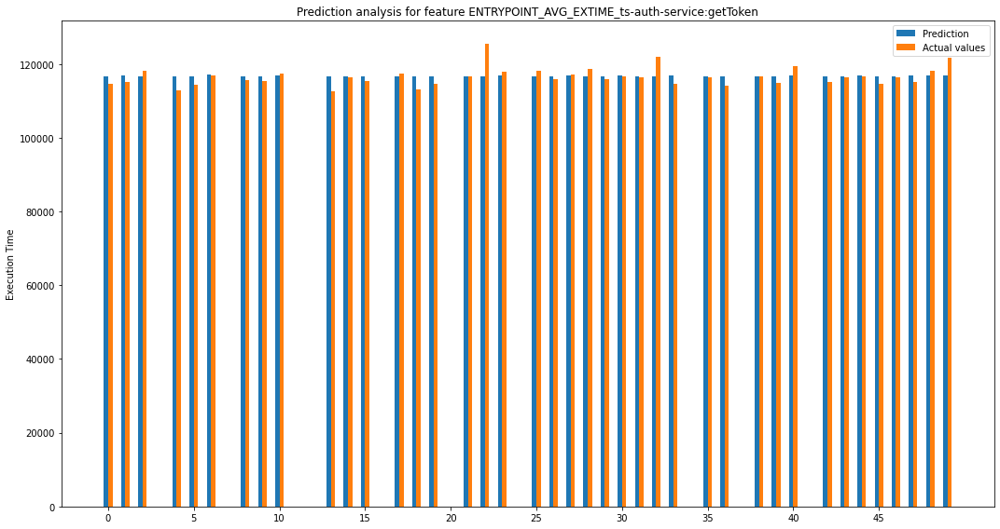

[array([2056.03989265]), array([1760.82158791]), array([1666.89604607]), array([0.]), array([3929.03989265]), array([2123.60395393]), array([155.23654179]), array([0.]), array([1056.03989265]), array([1186.60395393]), array([639.50185887]), array([0.]), array([0.]), array([3840.10395393]), array([423.89590711]), array([1091.10395393]), array([0.]), array([797.89604607]), array([3560.22924045]), array([1976.10395393]), array([0.]), array([239.02628968]), array([8868.39604607]), array([1047.17841209]), array([0.]), array([1317.96010735]), array([606.10395393]), array([408.17841209]), array([2084.37349811]), array([585.10395393]), array([291.93847819]), array([271.10395393]), array([5491.89604607]), array([2276.92767302]), array([0.]), array([296.22924045]), array([2338.10395393]), array([0.]), array([120.89604607]), array([1793.03989265]), array([2454.38645891]), array([0.]), array([1714.03989265]), array([137.36039744]), array([331.1135245]), array([2009.10395393]), array([377.02628968]

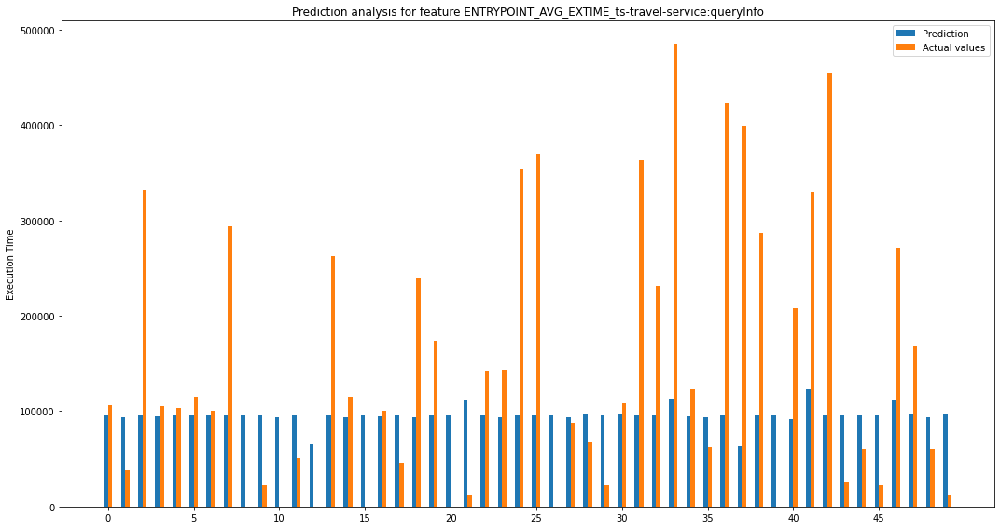

[array([10606.67979552]), array([56038.19569813]), array([236735.18891676]), array([11073.48086074]), array([7588.67979552]), array([19570.18891676]), array([5015.26347615]), array([199085.94116377]), array([95652.32020448]), array([73244.81108324]), array([94066.97338046]), array([44638.80883623]), array([64961.02597336]), array([167345.18891676]), array([21521.96106048]), array([95447.81108324]), array([5145.22134184]), array([49607.81108324]), array([146781.46106048]), array([78155.18891676]), array([95845.36786191]), array([99112.47832714]), array([46618.18891676]), array([49214.55430187]), array([259293.37156192]), array([274135.67979552]), array([95447.81108324]), array([6049.44569813]), array([29676.26074136]), array([73598.81108324]), array([11689.72904497]), array([268151.18891676]), array([135454.18891676]), array([372540.35540286]), array([28062.93276871]), array([30929.20560619]), array([327416.68891676]), array([335858.70063431]), array([192097.5222501]), array([95652.3202

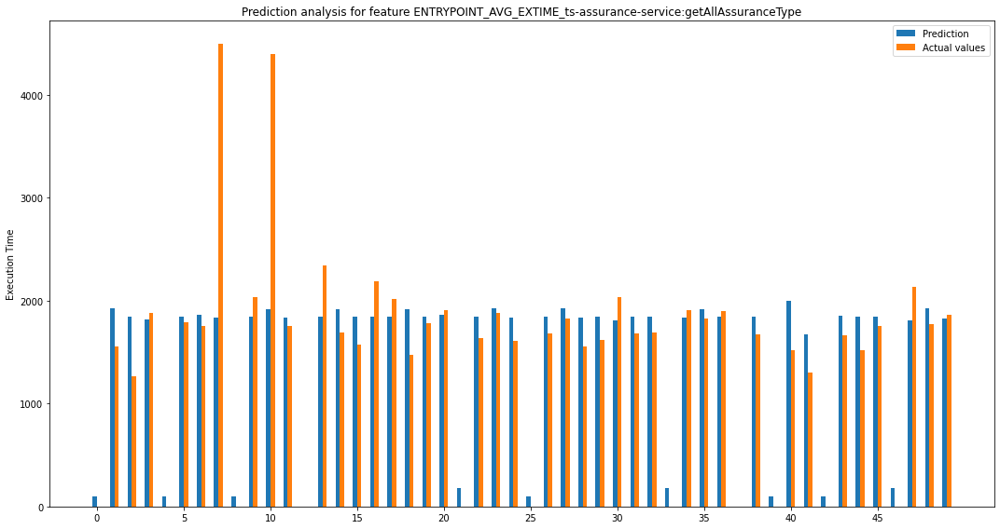

[array([96.31986518]), array([371.43521896]), array([579.77606003]), array([64.24733987]), array([96.31986518]), array([57.77606003]), array([101.79691274]), array([2661.85673381]), array([96.31986518]), array([191.22393997]), array([2481.60026317]), array([82.14326619]), array([0.]), array([497.22393997]), array([224.52125764]), array([273.77606003]), array([343.38623473]), array([171.22393997]), array([445.52125764]), array([65.77606003]), array([40.76634542]), array([181.25666844]), array([209.77606003]), array([41.43521896]), array([229.66432175]), array([96.31986518]), array([161.77606003]), array([100.76855229]), array([285.11792095]), array([227.77606003]), array([224.52886407]), array([168.27606003]), array([158.77606003]), array([178.76826844]), array([67.90456394]), array([95.02125764]), array([55.72393997]), array([0.]), array([176.77606003]), array([96.31986518]), array([479.18041656]), array([372.57497811]), array([96.31986518]), array([196.55608714]), array([326.24604397]

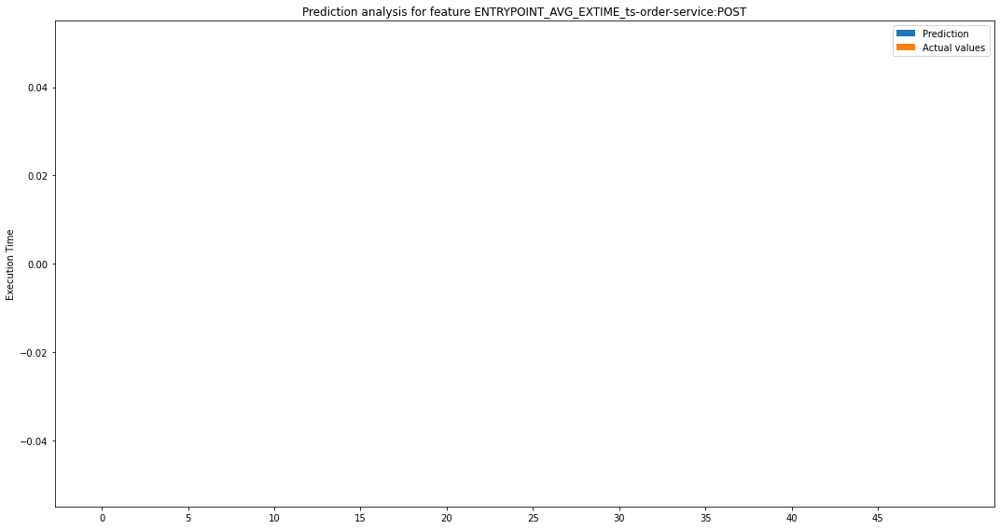

[array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]

/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  return abs((true-pred)/true) * 100
/home/dimenna/AVV/git/obstack/notebooks/env/lib/python3.9/site-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883

0.25 Quartile (MAE: 0.000000, MSE: 0.000000, MAPE: 100.000000)
0.50 Quartile (MAE: 0.000000, MSE: 0.000000, MAPE: 100.000000)
0.75 Quartile (MAE: 0.000000, MSE: 0.000000, MAPE: 100.000000)
Loading datasource from avv_dataset_DT_1000.csv
Datasource loaded: len = 1497
Entrypoints size: 13
Entrypoint list
[   'ENTRYPOINT_N_INVOC_API_ts-consign-service:findByOrderId',
    'ENTRYPOINT_N_INVOC_API_ts-consign-service:updateConsign',
    'ENTRYPOINT_N_INVOC_API_ts-travel-plan-service:getByCheapest',
    'ENTRYPOINT_N_INVOC_API_ts-preserve-service:preserve',
    'ENTRYPOINT_N_INVOC_API_ts-contacts-service:findContactsByAccountId',
    'ENTRYPOINT_N_INVOC_API_ts-food-service:getAllFood',
    'ENTRYPOINT_N_INVOC_API_ts-order-service:queryOrdersForRefresh',
    'ENTRYPOINT_N_INVOC_API_ts-cancel-service:cancelTicket',
    'ENTRYPOINT_N_INVOC_API_ts-inside-payment-service:pay',
    'ENTRYPOINT_N_INVOC_API_ts-travel-service:queryInfo',
    'ENTRYPOINT_N_INVOC_API_ts-assurance-service:getAllAssuranceT

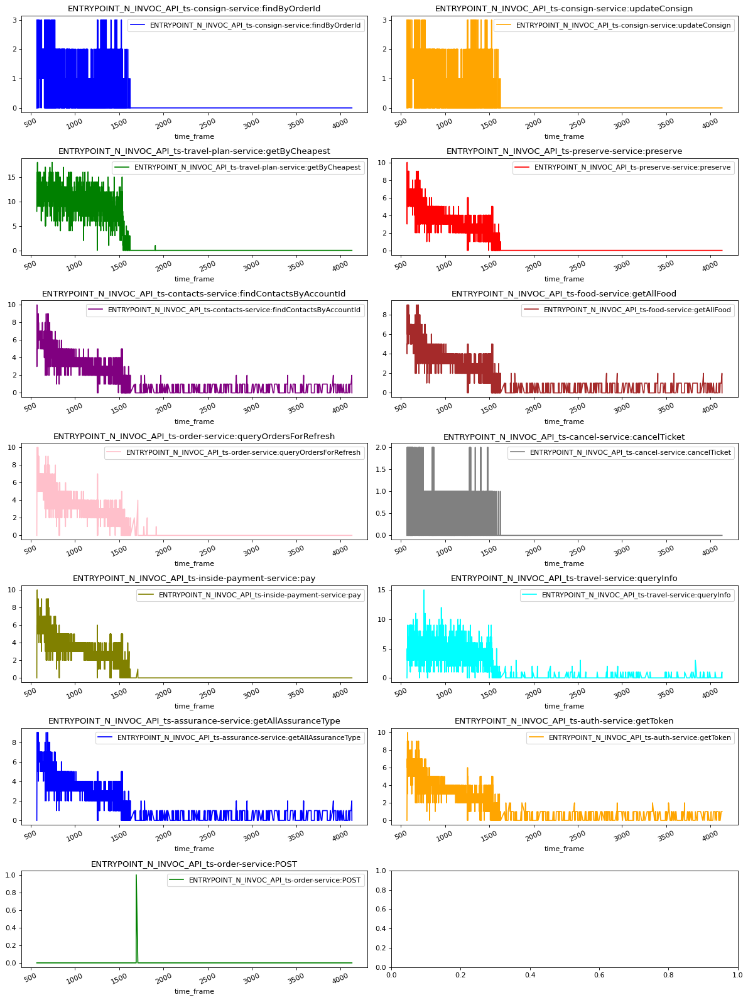

Data normalized
Input size 45 Output size 13
TOTAL MSE:  0.005779069479795955
TOTAL MAE:  0.028805417662216833
TOTAL MAPE:  699860081955.0
FIRST 50 predictions
ENTRY ENTRYPOINT_AVG_EXTIME_ts-consign-service:findByOrderId
PRED [0.0, 0.0, 2920.5384085497826, 4.238142035024006, 0.0, 0.0, 0.0, 3.0271047178919885, 0.0, 0.0, 3269.069362013252, 3.427662729428432, 0.0, 3.6123132222628045, 1.8066873330691833, 0.0, 3.2981523831019657, 0.0, 0.0, 0.0, 0.7679829106044792, 0.0, 0.0, 0.0, 0.0, 2938.261918530543, 2988.9845971610002, 0.0, 0.0, 0.0, 3121.2528667628662, 0.7679829106044792, 0.0, 0.0, 0.0, 5.420424439140085, 0.0, 0.0, 2920.5384085497826, 0.45397565397565404, 0.0, 3.9225239553983386, 0.0, 0.0, 3134.987232503607, 0.0, 3.9234075122085015, 2.5331487202093697, 0.0, 0.6019817375063503]
VALS [0.0, 0.0, 2135.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2964.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3367.5, 3974.0, 0.0, 0.0, 0.0, 2443.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 27

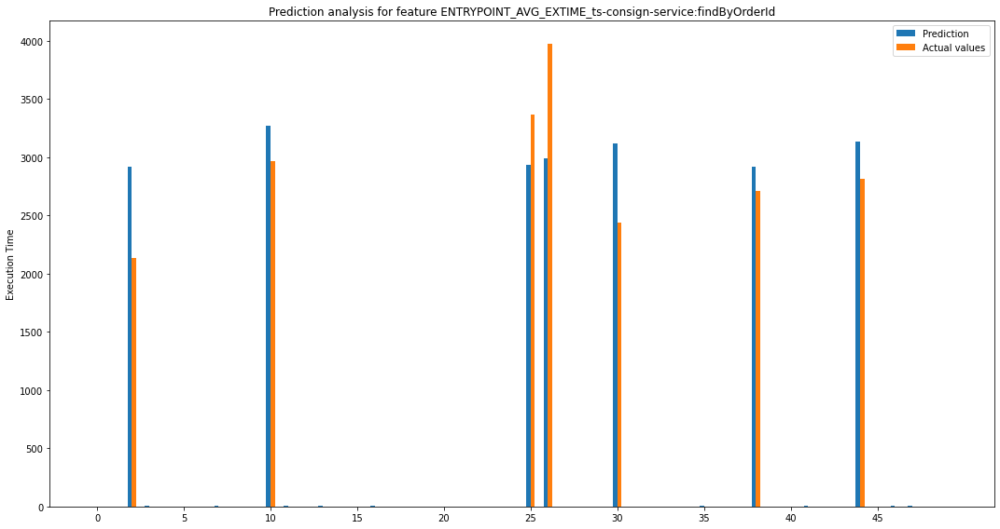

/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100


[array([0.]), array([0.]), array([785.53840855]), array([4.23814204]), array([0.]), array([0.]), array([0.]), array([3.02710472]), array([0.]), array([0.]), array([304.56936201]), array([3.42766273]), array([0.]), array([3.61231322]), array([1.80668733]), array([0.]), array([3.29815238]), array([0.]), array([0.]), array([0.]), array([0.76798291]), array([0.]), array([0.]), array([0.]), array([0.]), array([429.23808147]), array([985.01540284]), array([0.]), array([0.]), array([0.]), array([678.25286676]), array([0.76798291]), array([0.]), array([0.]), array([0.]), array([5.42042444]), array([0.]), array([0.]), array([208.53840855]), array([0.45397565]), array([0.]), array([3.92252396]), array([0.]), array([0.]), array([318.9872325]), array([0.]), array([3.92340751]), array([2.53314872]), array([0.]), array([0.60198174])] [array([0.]), array([0.]), array([617070.59130693]), array([17.96184791]), array([0.]), array([0.]), array([0.]), array([9.16336297]), array([0.]), array([0.]), array([

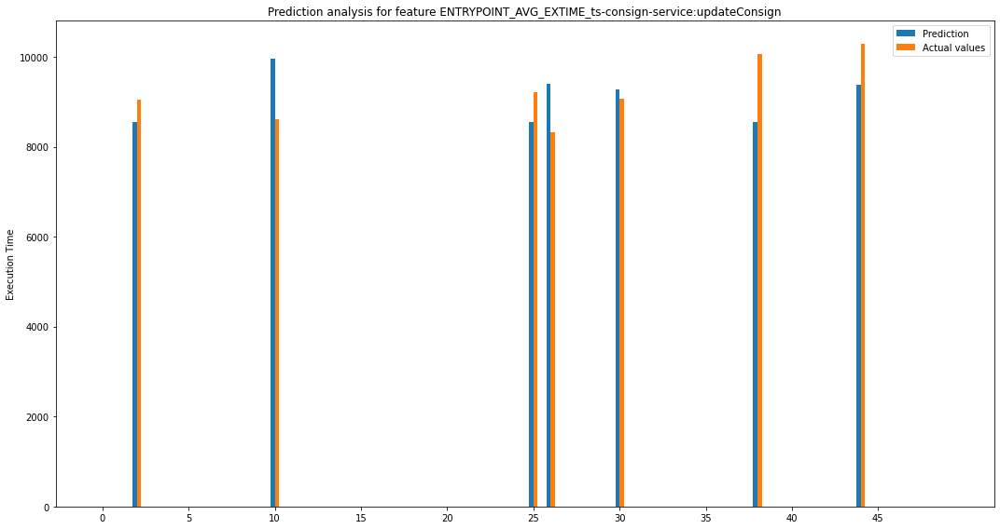

[array([0.]), array([0.]), array([504.31486201]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([1346.88094169]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([681.77033135]), array([1087.78262702]), array([0.]), array([0.]), array([0.]), array([197.1202092]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([1517.31486201]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([896.86961951]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([0.]), array([0.]), array([254333.48004719]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([1814088.27108858]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), ar

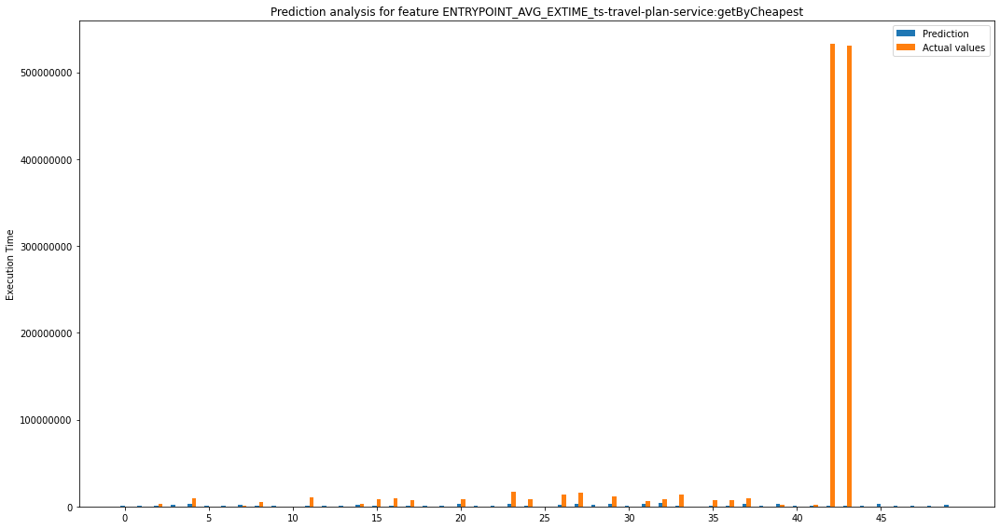

[array([1296477.81455128]), array([1226548.83985609]), array([2390026.18667035]), array([1811156.14455711]), array([5602388.26409147]), array([1292746.76553877]), array([994706.22852224]), array([414271.84985153]), array([4314242.45681727]), array([894397.45521668]), array([207430.80676074]), array([9385702.94947909]), array([599035.36311501]), array([622780.01746001]), array([1886768.36549032]), array([7378853.99153861]), array([8819754.81870072]), array([5861303.84678266]), array([632214.74553661]), array([765719.94593809]), array([5863596.30490002]), array([1044533.78220789]), array([1079029.04867125]), array([13650006.16793402]), array([7045344.96779211]), array([314049.6291098]), array([11319651.79755045]), array([12812363.88890455]), array([1399518.70991438]), array([8612621.14482978]), array([992162.12547935]), array([3088163.11323335]), array([5043655.81828134]), array([12550123.06262774]), array([178089.75410244]), array([7270636.21734221]), array([6246848.38265705]), array([6

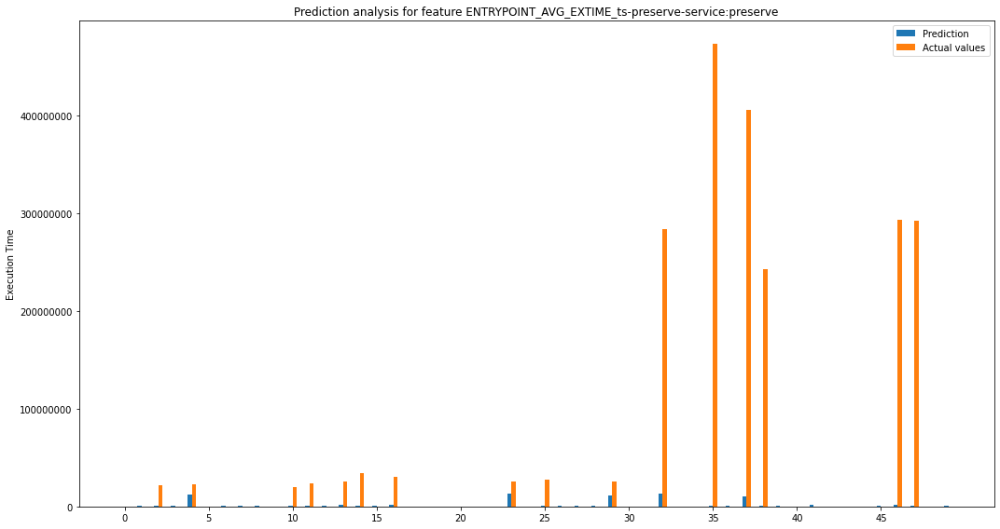

[array([281461.33333333]), array([335869.13047619]), array([20528621.78138492]), array([618213.01829268]), array([10128814.66769523]), array([240781.25214286]), array([325248.64333333]), array([927697.89328771]), array([837638.27955357]), array([281461.33333333]), array([19016346.90829639]), array([22936433.85206936]), array([352303.15685714]), array([24278939.89223246]), array([33125421.79229615]), array([406710.954]), array([28762742.75696749]), array([54407.79714286]), array([0.]), array([54407.79714286]), array([146755.89252837]), array([0.]), array([54407.79714286]), array([12166339.54846795]), array([0.]), array([26793844.06782936]), array([460307.91621945]), array([384091.68618656]), array([764798.19214286]), array([14063498.23855147]), array([0.]), array([146755.89252837]), array([2.70352257e+08]), array([54407.79714286]), array([0.]), array([4.72316202e+08]), array([554094.07547619]), array([3.95443487e+08]), array([2.41937705e+08]), array([487129.88931824]), array([54407.7971

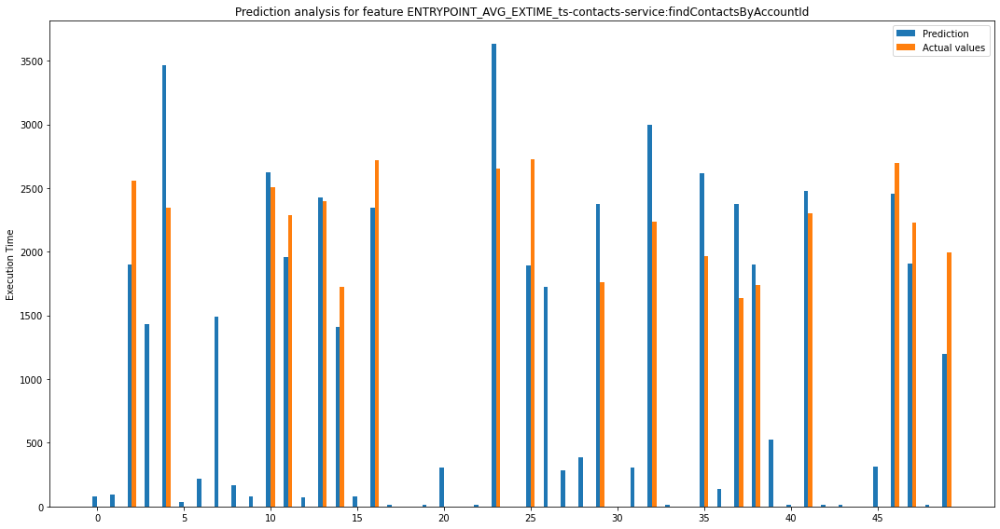

[array([82.26792949]), array([92.52316758]), array([657.19303968]), array([1432.24615684]), array([1117.22675176]), array([33.3402381]), array([219.22852949]), array([1488.21169205]), array([168.82270833]), array([82.26792949]), array([119.01078301]), array([328.37393612]), array([68.44309524]), array([32.56020668]), array([320.23682527]), array([78.69833333]), array([373.01898392]), array([10.2552381]), array([0.]), array([10.2552381]), array([304.37409408]), array([0.]), array([10.2552381]), array([976.07906472]), array([0.]), array([828.31459524]), array([1721.83530793]), array([286.7482581]), array([386.55576758]), array([615.72333905]), array([0.]), array([304.37409408]), array([759.48124567]), array([10.2552381]), array([0.]), array([650.03177301]), array([139.31483425]), array([738.85554434]), array([162.80696032]), array([522.55898041]), array([10.2552381]), array([178.01875137]), array([10.2552381]), array([10.2552381]), array([0.]), array([313.8011711]), array([242.94826832])

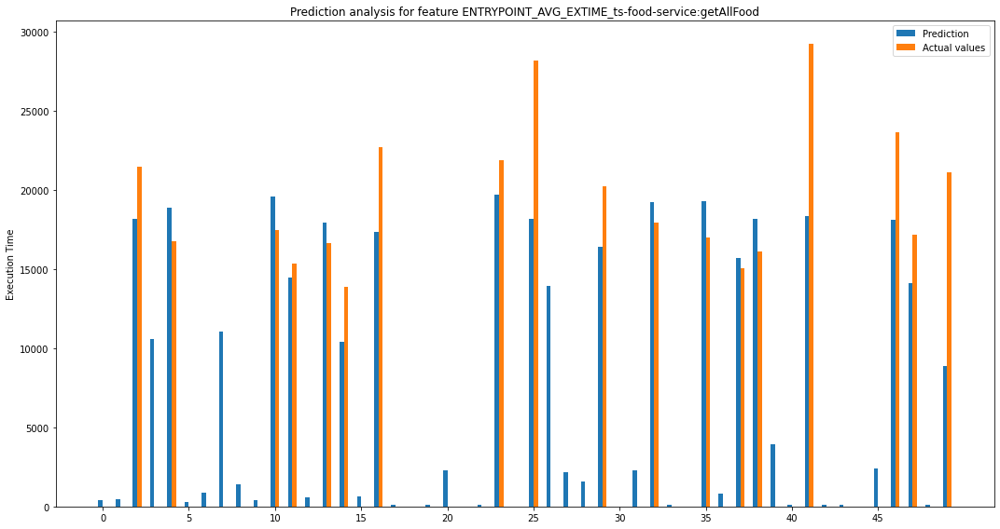

[array([394.95688462]), array([476.7925989]), array([3255.67830159]), array([10593.05553899]), array([2124.45006679]), array([262.79946429]), array([883.78908462]), array([11023.67131026]), array([1417.13071429]), array([394.95688462]), array([2158.83746902]), array([888.54725104]), array([566.01109524]), array([1292.14069738]), array([3450.72095763]), array([647.84680952]), array([5318.50327015]), array([81.83571429]), array([0.]), array([81.83571429]), array([2310.29933233]), array([0.]), array([81.83571429]), array([2146.16836452]), array([0.]), array([9989.3894127]), array([13954.8552347]), array([2179.87909873]), array([1592.3975489]), array([3792.24609488]), array([0.]), array([2310.29933233]), array([1276.43768191]), array([81.83571429]), array([0.]), array([2303.54575876]), array([839.4063489]), array([678.23537457]), array([2098.32169841]), array([3914.19901655]), array([81.83571429]), array([10885.71028786]), array([81.83571429]), array([81.83571429]), array([0.]), array([237

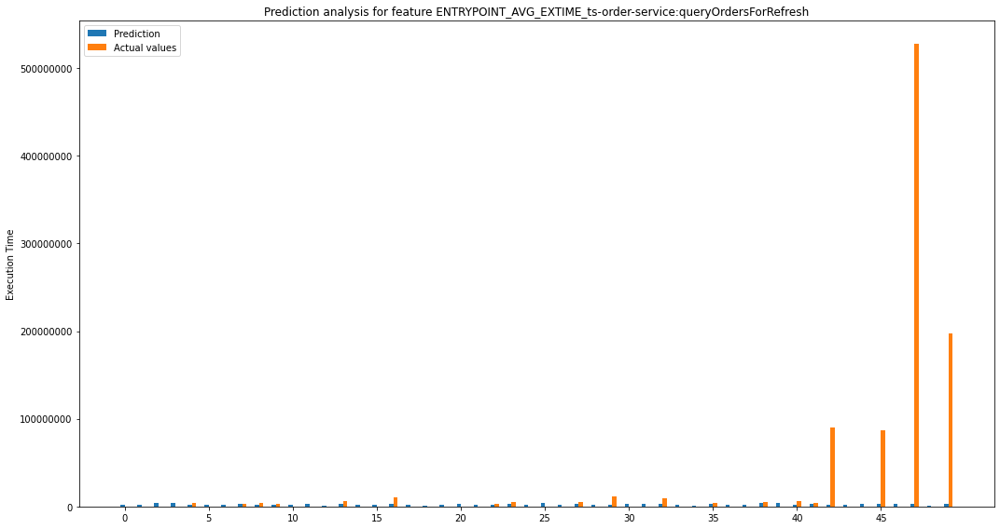

[array([1680894.19052302]), array([1535029.74621228]), array([3873517.23422087]), array([3521935.44247789]), array([1931258.19134785]), array([1704084.56256098]), array([1567198.11624488]), array([32053.23269168]), array([2330673.64643017]), array([1574727.09475512]), array([2327208.89582622]), array([2775511.96822602]), array([908529.81635484]), array([3719893.89990164]), array([1971938.03744216]), array([1664918.52020384]), array([7356485.95600027]), array([1673648.3168467]), array([729515.31077398]), array([1559094.54481914]), array([2806974.38890117]), array([1399607.52635509]), array([1224647.26121359]), array([2868257.80815665]), array([1399607.52635509]), array([3923149.89053147]), array([1986056.24965239]), array([2428429.04751959]), array([1689014.07895159]), array([9514000.1116526]), array([2585316.45274118]), array([2883759.07890117]), array([6220275.08898601]), array([1593050.48477405]), array([695559.37081907]), array([1783576.50111354]), array([1661775.89114207]), array([

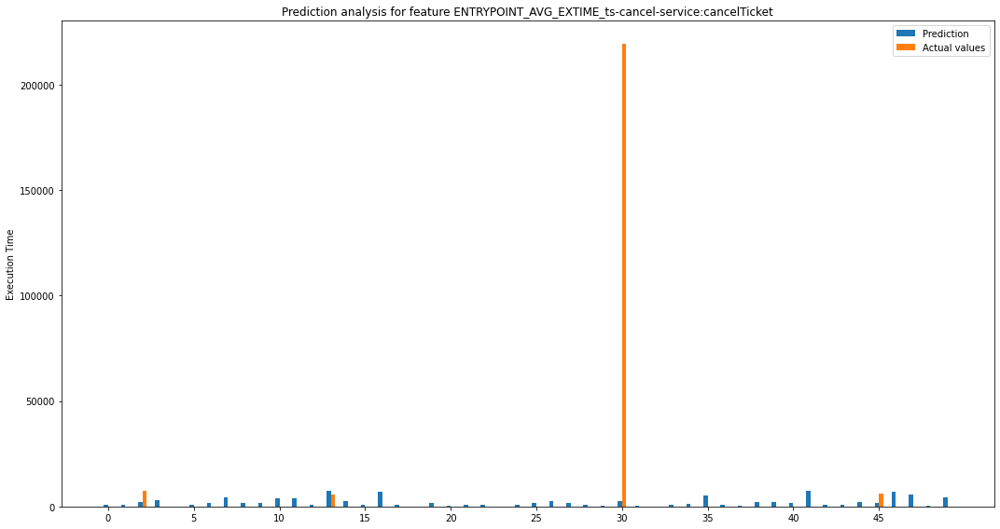

[array([867.98848012]), array([706.82514415]), array([5372.66446609]), array([2811.89983646]), array([103.06146284]), array([885.38133727]), array([1548.86613164]), array([4494.97845039]), array([1673.98929181]), array([1613.79946497]), array([3673.76872706]), array([3770.55601962]), array([958.17456626]), array([1451.50638874]), array([2668.87238543]), array([810.3021706]), array([6972.36523688]), array([820.15812298]), array([127.97342504]), array([1734.50582597]), array([491.22329085]), array([637.34290972]), array([662.29192945]), array([17.39285714]), array([637.34290972]), array([1759.74163781]), array([2727.67425078]), array([1608.885972]), array([958.43133727]), array([170.94631133]), array([216675.82976451]), array([491.22329085]), array([63.38730159]), array([750.35999264]), array([1112.11925837]), array([5133.43615359]), array([852.9146706]), array([246.02547799]), array([2240.33553391]), array([2089.18990176]), array([1601.6771706]), array([7214.71117391]), array([885.38133

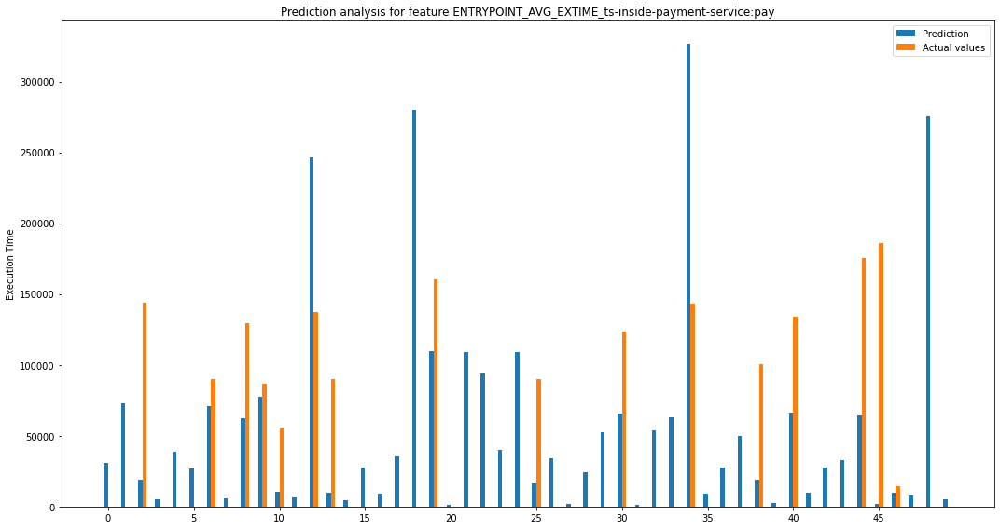

[array([30941.12413366]), array([72624.58664635]), array([124818.05875454]), array([4851.85901671]), array([38795.24663546]), array([26741.94337969]), array([19005.85125703]), array([5936.91446726]), array([66654.27454971]), array([9033.80049513]), array([44525.45264624]), array([6682.26976668]), array([109219.6393272]), array([80490.20967878]), array([4780.49223658]), array([27298.16035985]), array([9344.70967102]), array([35244.01841937]), array([279974.78252702]), array([50276.90755819]), array([997.62684048]), array([108973.46461873]), array([94108.5931271]), array([39906.46784307]), array([108973.46461873]), array([73260.42797931]), array([33854.49548577]), array([1720.30067732]), array([24512.86228445]), array([52575.97507713]), array([58048.2101823]), array([997.62684048]), array([53757.23070815]), array([63256.35085848]), array([183239.02411035]), array([8888.95209448]), array([27651.22204636]), array([49789.90856523]), array([81299.55875454]), array([2529.94628543]), array([67

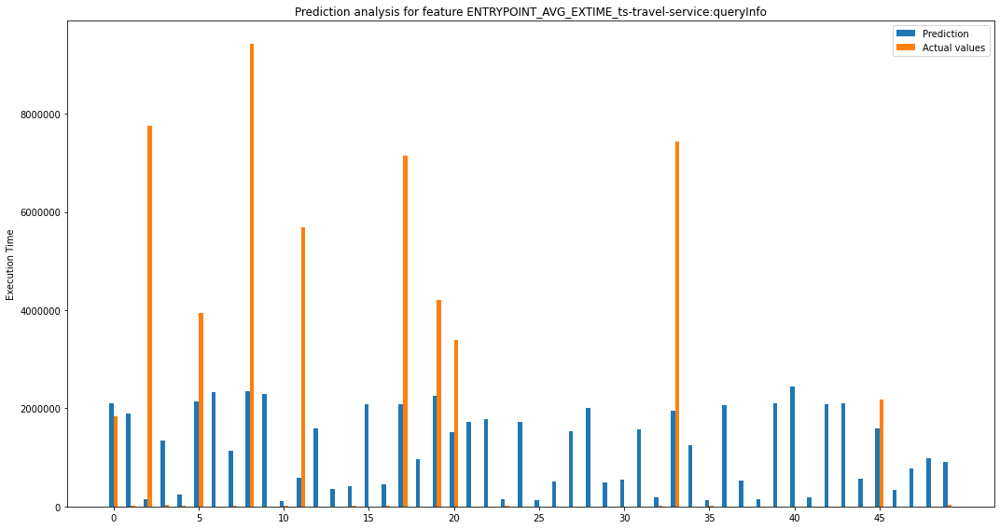

[array([256142.82135889]), array([1868486.83186549]), array([7611015.05899909]), array([1312083.22101306]), array([227186.01391091]), array([1808078.39241179]), array([2337319.79223587]), array([1114777.7478496]), array([7081144.45386874]), array([2295798.28300571]), array([94468.91037245]), array([5088311.44188837]), array([1586443.65051225]), array([362073.32900902]), array([387552.00551091]), array([2080884.62903266]), array([438813.30626297]), array([5067395.91908838]), array([966631.16058537]), array([1964460.69286153]), array([1862294.7879729]), array([1725465.07536756]), array([1774723.35942322]), array([121231.80662214]), array([1725465.07536756]), array([134816.45902208]), array([507697.55032154]), array([1538249.67153886]), array([2012901.91513666]), array([491228.74226182]), array([543451.69132744]), array([1568847.4370271]), array([165136.11932135]), array([5485253.40772192]), array([1254279.87544576]), array([115512.47905102]), array([2056199.24778746]), array([526753.9919

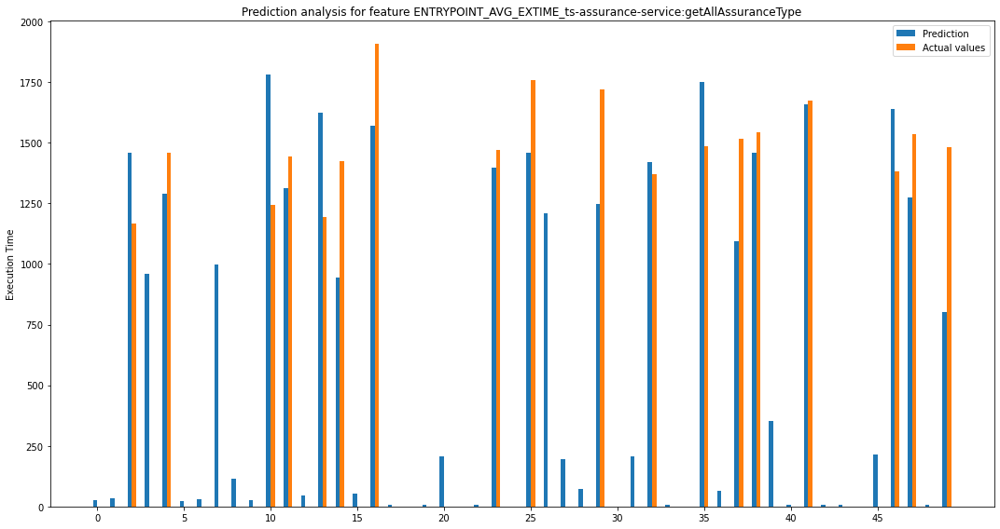

[array([27.86016026]), array([34.46111264]), array([288.66449008]), array([960.53509953]), array([171.24442909]), array([21.57095238]), array([31.69516026]), array([997.2518739]), array([115.91205357]), array([27.86016026]), array([536.93556574]), array([134.2350424]), array([46.68238095]), array([428.6223622]), array([481.0752477]), array([53.28333333]), array([337.02938584]), array([6.60095238]), array([0.]), array([6.60095238]), array([207.86669505]), array([0.]), array([6.60095238]), array([70.89858481]), array([0.]), array([300.92473214]), array([1207.63057716]), array([194.65352857]), array([72.44111264]), array([470.200758]), array([0.]), array([207.86669505]), array([52.65931995]), array([6.60095238]), array([0.]), array([263.73875556]), array([65.26444597]), array([425.8722289]), array([86.33550992]), array([352.1530851]), array([6.60095238]), array([15.20961862]), array([6.60095238]), array([6.60095238]), array([0.]), array([212.90739822]), array([257.07840607]), array([261.1

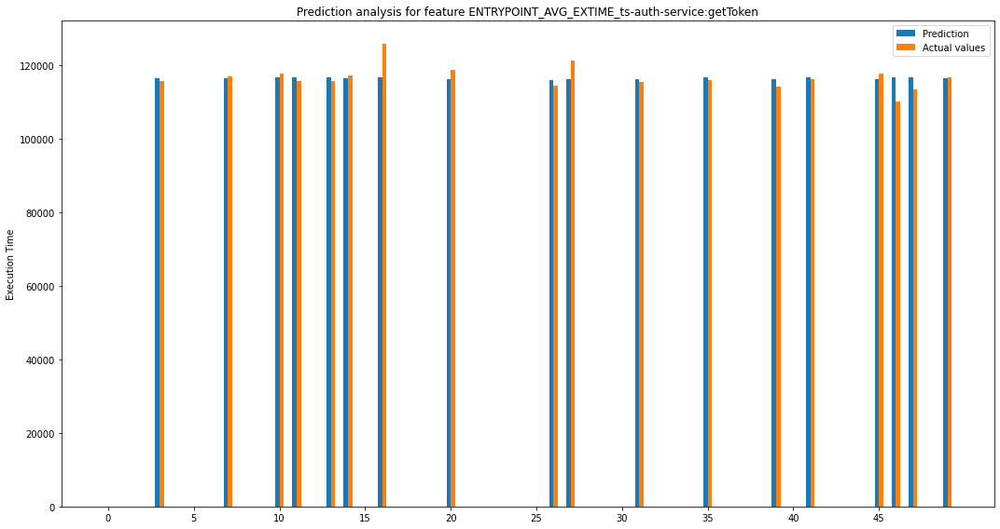

[array([0.]), array([0.]), array([0.]), array([860.43959547]), array([0.]), array([0.]), array([0.]), array([468.39897721]), array([0.]), array([0.]), array([1122.23615662]), array([855.80139028]), array([0.]), array([961.08310122]), array([888.05085048]), array([0.]), array([9066.99586178]), array([0.]), array([0.]), array([0.]), array([2728.61637717]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([1470.47488214]), array([5253.3994875]), array([0.]), array([0.]), array([0.]), array([803.7502895]), array([0.]), array([0.]), array([0.]), array([929.20691249]), array([0.]), array([0.]), array([0.]), array([2147.20766074]), array([0.]), array([512.4845233]), array([0.]), array([0.]), array([0.]), array([1589.81681711]), array([6564.77206151]), array([3298.58458542]), array([0.]), array([359.5446465])] [array([0.]), array([0.]), array([0.]), array([740356.29745594]), array([0.]), array([0.]), array([0.]), array([219397.60184821]), array([0.]), array([0.]), array([

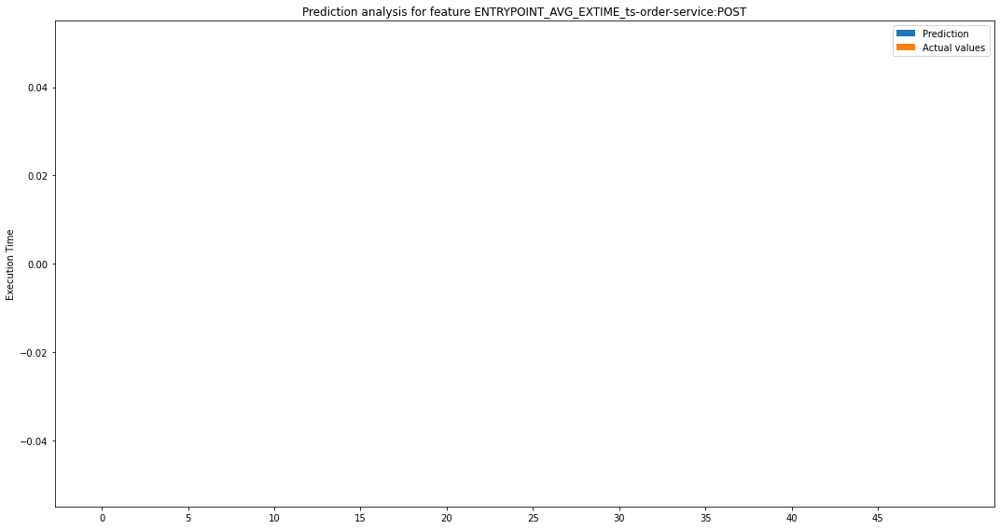

[array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]

/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  return abs((true-pred)/true) * 100
/home/dimenna/AVV/git/obstack/notebooks/env/lib/python3.9/site-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  return abs((true-pred)/true) * 100
/home/dimenna/AVV/git/o

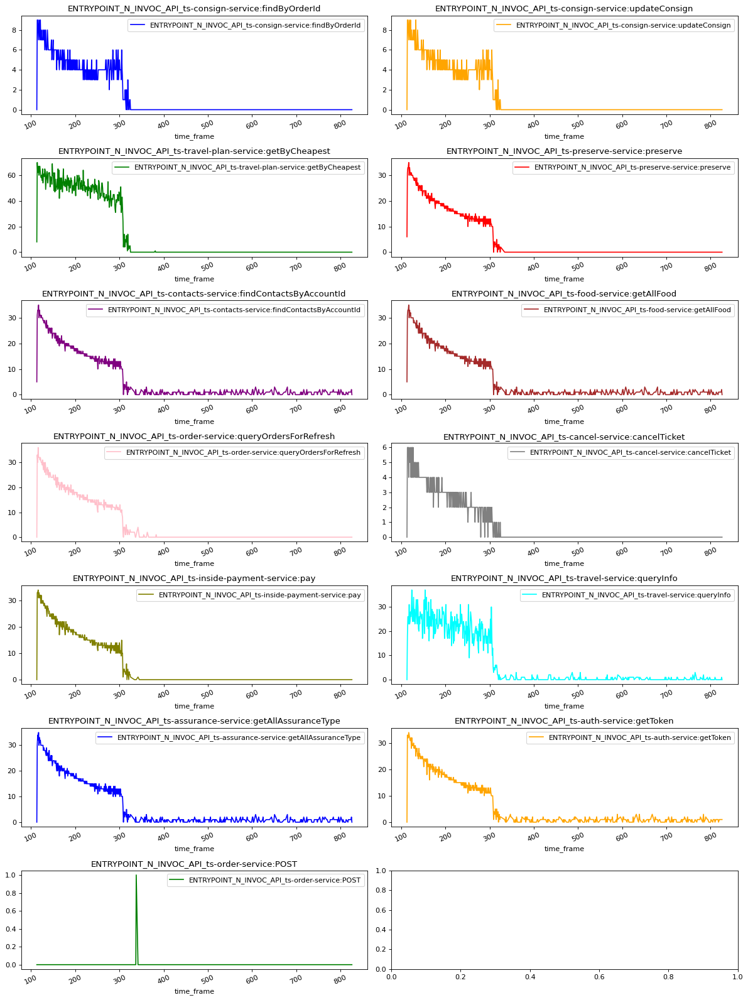

Data normalized
Input size 45 Output size 13
TOTAL MSE:  0.0008778461951878414
TOTAL MAE:  0.010726109272023417
TOTAL MAPE:  0.35
FIRST 50 predictions
ENTRY ENTRYPOINT_AVG_EXTIME_ts-consign-service:findByOrderId
PRED [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
VALS [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


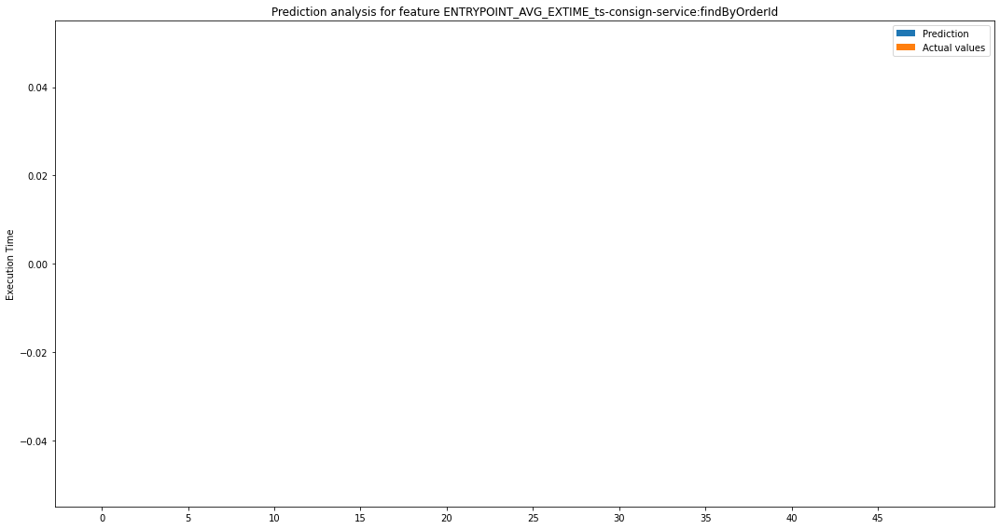

/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100


[array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]

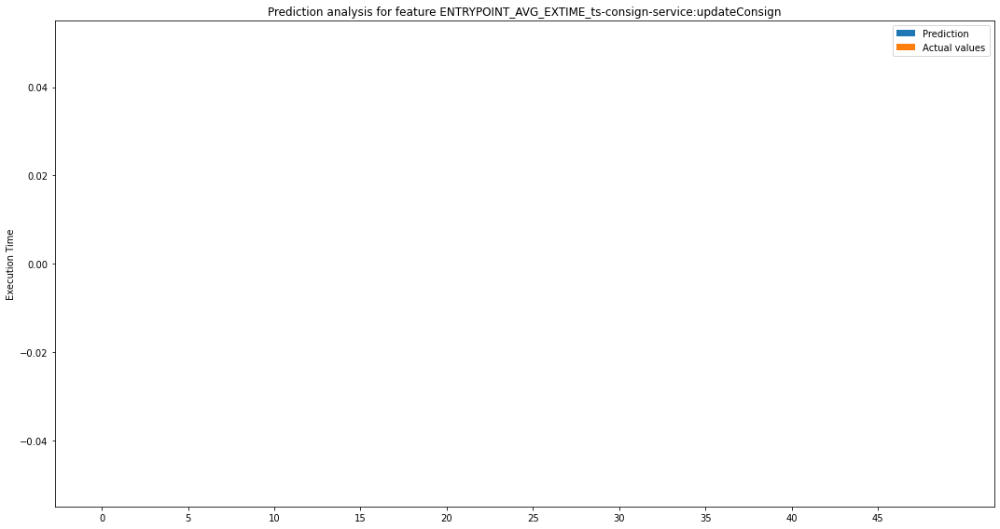

[array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]

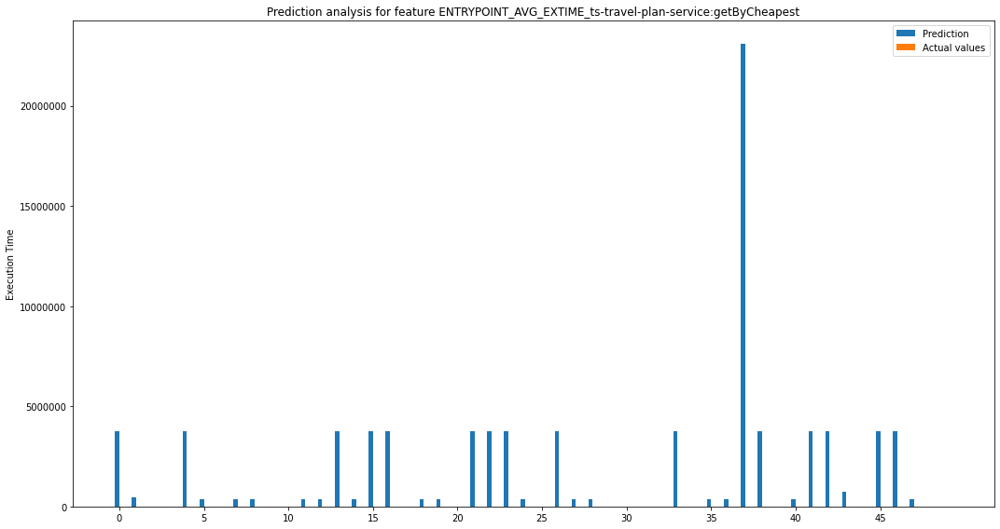

[array([3769033.30954387]), array([461005.6507007]), array([868.05470659]), array([1276.64264128]), array([3769033.30954387]), array([363747.93361722]), array([1276.64264128]), array([363747.93361722]), array([379563.5029706]), array([1276.64264128]), array([1276.64264128]), array([363747.93361722]), array([363747.93361722]), array([3769033.30954387]), array([374956.89376007]), array([3769033.30954387]), array([3769033.30954387]), array([1276.64264128]), array([368354.54282774]), array([363747.93361722]), array([1276.64264128]), array([3769033.30954387]), array([3769033.30954387]), array([3769033.30954387]), array([363747.93361722]), array([1276.64264128]), array([3769033.30954387]), array([363747.93361722]), array([379563.5029706]), array([1276.64264128]), array([1276.64264128]), array([1276.64264128]), array([1276.64264128]), array([3769033.30954387]), array([1276.64264128]), array([368354.54282774]), array([379563.5029706]), array([23090892.71621054]), array([3769033.30954387]), arr

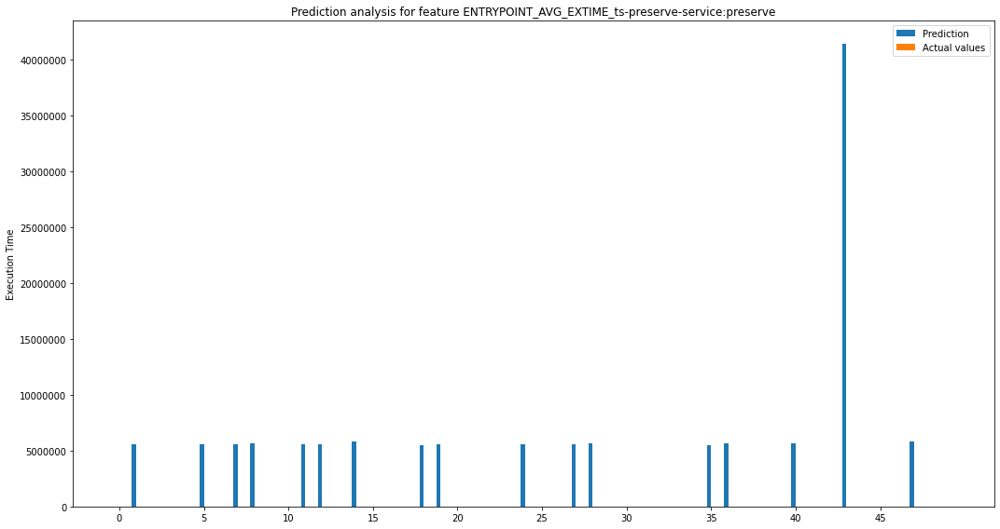

[array([0.]), array([5593266.16551217]), array([1184.12748386]), array([1741.48890286]), array([0.]), array([5609763.43113286]), array([1741.48890286]), array([5609763.43113286]), array([5675840.30843706]), array([1741.48890286]), array([1741.48890286]), array([5609763.43113286]), array([5609763.43113286]), array([0.]), array([5835293.72018048]), array([0.]), array([0.]), array([1741.48890286]), array([5450310.01938944]), array([5609763.43113286]), array([1741.48890286]), array([0.]), array([0.]), array([0.]), array([5609763.43113286]), array([1741.48890286]), array([0.]), array([5609763.43113286]), array([5675840.30843706]), array([1741.48890286]), array([1741.48890286]), array([1741.48890286]), array([1741.48890286]), array([0.]), array([1741.48890286]), array([5450310.01938944]), array([5675840.30843706]), array([0.]), array([0.]), array([1741.48890286]), array([5675840.30843706]), array([0.]), array([0.]), array([41425037.99050295]), array([1741.48890286]), array([0.]), array([0.])

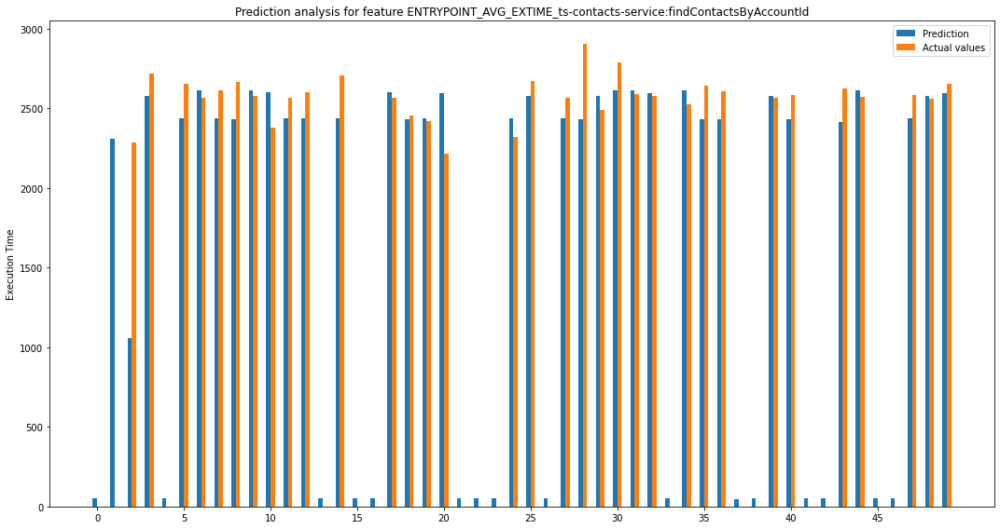

[array([51.27778424]), array([2311.43381532]), array([1228.17589105]), array([143.82782121]), array([51.27778424]), array([213.8944649]), array([43.03758061]), array([174.8944649]), array([231.8123304]), array([33.03758061]), array([221.91552214]), array([130.8944649]), array([166.8944649]), array([51.27778424]), array([270.85675657]), array([51.27778424]), array([51.27778424]), array([31.91552214]), array([25.85003873]), array([19.1055351]), array([379.33014541]), array([51.27778424]), array([51.27778424]), array([51.27778424]), array([117.1055351]), array([94.32782121]), array([51.27778424]), array([130.8944649]), array([472.3123304]), array([88.17217879]), array([179.96241939]), array([21.03758061]), array([18.33014541]), array([51.27778424]), array([84.03758061]), array([209.85003873]), array([176.3123304]), array([43.67010287]), array([51.27778424]), array([11.67217879]), array([153.3123304]), array([51.27778424]), array([51.27778424]), array([208.10658273]), array([38.03758061]),

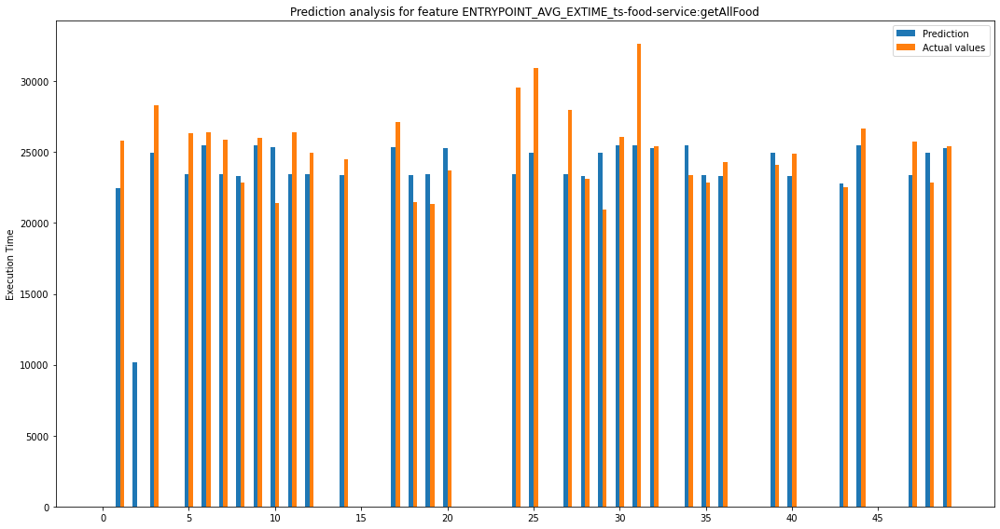

[array([0.]), array([3312.00874831]), array([10196.98003812]), array([3378.06106709]), array([0.]), array([2890.04244285]), array([868.50483147]), array([2475.04244285]), array([471.83241643]), array([471.50483147]), array([3955.64896808]), array([2968.04244285]), array([1562.04244285]), array([0.]), array([1086.86452618]), array([0.]), array([0.]), array([1814.35103192]), array([1845.15449977]), array([2107.95755715]), array([1606.70132289]), array([0.]), array([0.]), array([0.]), array([6154.04244285]), array([5961.06106709]), array([0.]), array([4566.04244285]), array([238.33241643]), array([4017.93893291]), array([543.50483147]), array([7115.50483147]), array([116.29867711]), array([0.]), array([2102.49516853]), array([464.65449977]), array([969.66758357]), array([0.]), array([0.]), array([820.43893291]), array([1544.16758357]), array([0.]), array([0.]), array([290.96123584]), array([1168.50483147]), array([0.]), array([0.]), array([2337.36452618]), array([2119.43893291]), array([1

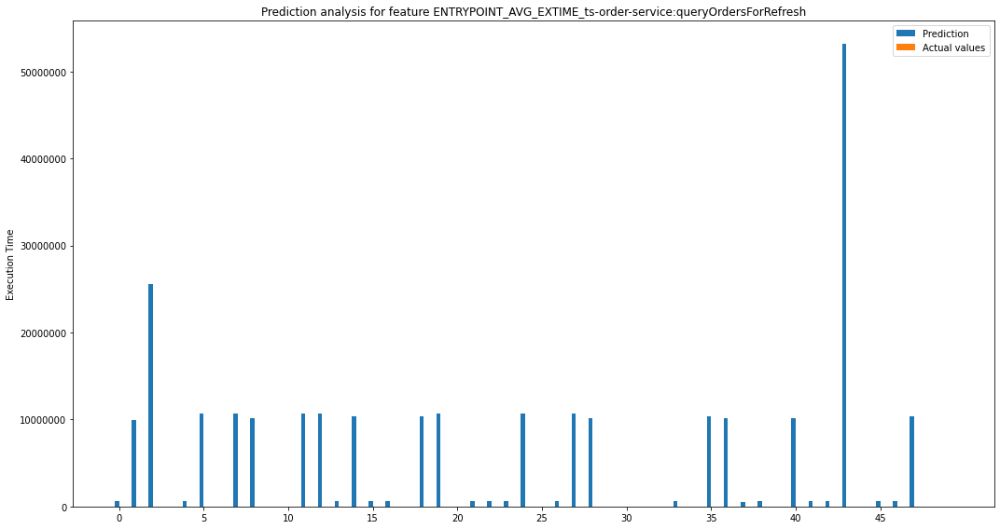

[array([654206.57941873]), array([9914538.09859847]), array([25597333.64560782]), array([0.]), array([654206.57941873]), array([10638807.73815188]), array([0.]), array([10638807.73815188]), array([10122535.51476466]), array([0.]), array([0.]), array([10638807.73815188]), array([10638807.73815188]), array([654206.57941873]), array([10398975.38801794]), array([654206.57941873]), array([654206.57941873]), array([0.]), array([10362367.86489858]), array([10638807.73815188]), array([0.]), array([654206.57941873]), array([654206.57941873]), array([654206.57941873]), array([10638807.73815188]), array([0.]), array([654206.57941873]), array([10638807.73815188]), array([10122535.51476466]), array([0.]), array([0.]), array([0.]), array([0.]), array([654206.57941873]), array([0.]), array([10362367.86489858]), array([10122535.51476466]), array([507533.85673569]), array([654206.57941873]), array([0.]), array([10122535.51476466]), array([654206.57941873]), array([654206.57941873]), array([53182246.210

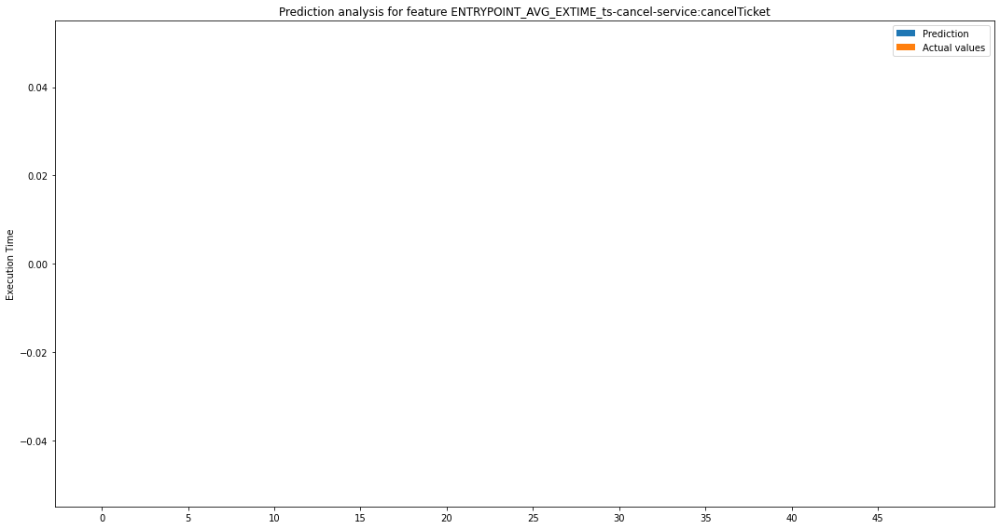

[array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]

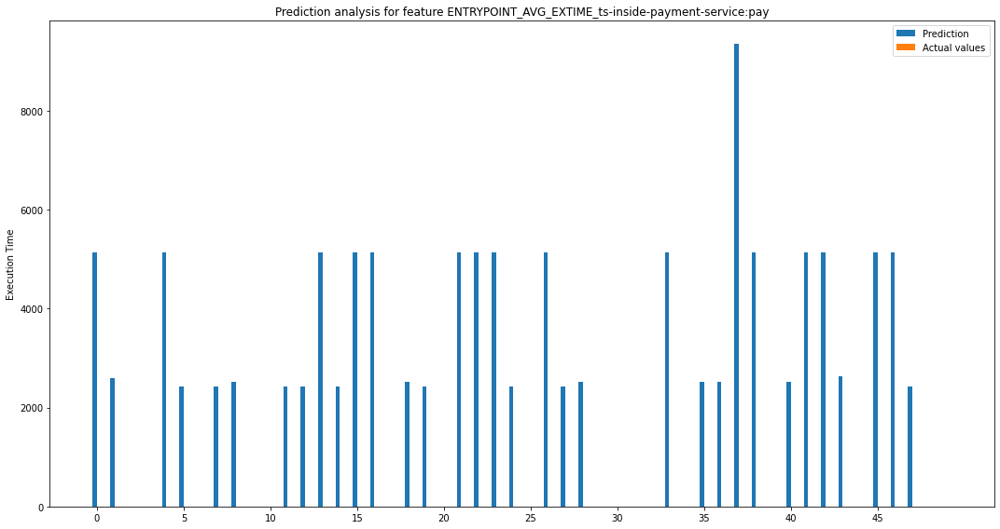

[array([5139.53735731]), array([2589.83759756]), array([0.]), array([0.]), array([5139.53735731]), array([2418.97839544]), array([0.]), array([2418.97839544]), array([2525.58250729]), array([0.]), array([0.]), array([2418.97839544]), array([2418.97839544]), array([5139.53735731]), array([2418.97839544]), array([5139.53735731]), array([5139.53735731]), array([0.]), array([2525.58250729]), array([2418.97839544]), array([0.]), array([5139.53735731]), array([5139.53735731]), array([5139.53735731]), array([2418.97839544]), array([0.]), array([5139.53735731]), array([2418.97839544]), array([2525.58250729]), array([0.]), array([0.]), array([0.]), array([0.]), array([5139.53735731]), array([0.]), array([2525.58250729]), array([2525.58250729]), array([9352.32316088]), array([5139.53735731]), array([0.]), array([2525.58250729]), array([5139.53735731]), array([5139.53735731]), array([2641.03873533]), array([0.]), array([5139.53735731]), array([5139.53735731]), array([2418.97839544]), array([0.]),

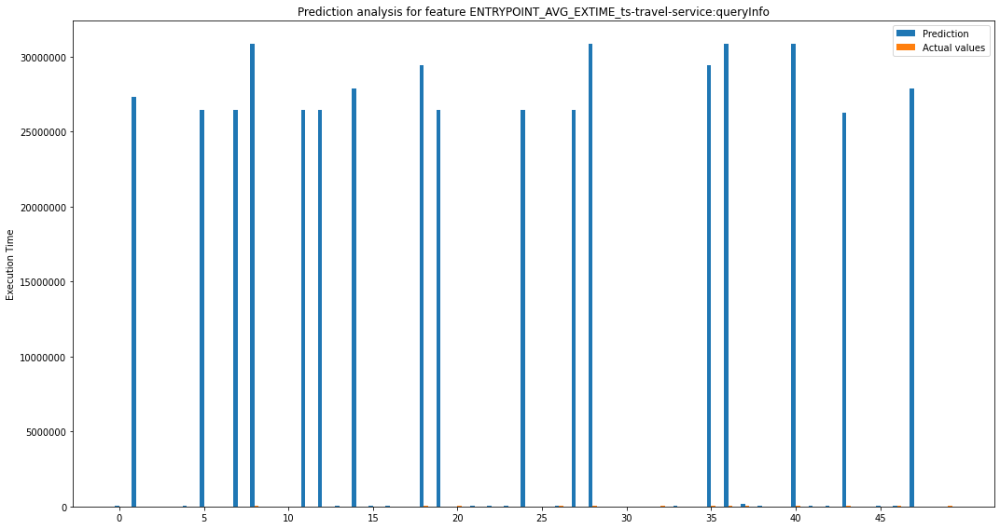

[array([66736.31105054]), array([27335845.64542987]), array([6955.44785791]), array([4158.16624939]), array([66736.31105054]), array([26453902.79563453]), array([3966.33991065]), array([26453902.79563453]), array([30814477.65323949]), array([3966.33991065]), array([4812.97910024]), array([26453902.79563453]), array([26453902.79563453]), array([66736.31105054]), array([27887286.60911668]), array([66836.48533626]), array([66736.31105054]), array([4812.97910024]), array([29381142.83975735]), array([26453902.79563453]), array([14398.47680452]), array([66836.48533626]), array([66836.48533626]), array([66736.31105054]), array([26453902.79563453]), array([4158.16624939]), array([37796.08366959]), array([26453902.79563453]), array([30818024.65323949]), array([4158.16624939]), array([3966.33991065]), array([3966.33991065]), array([22309.47680452]), array([66736.31105054]), array([3966.33991065]), array([29381648.83975735]), array([30821496.65323949]), array([162024.33630034]), array([66736.3110

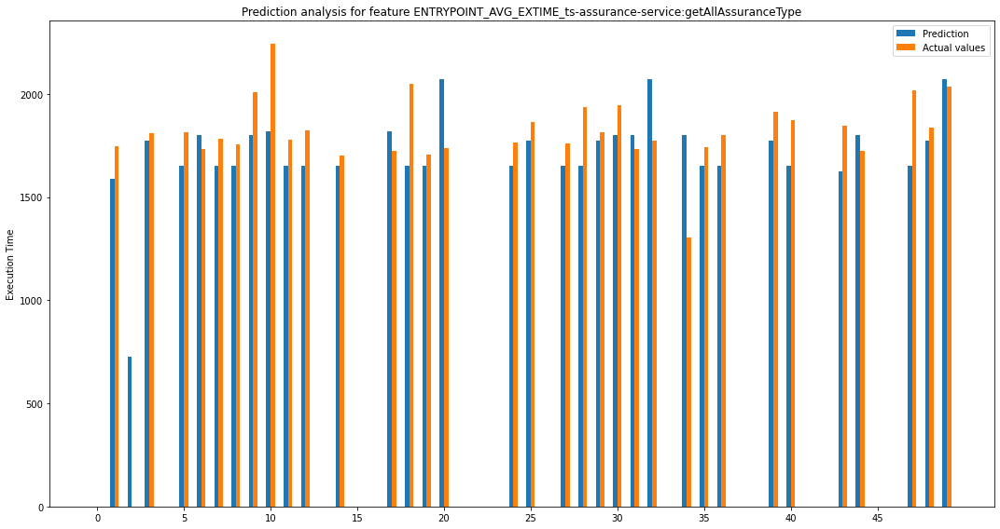

[array([0.]), array([159.5532503]), array([724.7124357]), array([35.37243012]), array([0.]), array([162.93711198]), array([65.64688522]), array([129.93711198]), array([103.92711772]), array([208.35311478]), array([421.14212378]), array([125.93711198]), array([168.93711198]), array([0.]), array([48.94868936]), array([0.]), array([0.]), array([97.85787622]), array([398.41554034]), array([54.93711198]), array([332.79136413]), array([0.]), array([0.]), array([0.]), array([111.93711198]), array([88.37243012]), array([0.]), array([108.93711198]), array([286.92711772]), array([37.37243012]), array([145.35311478]), array([69.64688522]), array([296.79136413]), array([0.]), array([498.64688522]), array([93.41554034]), array([148.92711772]), array([0.]), array([0.]), array([138.87243012]), array([224.92711772]), array([0.]), array([0.]), array([222.70999106]), array([77.64688522]), array([0.]), array([0.]), array([365.44868936]), array([63.37243012]), array([34.79136413])] [array([0.]), array([25

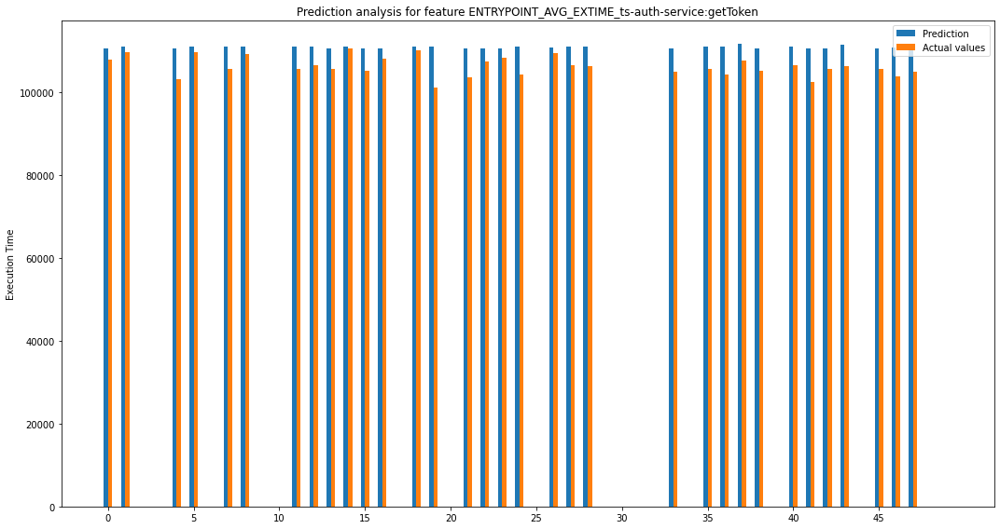

[array([2628.42143125]), array([1340.81398014]), array([0.]), array([0.]), array([7517.42143125]), array([1203.87506301]), array([0.]), array([5459.87506301]), array([1890.60675709]), array([0.]), array([0.]), array([5247.87506301]), array([4480.87506301]), array([4889.42143125]), array([545.30495884]), array([5503.54833601]), array([2430.42143125]), array([0.]), array([848.17686125]), array([9908.87506301]), array([0.]), array([7021.54833601]), array([3242.54833601]), array([2222.42143125]), array([6653.87506301]), array([0.]), array([1447.15785348]), array([4355.87506301]), array([4872.60675709]), array([0.]), array([0.]), array([0.]), array([0.]), array([5541.42143125]), array([0.]), array([5354.51019459]), array([6894.60675709]), array([3968.95801877]), array([5531.42143125]), array([0.]), array([4492.10675709]), array([8018.54833601]), array([4997.42143125]), array([5072.47220326]), array([0.]), array([4901.42143125]), array([7084.83743682]), array([6141.30495884]), array([0.]), a

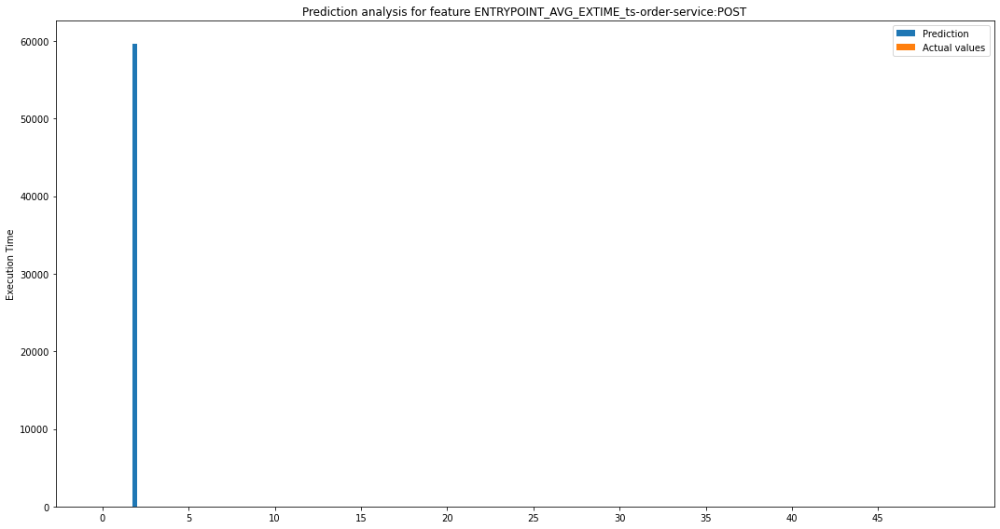

[array([0.]), array([0.]), array([59617.38]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([0.]), array([0.]), array([3.554232e+09]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([

/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100
/home/dimenna/AVV/git/obstack/notebooks/env/lib/python3.9/site-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/88310780

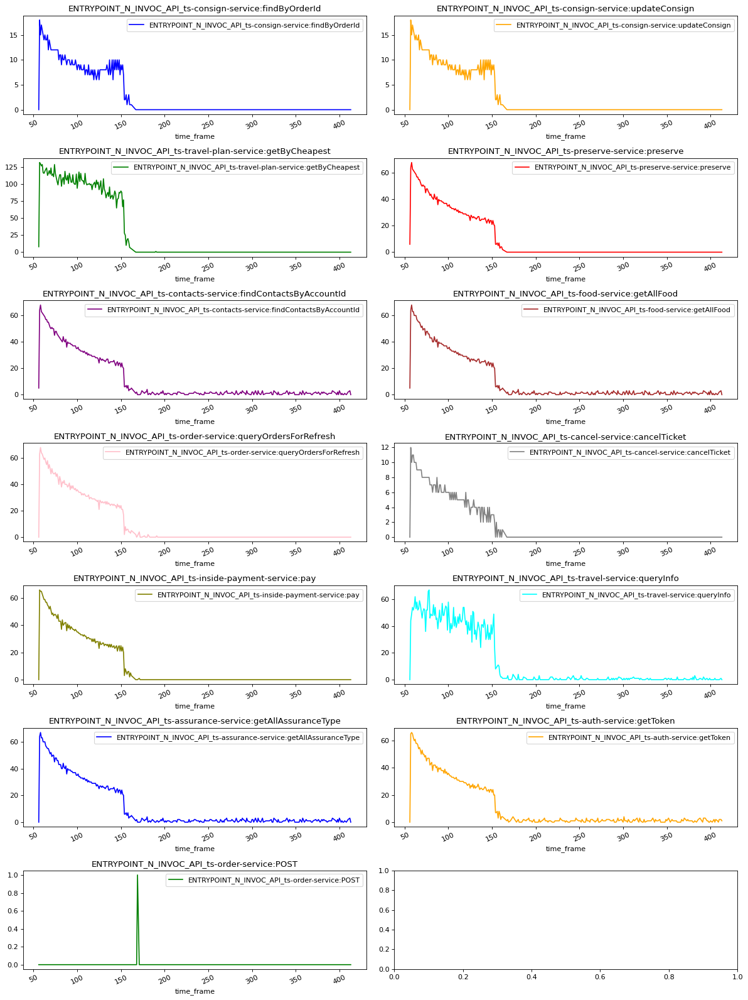

Data normalized
Input size 45 Output size 13
TOTAL MSE:  0.0008700533912662483
TOTAL MAE:  0.010366587366005271
TOTAL MAPE:  1.26
FIRST 50 predictions
ENTRY ENTRYPOINT_AVG_EXTIME_ts-consign-service:findByOrderId
PRED [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
VALS [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


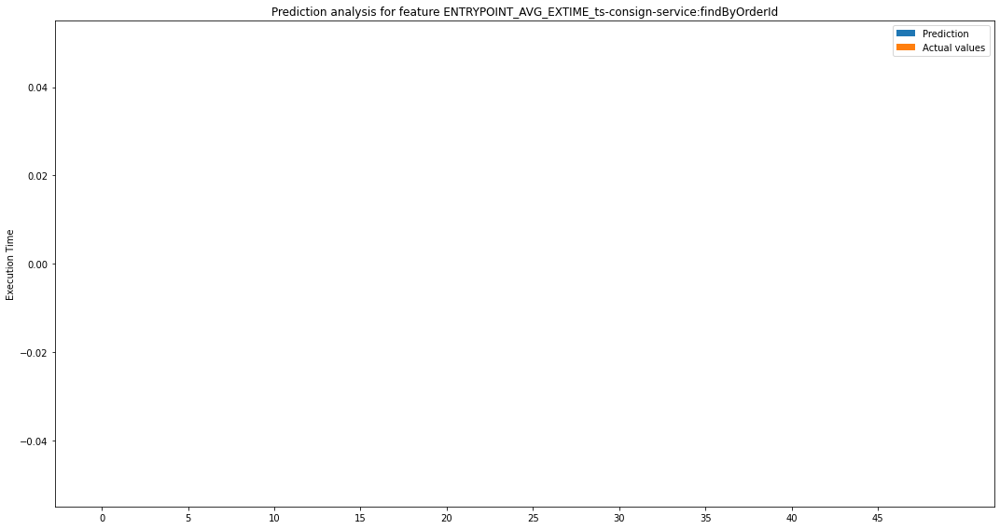

/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100


[array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]

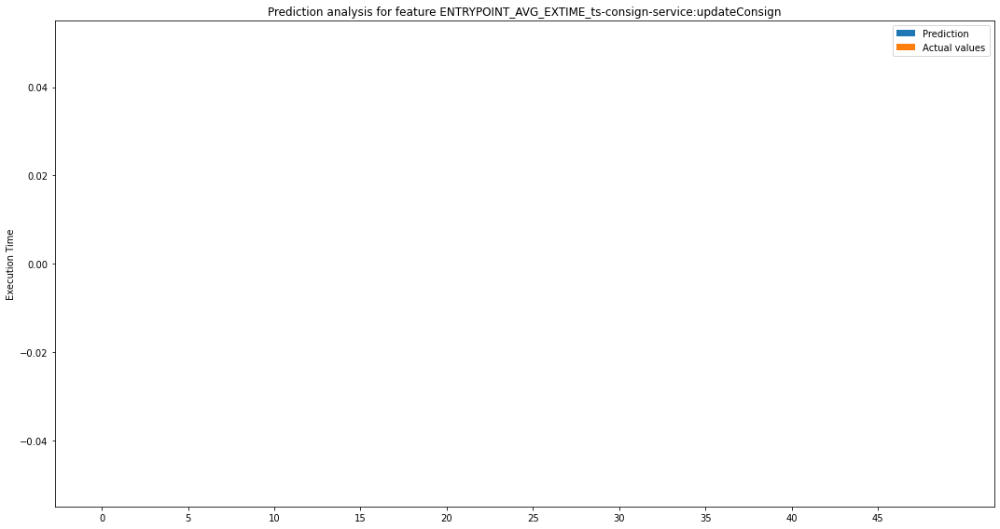

[array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]

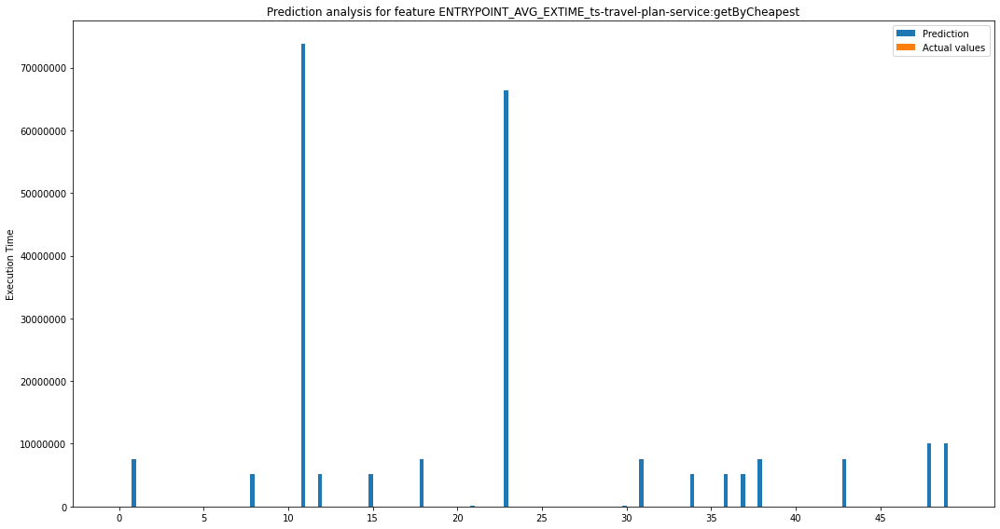

[array([0.]), array([7547396.51917475]), array([0.]), array([0.]), array([0.]), array([0.]), array([548.32566582]), array([548.32566582]), array([5095085.10917475]), array([0.]), array([0.]), array([73759804.58917478]), array([5095085.10917475]), array([548.32566582]), array([0.]), array([5095085.10917475]), array([0.]), array([548.32566582]), array([7547396.51917475]), array([0.]), array([548.32566582]), array([122615.5705]), array([0.]), array([66402870.35917478]), array([0.]), array([0.]), array([548.32566582]), array([0.]), array([0.]), array([548.32566582]), array([122615.5705]), array([7547396.51917475]), array([548.32566582]), array([0.]), array([5095085.10917475]), array([0.]), array([5095085.10917475]), array([5095085.10917475]), array([7547396.51917475]), array([548.32566582]), array([0.]), array([0.]), array([0.]), array([7547396.51917475]), array([548.32566582]), array([548.32566582]), array([548.32566582]), array([548.32566582]), array([9999707.92917475]), array([9999707.9

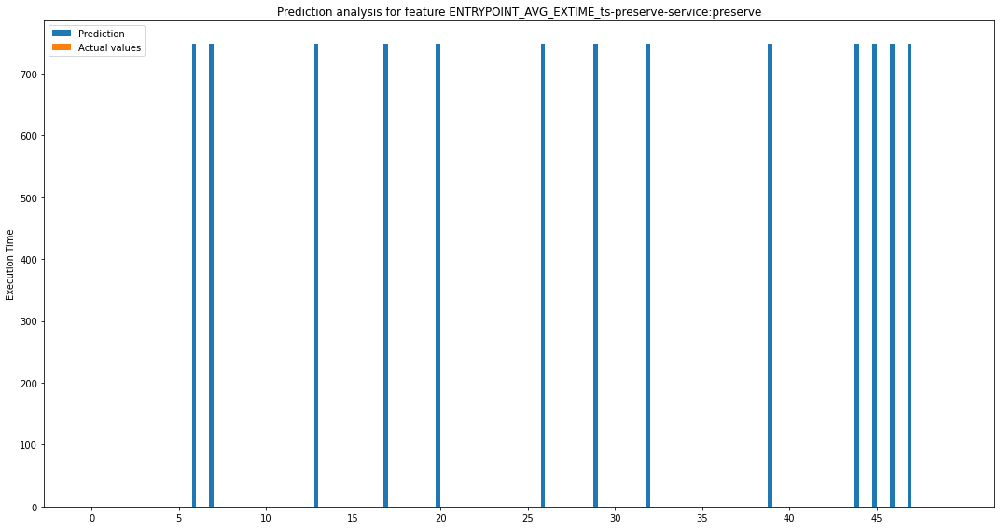

[array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([747.97992117]), array([747.97992117]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([747.97992117]), array([0.]), array([0.]), array([0.]), array([747.97992117]), array([0.]), array([0.]), array([747.97992117]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([747.97992117]), array([0.]), array([0.]), array([747.97992117]), array([0.]), array([0.]), array([747.97992117]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([747.97992117]), array([0.]), array([0.]), array([0.]), array([0.]), array([747.97992117]), array([747.97992117]), array([747.97992117]), array([747.97992117]), array([0.]), array([0.])] [array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([559473.96247036]), array([559473.96247036]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([559473.96247036]

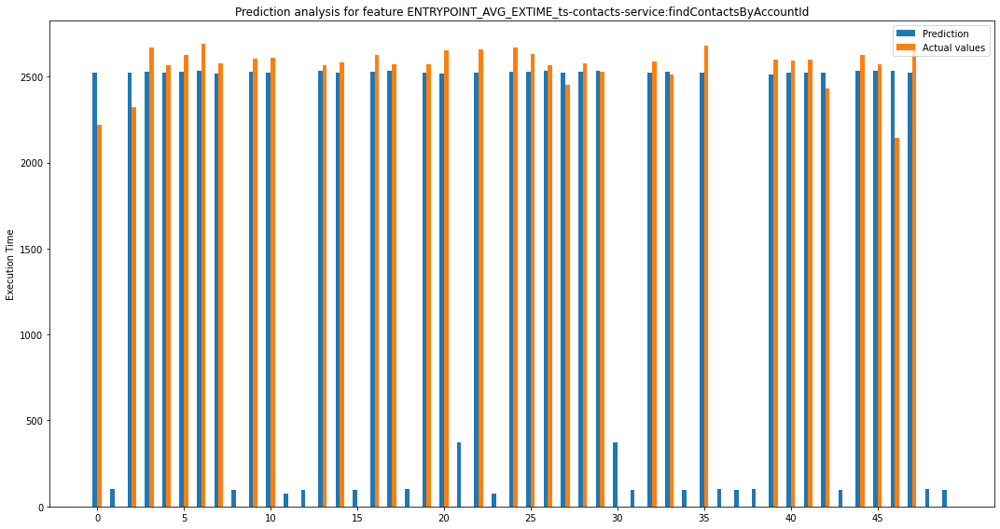

[array([304.77672442]), array([99.20979742]), array([205.00376449]), array([144.49251137]), array([42.99623551]), array([100.3258447]), array([155.38991058]), array([63.41018836]), array([97.39525196]), array([75.99251137]), array([85.22327558]), array([73.50374796]), array([97.39525196]), array([31.38991058]), array([62.22327558]), array([97.39525196]), array([96.3258447]), array([40.19391058]), array([99.20979742]), array([44.32956884]), array([135.41018836]), array([374.75524351]), array([134.55660891]), array([77.14724002]), array([141.99251137]), array([105.99251137]), array([35.19391058]), array([74.00376449]), array([48.99251137]), array([6.11008942]), array([374.75524351]), array([97.39525196]), array([62.28935502]), array([15.00748863]), array([97.39525196]), array([152.99623551]), array([99.20979742]), array([97.39525196]), array([99.20979742]), array([85.67659312]), array([66.99623551]), array([73.99623551]), array([91.67043116]), array([97.39525196]), array([93.88991058]), 

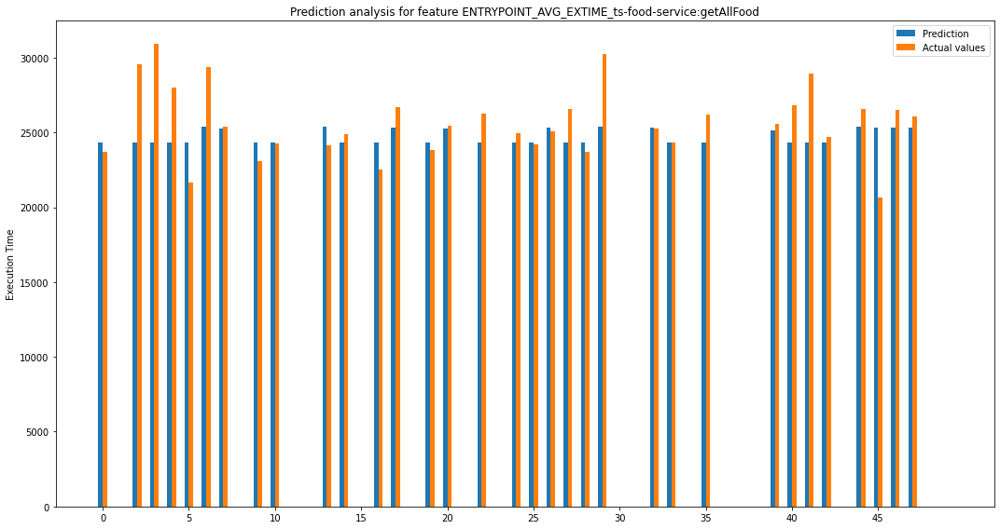

[array([617.72526527]), array([0.]), array([5240.70652728]), array([6593.38115947]), array([3652.70652728]), array([2669.2855072]), array([3941.58762467]), array([151.11979134]), array([0.]), array([1259.61884053]), array([18.72526527]), array([0.]), array([0.]), array([1268.91237533]), array([555.77473473]), array([0.]), array([1825.2855072]), array([1334.08862467]), array([0.]), array([537.96013938]), array([170.11979134]), array([0.]), array([1938.9414014]), array([0.]), array([642.38115947]), array([123.61884053]), array([285.91137533]), array([2250.70652728]), array([606.61884053]), array([4814.08762467]), array([0.]), array([0.]), array([103.49220866]), array([1.61884053]), array([0.]), array([1837.70652728]), array([0.]), array([0.]), array([0.]), array([484.34732003]), array([2508.70652728]), array([4581.70652728]), array([349.03986062]), array([0.]), array([1187.08762467]), array([4685.91137533]), array([1150.08862467]), array([713.674458]), array([0.]), array([0.])] [array([3

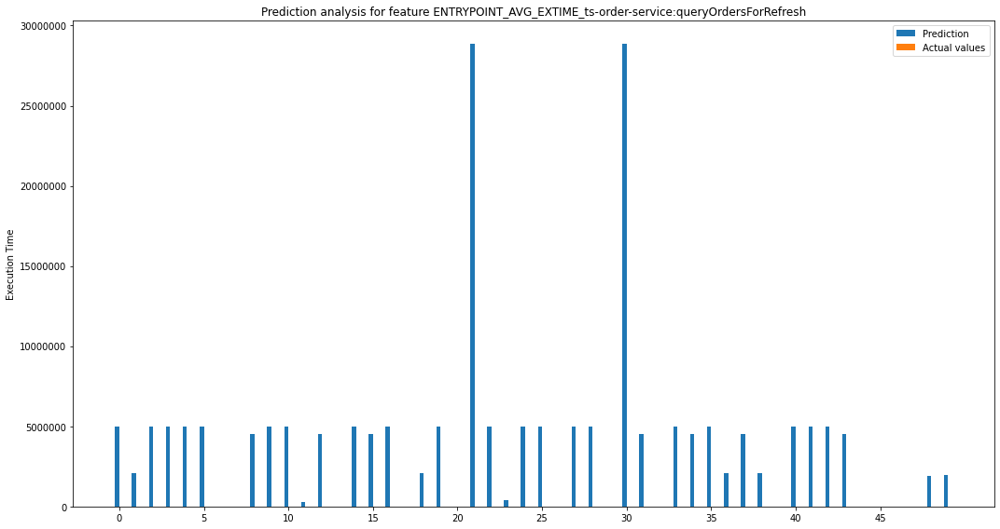

[array([4966182.48401231]), array([2106459.39578035]), array([5002079.00435714]), array([4966182.48401231]), array([5002079.00435714]), array([4966182.48401231]), array([0.]), array([0.]), array([4521124.55328035]), array([4966182.48401231]), array([4966182.48401231]), array([268296.12861111]), array([4521124.55328035]), array([0.]), array([4966182.48401231]), array([4521124.55328035]), array([4966182.48401231]), array([0.]), array([2106459.39578035]), array([5002079.00435714]), array([0.]), array([28851410.02205518]), array([4966182.48401231]), array([402444.19291667]), array([4966182.48401231]), array([4966182.48401231]), array([0.]), array([5002079.00435714]), array([4966182.48401231]), array([0.]), array([28851410.02205518]), array([4521124.55328035]), array([0.]), array([4966182.48401231]), array([4521124.55328035]), array([5002079.00435714]), array([2106459.39578035]), array([4521124.55328035]), array([2106459.39578035]), array([0.]), array([5002079.00435714]), array([5002079.004

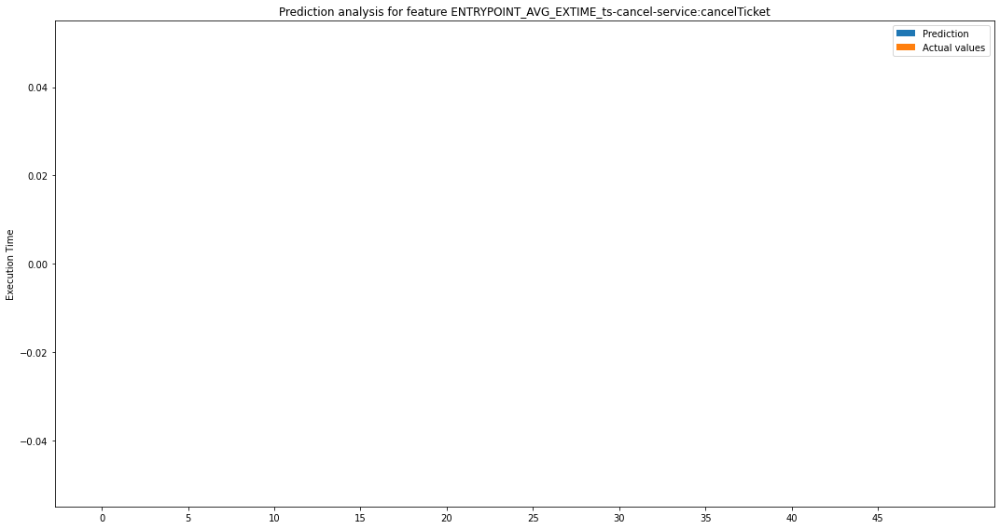

[array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]

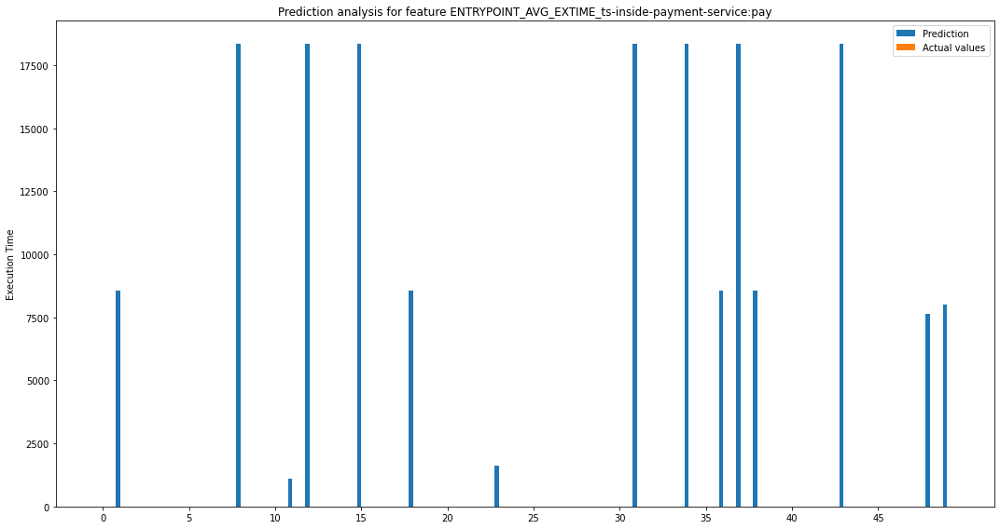

[array([0.]), array([8548.30777597]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([18347.35777597]), array([0.]), array([0.]), array([1088.78333333]), array([18347.35777597]), array([0.]), array([0.]), array([18347.35777597]), array([0.]), array([0.]), array([8548.30777597]), array([0.]), array([0.]), array([0.]), array([0.]), array([1633.175]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([18347.35777597]), array([0.]), array([0.]), array([18347.35777597]), array([0.]), array([8548.30777597]), array([18347.35777597]), array([8548.30777597]), array([0.]), array([0.]), array([0.]), array([0.]), array([18347.35777597]), array([0.]), array([0.]), array([0.]), array([0.]), array([7657.4850487]), array([8003.9161093])] [array([0.]), array([73073565.83271192]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([3.36625537e+08]), array([0.]), array([0.]), array([118544

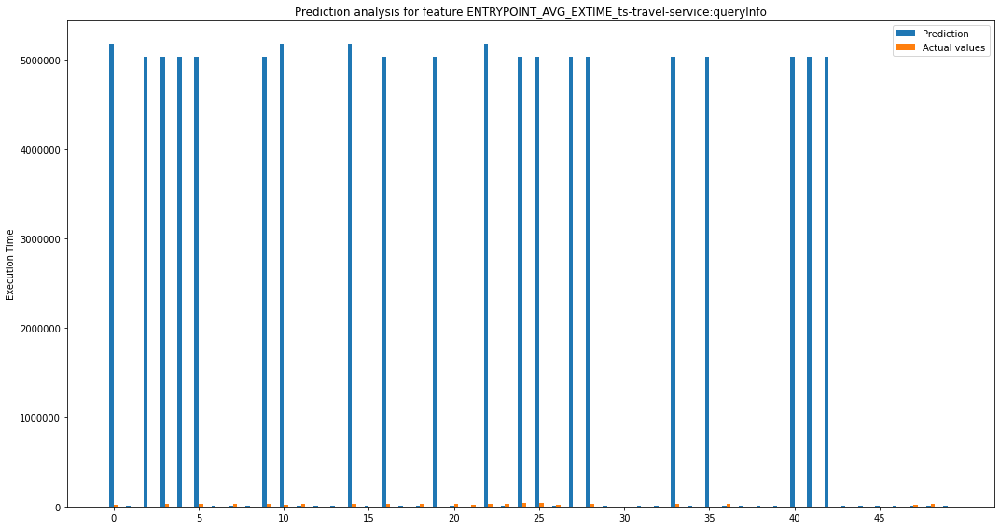

[array([5153289.6060976]), array([5569.4109554]), array([5027336.60333493]), array([4997636.37933493]), array([5027336.60333493]), array([5001776.37933493]), array([7094.11339221]), array([22805.44483002]), array([5809.71485409]), array([4998784.37933493]), array([5153091.6060976]), array([24218.5923241]), array([5809.71485409]), array([7094.11339221]), array([5145271.6060976]), array([5809.71485409]), array([4999072.37933493]), array([6886.26339221]), array([24756.03626479]), array([5027336.60333493]), array([23275.44483002]), array([16394.4895]), array([5145234.6060976]), array([27161.66133509]), array([4986341.37933493]), array([4990854.37933493]), array([14828.73660779]), array([5027336.60333493]), array([4997933.37933493]), array([7094.11339221]), array([48.5105]), array([5768.78100793]), array([7321.62116998]), array([4997096.37933493]), array([5809.71485409]), array([5027336.60333493]), array([25191.10241864]), array([5809.71485409]), array([5569.4109554]), array([7114.46965289]

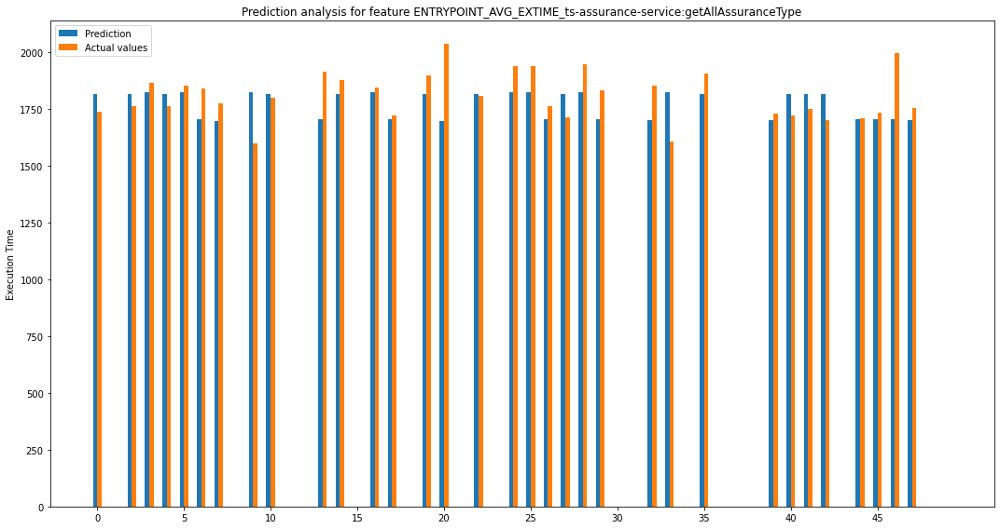

[array([76.29679574]), array([0.]), array([51.23225435]), array([40.11037784]), array([54.23225435]), array([30.7770445]), array([135.24626401]), array([75.56543068]), array([0.]), array([226.2229555]), array([15.29679574]), array([0.]), array([0.]), array([210.24626401]), array([60.70320426]), array([0.]), array([23.11037784]), array([19.71093068]), array([0.]), array([82.43441232]), array([337.56543068]), array([0.]), array([5.96346241]), array([0.]), array([116.11037784]), array([116.11037784]), array([59.71093068]), array([101.23225435]), array([122.11037784]), array([129.74626401]), array([0.]), array([0.]), array([152.59209735]), array([217.88962216]), array([0.]), array([89.76774565]), array([0.]), array([0.]), array([0.]), array([30.62389344]), array([93.23225435]), array([64.23225435]), array([113.89892101]), array([0.]), array([4.74626401]), array([30.71093068]), array([293.71093068]), array([54.25876401]), array([0.]), array([0.])] [array([5821.20104038]), array([0.]), array

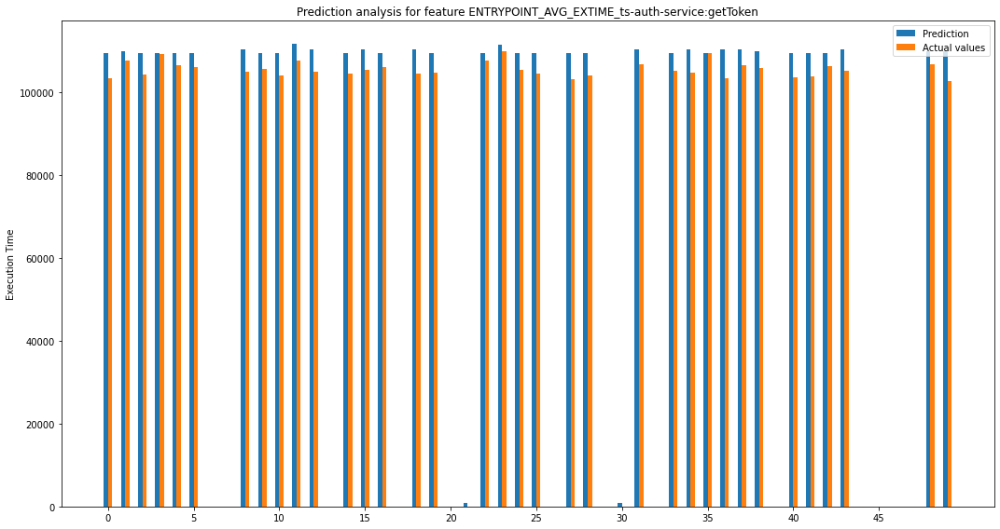

[array([6132.44343577]), array([2169.07035204]), array([5311.17322393]), array([209.1812814]), array([3013.17322393]), array([3411.1812814]), array([0.]), array([0.]), array([5443.7394644]), array([3922.51461473]), array([5491.44343577]), array([4110.40616697]), array([5433.7394644]), array([0.]), array([5109.19343577]), array([4899.7394644]), array([3340.1812814]), array([0.]), array([5774.97404482]), array([4769.17322393]), array([0.]), array([945.0305]), array([1873.94343577]), array([1534.96012912]), array([4043.51461473]), array([5080.1812814]), array([0.]), array([6337.83989059]), array([5481.1812814]), array([0.]), array([945.0305]), array([3613.91677209]), array([0.]), array([4375.1812814]), array([5550.7394644]), array([142.17322393]), array([6818.29673713]), array([3867.7394644]), array([4149.73701871]), array([0.]), array([5980.17322393]), array([5635.17322393]), array([3283.17322393]), array([5222.41677209]), array([0.]), array([0.]), array([0.]), array([0.]), array([3225.6

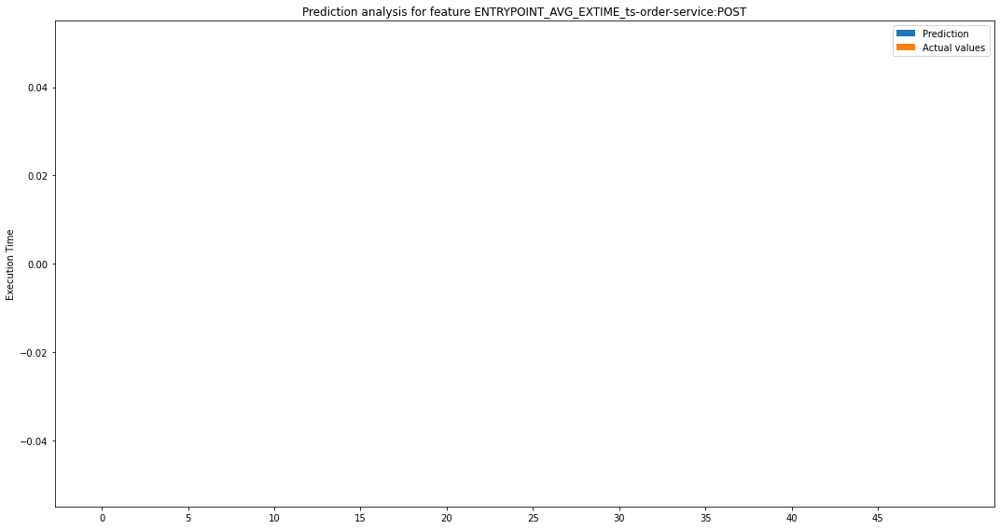

[array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]

/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  return abs((true-pred)/true) * 100
/home/dimenna/AVV/git/obstack/notebooks/env/lib/python3.9/site-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/88310780

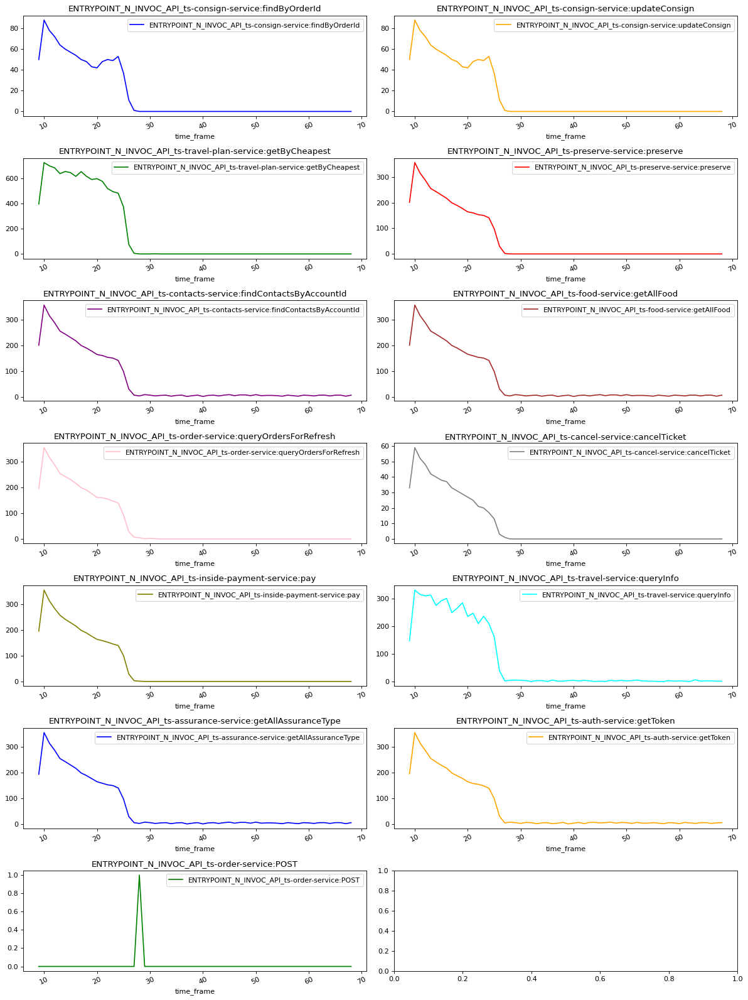

Data normalized
Input size 45 Output size 13
TOTAL MSE:  0.004582665161886717
TOTAL MAE:  0.03069585462114362
TOTAL MAPE:  0.15
FIRST 50 predictions
ENTRY ENTRYPOINT_AVG_EXTIME_ts-consign-service:findByOrderId
PRED [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
VALS [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


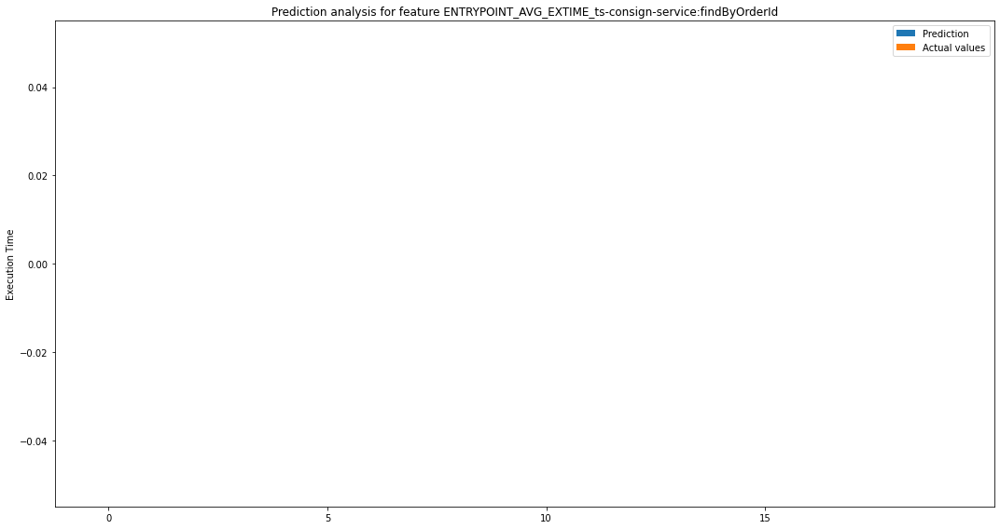

/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100


[array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan])]
ENTRY ENTRYPOINT_AVG_EXTIME_ts-consign-service:updateConsign
PRED [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
VALS [0.0, 0.0, 0.0, 0.0, 0.0,

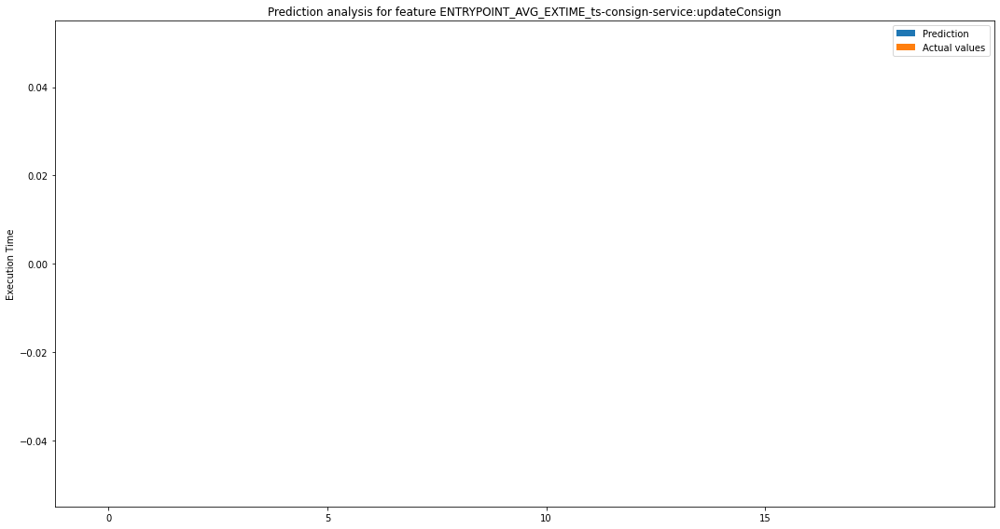

[array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan])]
ENTRY ENTRYPOINT_AVG_EXTIME_ts-travel-plan-service:getByCheapest
PRED [0.0, 0.0, 0.0, 26975425.51, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
VALS [0.0, 0.0, 0.

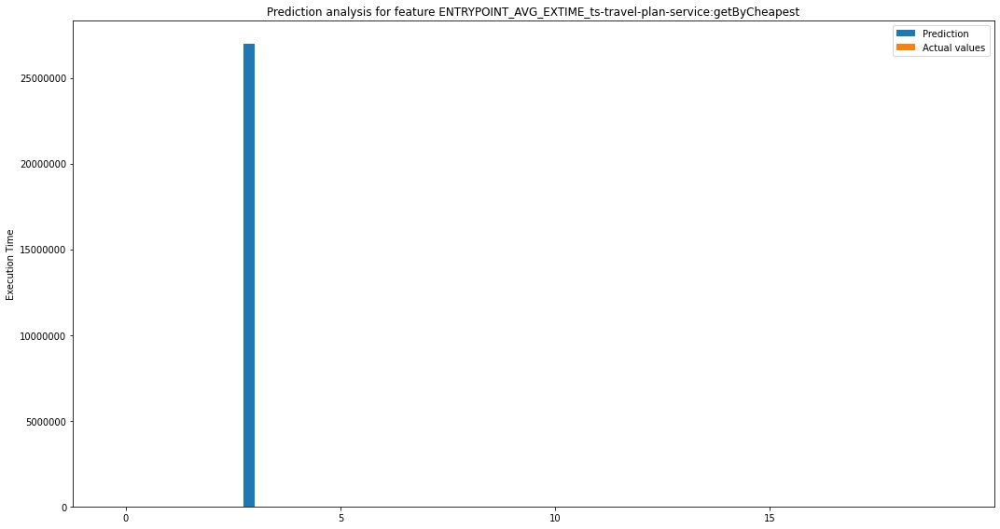

[array([0.]), array([0.]), array([0.]), array([26975425.51]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([0.]), array([0.]), array([0.]), array([7.27673581e+14]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([nan]), array([nan]), array([nan]), array([100.]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan])]
ENTRY ENTRYPOINT_AVG_EXTIME_ts-preserve-service:preserve
PRED [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
VALS [0.0, 0

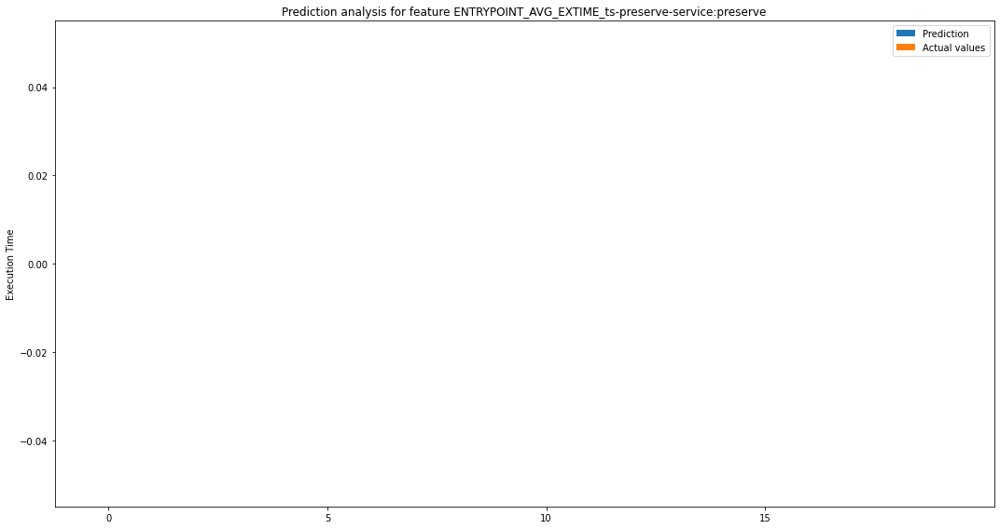

[array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan])]
ENTRY ENTRYPOINT_AVG_EXTIME_ts-contacts-service:findContactsByAccountId
PRED [2642.556413957376, 2564.7556076665605, 2597.219543068328, 2479.5370801296276, 2637.1736529759473, 2589.2895531297263, 2

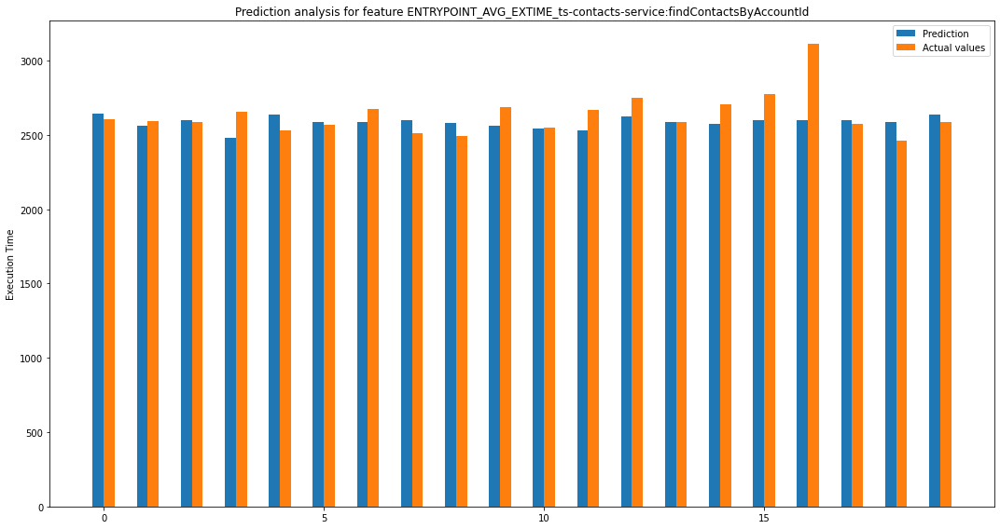

[array([38.30641396]), array([28.11939233]), array([7.46954307]), array([175.26291987]), array([107.17365298]), array([21.28955313]), array([88.42779258]), array([82.63924934]), array([87.6551814]), array([123.77654984]), array([9.24371779]), array([140.50740808]), array([126.18582321]), array([5.98990412]), array([133.7082314]), array([176.5927574]), array([510.93776521]), array([24.49173497]), array([128.57220742]), array([50.85970817])] [array([1467.38135027]), array([790.7002252]), array([55.79407365]), array([30717.09108149]), array([11486.19189221]), array([453.24507246]), array([7819.47450006]), array([6829.24553171]), array([7683.43082604]), array([15320.63429066]), array([85.44631856]), array([19742.33172667]), array([15922.86197887]), array([35.87895137]), array([17877.89114445]), array([31185.00196754]), array([261057.39992177]), array([599.84508167]), array([16530.81252159]), array([2586.70991521])] [array([1.44959683]), array([1.09637707]), array([0.28759768]), array([7.06

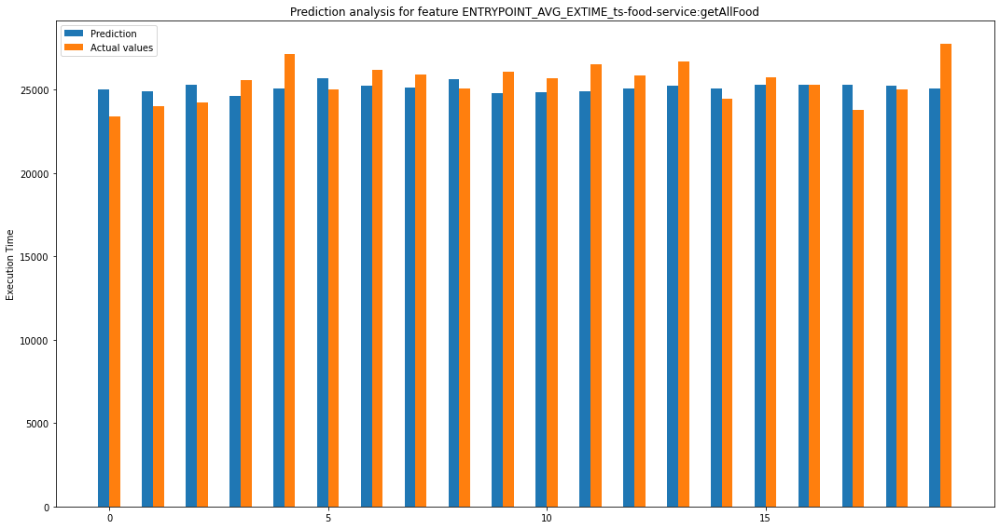

[array([1654.35183309]), array([887.46272229]), array([1067.48002958]), array([938.3128588]), array([2071.19645681]), array([671.09291698]), array([916.35412089]), array([755.97819465]), array([557.51940169]), array([1253.89117481]), array([825.42524723]), array([1645.58135993]), array([765.87503706]), array([1413.8989567]), array([578.01394666]), array([454.58650058]), array([38.4444649]), array([1485.21785097]), array([252.14587911]), array([2667.92212239])] [array([2736879.987645]), array([787590.08346279]), array([1139513.61354334]), array([880431.02099512]), array([4289854.76268348]), array([450365.70321596]), array([839704.87486934]), array([571503.03078805]), array([310827.8832622]), array([1572243.07825438]), array([681326.83876026]), array([2707938.01215475]), array([586564.57238801]), array([1999110.25976286]), array([334100.12253646]), array([206648.88650798]), array([1477.97688111]), array([2205872.06484408]), array([63577.54435291]), array([7117808.45113728])] [array([6.61

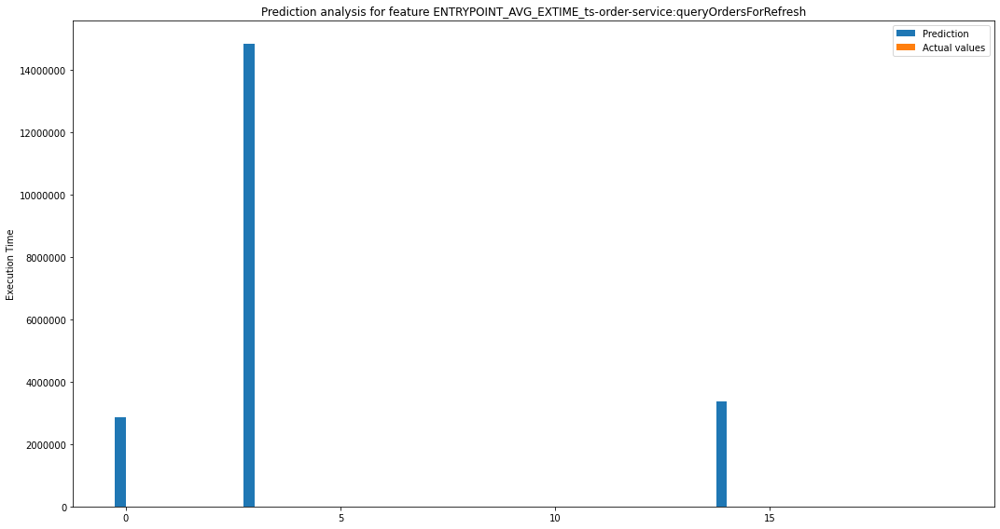

[array([2860213.308]), array([0.]), array([0.]), array([14834804.12]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([3383814.13]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([8.18082017e+12]), array([0.]), array([0.]), array([2.20071413e+14]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([1.14501981e+13]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([100.]), array([nan]), array([nan]), array([100.]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([100.]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan])]
ENTRY ENTRYPOINT_AVG_EXTIME_ts-cancel-service:cancelTicket
PRED [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.

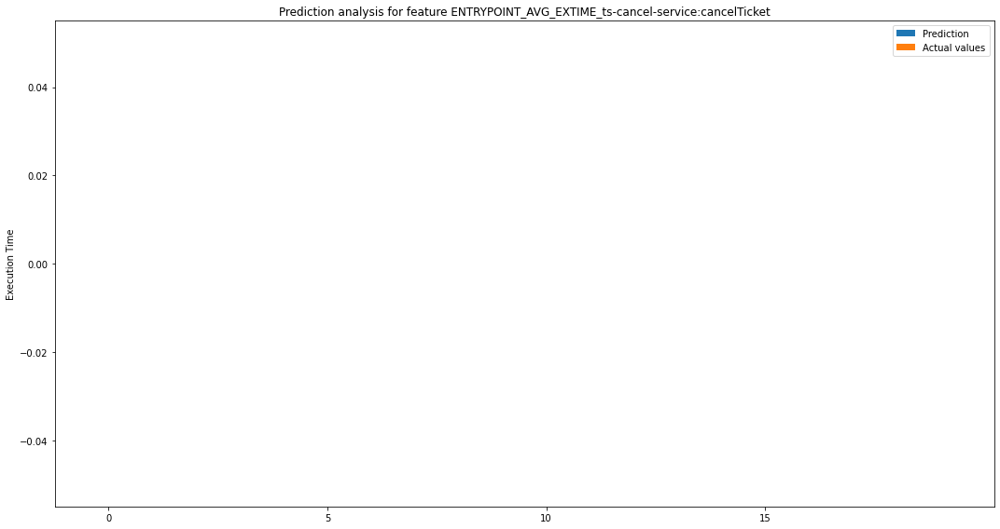

[array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan])]
ENTRY ENTRYPOINT_AVG_EXTIME_ts-inside-payment-service:pay
PRED [9799.050000000001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
VALS [0.0, 0.0, 0.0

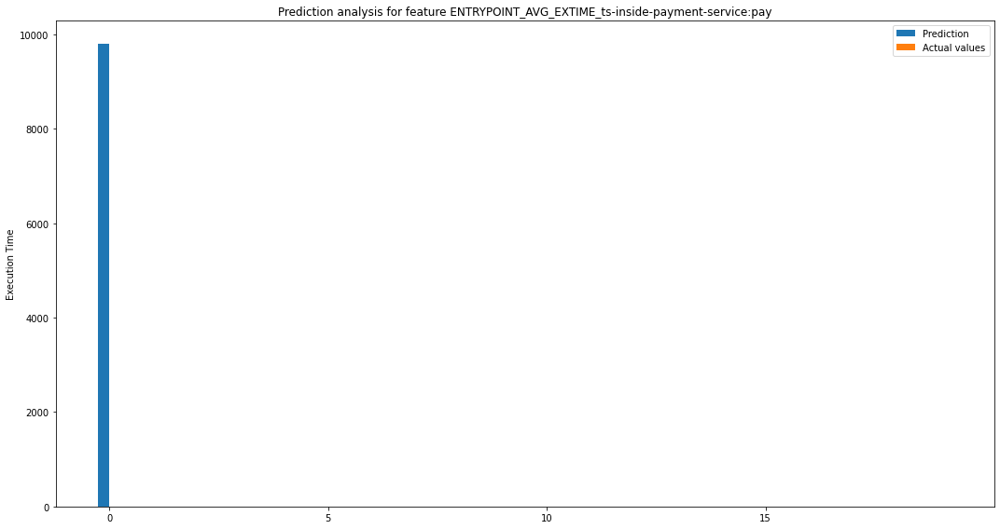

[array([9799.05]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([96021380.90250002]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([100.]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan])]
ENTRY ENTRYPOINT_AVG_EXTIME_ts-travel-service:queryInfo
PRED [1196119.6358626932, 21963.27051214517, 21813.307348550203, 18133.880568530134, 22444.37599874607, 22979.5080196001

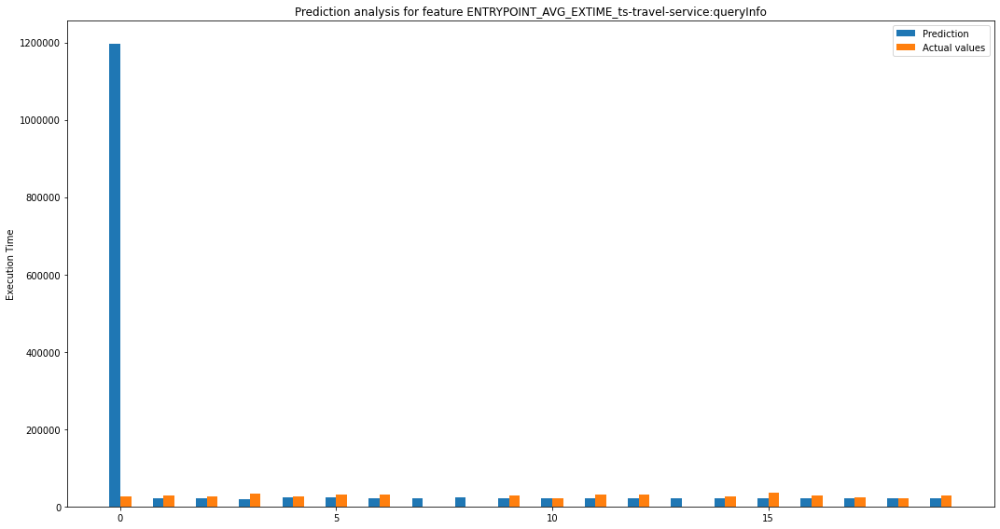

[array([1170673.88586269]), array([7396.72948785]), array([4043.35931812]), array([15818.51943147]), array([3251.62400125]), array([7534.4919804]), array([9448.5894699]), array([20913.15567127]), array([22595.42963991]), array([6875.13453291]), array([1564.87770856]), array([10437.20149675]), array([7793.41043523]), array([20759.52238167]), array([3818.41694958]), array([12990.91097899]), array([5753.98143382]), array([1418.19272202]), array([195.4105301]), array([6670.55263762])] [array([1.37047735e+12]), array([54711607.11650119]), array([16348754.57539925]), array([2.50225557e+08]), array([10573058.64553062]), array([56768569.40270936]), array([89275842.97070141]), array([4.3736008e+08]), array([5.10553441e+08]), array([47267474.84555674]), array([2448842.24274668]), array([1.08935175e+08]), array([60737246.21199135]), array([4.3095777e+08]), array([14580308.00080195]), array([1.68763768e+08]), array([33108302.34079284]), array([2011270.59678648]), array([38185.27527404]), array([44

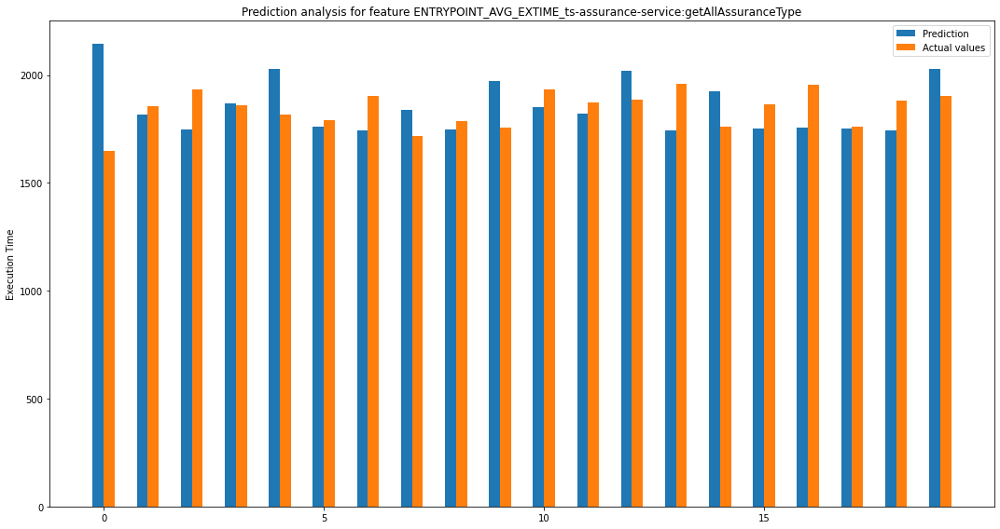

[array([496.69069865]), array([38.87993089]), array([182.52687677]), array([6.84370448]), array([209.99560436]), array([31.17518713]), array([160.11687724]), array([122.34279078]), array([38.33505327]), array([214.44046673]), array([78.79367538]), array([53.01607591]), array([134.28869604]), array([215.17984746]), array([161.34382375]), array([110.01827208]), array([197.96953011]), array([7.21045445]), array([135.11687724]), array([125.61348856])] [array([246701.65012432]), array([1511.64902577]), array([33316.06074249]), array([46.83629104]), array([44098.15384922]), array([971.89229238]), array([25637.41437732]), array([14967.75845526]), array([1469.57630902]), array([45984.71377227]), array([6208.44328058]), array([2810.70430463]), array([18033.4538828]), array([46302.36675409]), array([26031.82946322]), array([12104.02019191]), array([39191.93485333]), array([51.99065332]), array([18256.57051528]), array([15778.74850721])] [array([23.16718457]), array([2.14111855]), array([10.43175

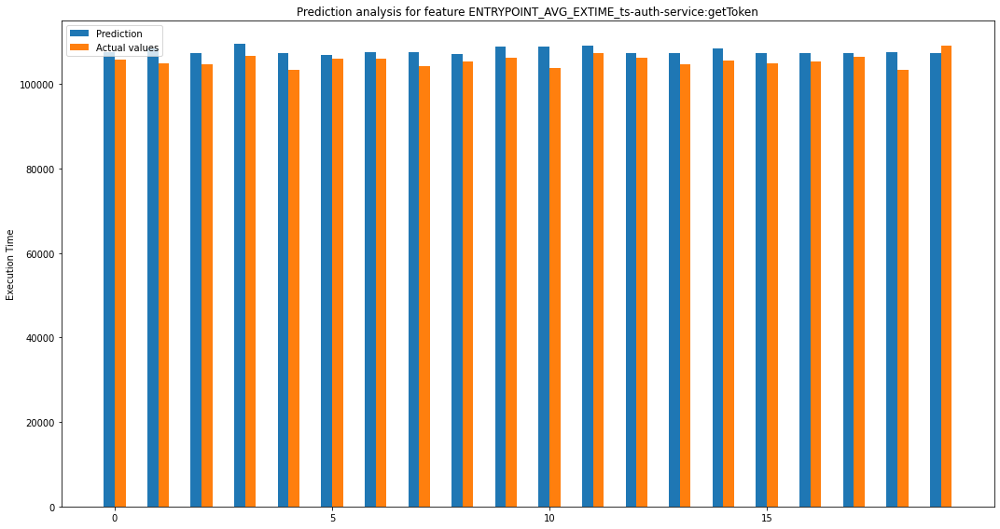

[array([1600.5676207]), array([3583.14931079]), array([2758.89202355]), array([2894.99437203]), array([3835.77786494]), array([1062.79890116]), array([1391.79262925]), array([3174.98894627]), array([1910.72791793]), array([2625.73769011]), array([5234.1278097]), array([1676.17631332]), array([1271.95951316]), array([2608.57129538]), array([2964.32936177]), array([2464.09220421]), array([1934.13565013]), array([817.6950466]), array([4107.99262925]), array([1817.50685909])] [array([2561816.70844129]), array([12838958.98344031]), array([7611485.19760692]), array([8380992.41409536]), array([14713191.82915573]), array([1129541.50429991]), array([1937086.72283509]), array([10080554.80894838]), array([3650881.1763562]), array([6894498.41727837]), array([27396093.92830618]), array([2809567.03334347]), array([1617881.00312946]), array([6804644.20305511]), array([8787248.56502212]), array([6071750.39086857]), array([3740880.71309154]), array([668625.18923996]), array([16875603.44197366]), array(

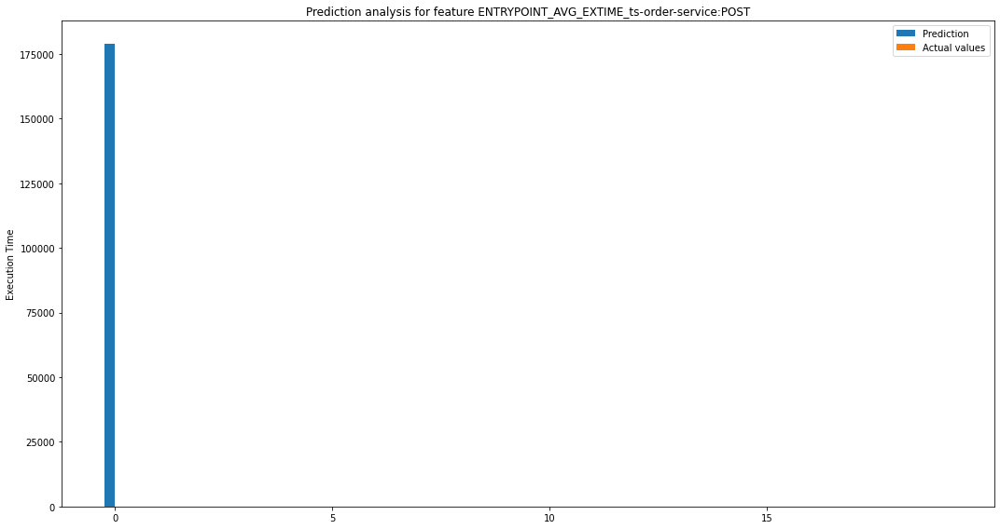

[array([178852.14]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([3.1988088e+10]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.]), array([0.])] [array([100.]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan]), array([nan])]
ERRORS [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0] [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  return abs((true-pred)/true) * 100
/home/dimenna/AVV/git/obstack/notebooks/env/lib/python3.9/site-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: invalid value encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/88310780

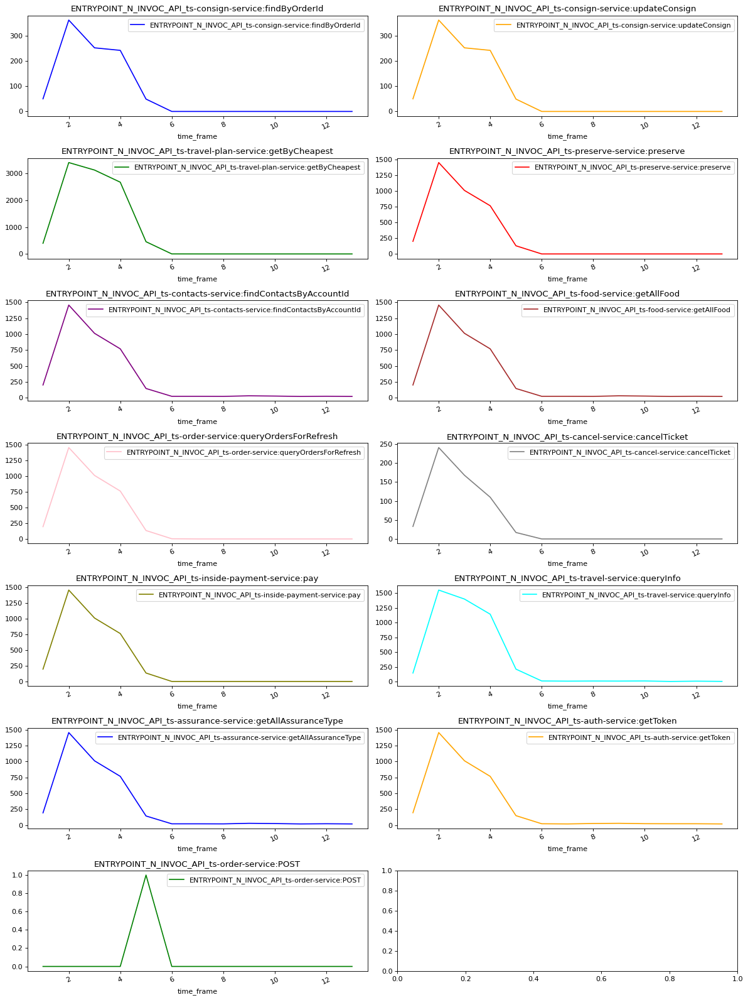

Data normalized
Input size 45 Output size 13
TOTAL MSE:  0.01810158042007519
TOTAL MAE:  0.08236119487881233
TOTAL MAPE:  0.79
FIRST 50 predictions
ENTRY ENTRYPOINT_AVG_EXTIME_ts-consign-service:findByOrderId
PRED [58.16816326530612, 58.16816326530612, 58.16816326530612, 58.16816326530612, 58.16816326530612]
VALS [0.0, 0.0, 0.0, 0.0, 0.0]


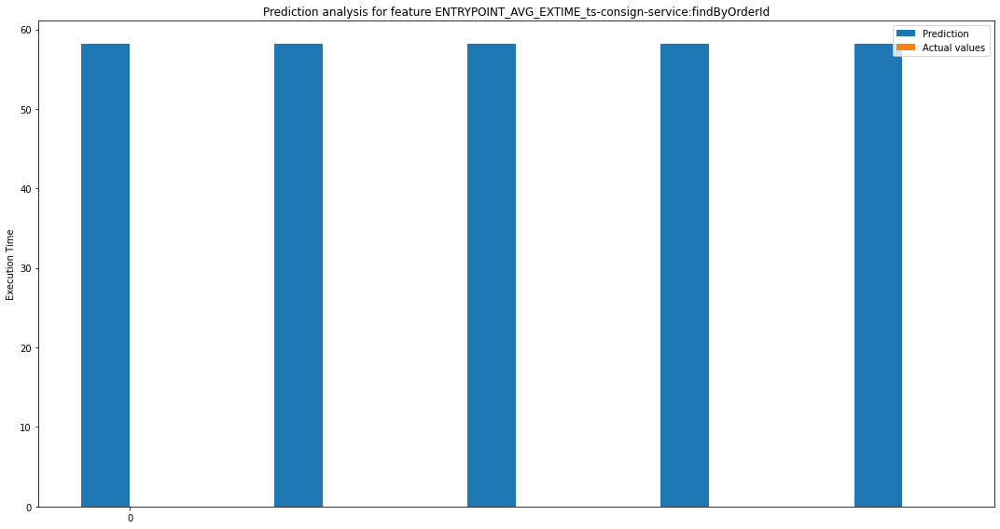

[array([58.16816327]), array([58.16816327]), array([58.16816327]), array([58.16816327]), array([58.16816327])] [array([3383.53521766]), array([3383.53521766]), array([3383.53521766]), array([3383.53521766]), array([3383.53521766])] [array([100.]), array([100.]), array([100.]), array([100.]), array([100.])]
ENTRY ENTRYPOINT_AVG_EXTIME_ts-consign-service:updateConsign
PRED [172.98816326530613, 172.98816326530613, 172.98816326530613, 172.98816326530613, 172.98816326530613]
VALS [0.0, 0.0, 0.0, 0.0, 0.0]


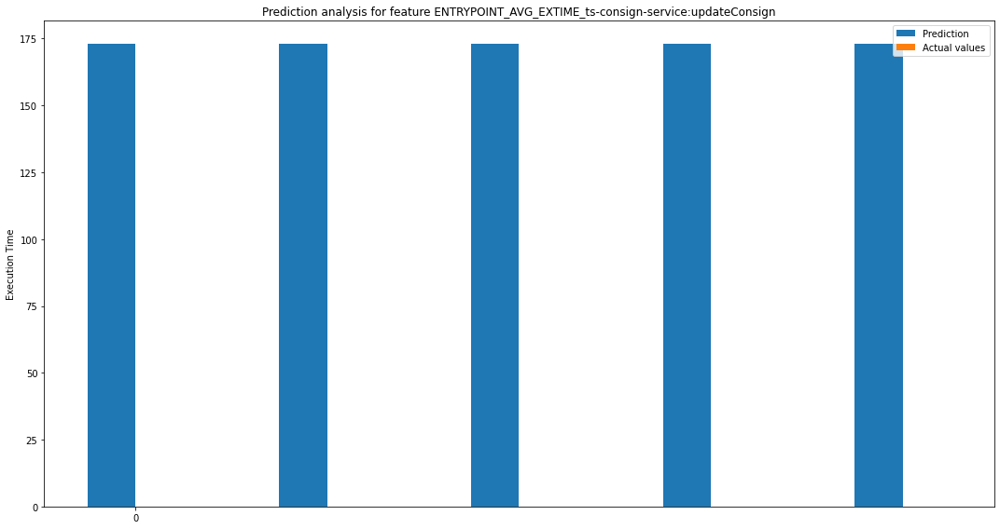

[array([172.98816327]), array([172.98816327]), array([172.98816327]), array([172.98816327]), array([172.98816327])] [array([29924.9046299]), array([29924.9046299]), array([29924.9046299]), array([29924.9046299]), array([29924.9046299])] [array([100.]), array([100.]), array([100.]), array([100.]), array([100.])]
ENTRY ENTRYPOINT_AVG_EXTIME_ts-travel-plan-service:getByCheapest
PRED [56485576.89846491, 76104068.17846492, 66294822.538464904, 73651756.76846491, 66294822.538464904]
VALS [0.0, 0.0, 0.0, 0.0, 0.0]


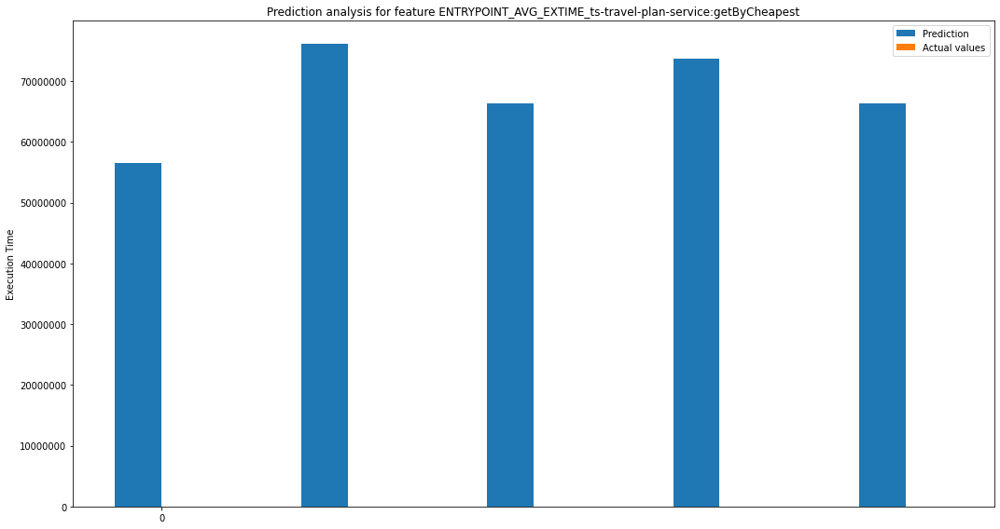

[array([56485576.89846491]), array([76104068.17846492]), array([66294822.5384649]), array([73651756.76846491]), array([66294822.5384649])] [array([3.1906204e+15]), array([5.79182919e+15]), array([4.3950035e+15]), array([5.42458128e+15]), array([4.3950035e+15])] [array([100.]), array([100.]), array([100.]), array([100.]), array([100.])]
ENTRY ENTRYPOINT_AVG_EXTIME_ts-preserve-service:preserve
PRED [610933.9406153846, 610933.9406153846, 610933.9406153846, 610933.9406153846, 610933.9406153846]
VALS [0.0, 0.0, 0.0, 0.0, 0.0]


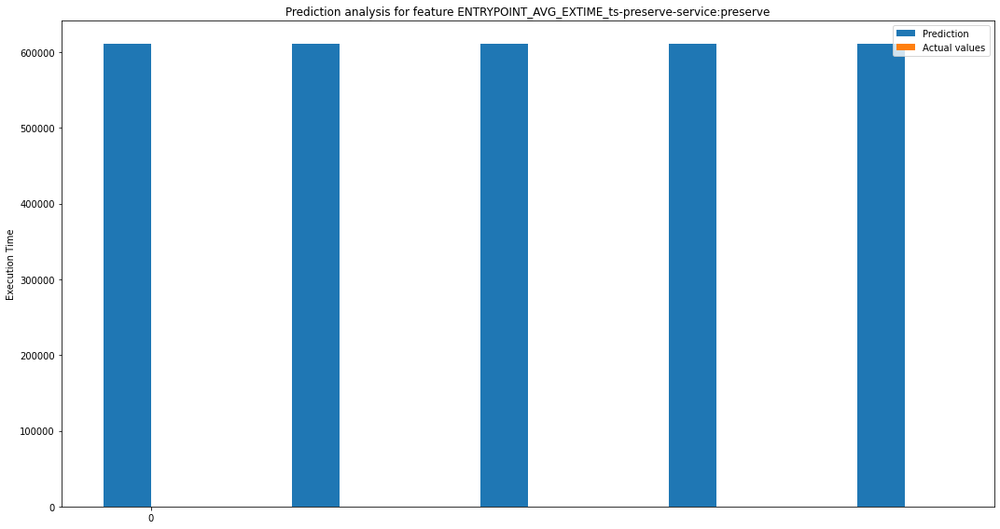

[array([610933.94061538]), array([610933.94061538]), array([610933.94061538]), array([610933.94061538]), array([610933.94061538])] [array([3.7324028e+11]), array([3.7324028e+11]), array([3.7324028e+11]), array([3.7324028e+11]), array([3.7324028e+11])] [array([100.]), array([100.]), array([100.]), array([100.]), array([100.])]
ENTRY ENTRYPOINT_AVG_EXTIME_ts-contacts-service:findContactsByAccountId
PRED [2622.803307210031, 2602.87434617107, 2615.9181124048364, 2580.9877877295116, 2615.9181124048364]
VALS [2576.9666666666667, 2588.3846153846152, 2554.0, 2681.608695652174, 2728.0]


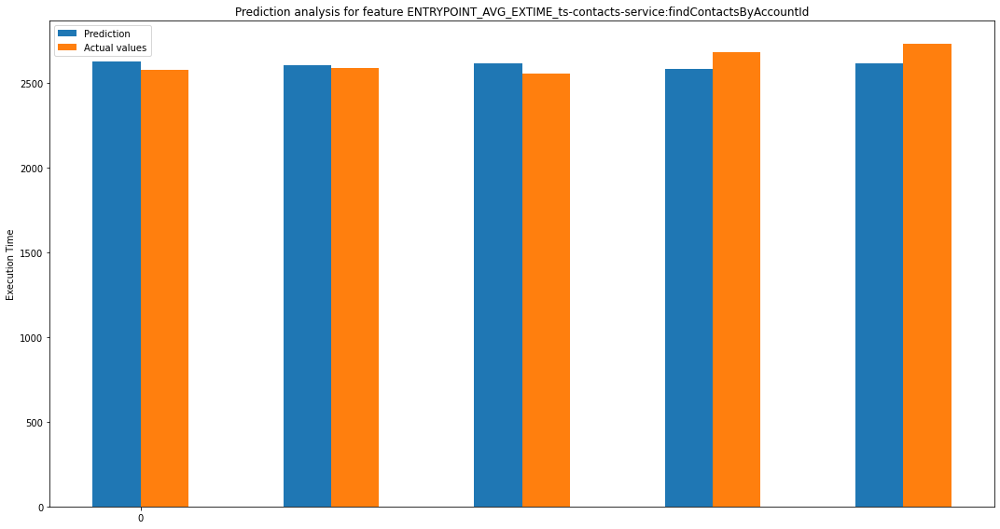

[array([45.83664054]), array([14.48973079]), array([61.9181124]), array([100.62090792]), array([112.0818876])] [array([2100.9976163]), array([209.95229826]), array([3833.85264378]), array([10124.56711118]), array([12562.34952689])] [array([1.74762021]), array([0.55668192]), array([2.36697441]), array([3.89854258]), array([4.28460994])]
ENTRY ENTRYPOINT_AVG_EXTIME_ts-food-service:getAllFood
PRED [24944.213442006265, 24766.613312136134, 24856.88590953873, 24777.155779668603, 24856.88590953873]
VALS [24969.4, 25105.346153846152, 25717.65, 25837.17391304348, 25549.9]


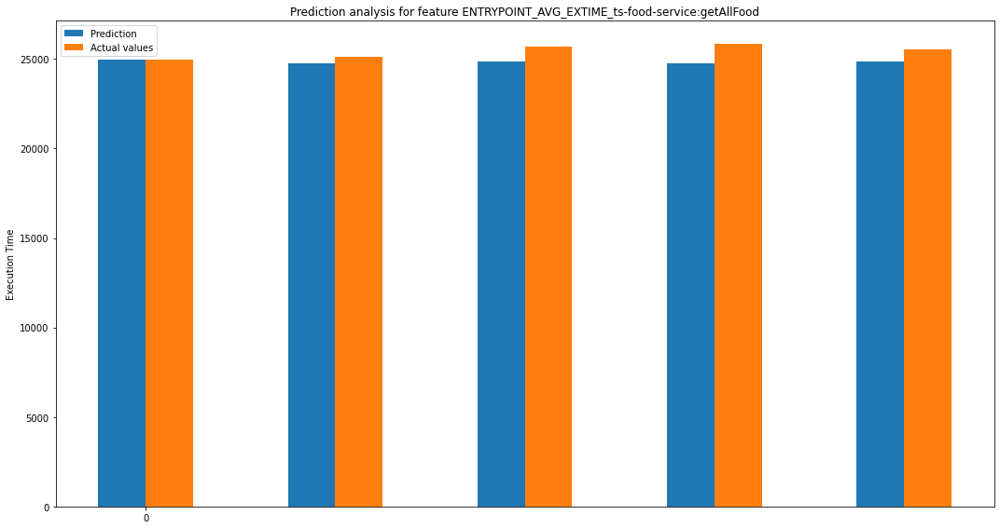

[array([25.18655799]), array([338.73284171]), array([860.76409046]), array([1060.01813337]), array([693.01409046])] [array([634.36270357]), array([114739.93805294]), array([740914.81942762]), array([1123638.44308356]), array([480268.52957786])] [array([0.10097155]), array([1.36769948]), array([3.46287984]), array([4.27820749]), array([2.78801654])]
ENTRY ENTRYPOINT_AVG_EXTIME_ts-order-service:queryOrdersForRefresh
PRED [60469904.276069656, 81292910.5427363, 70881407.40940298, 78690034.75940299, 70881407.40940298]
VALS [0.0, 0.0, 0.0, 0.0, 0.0]


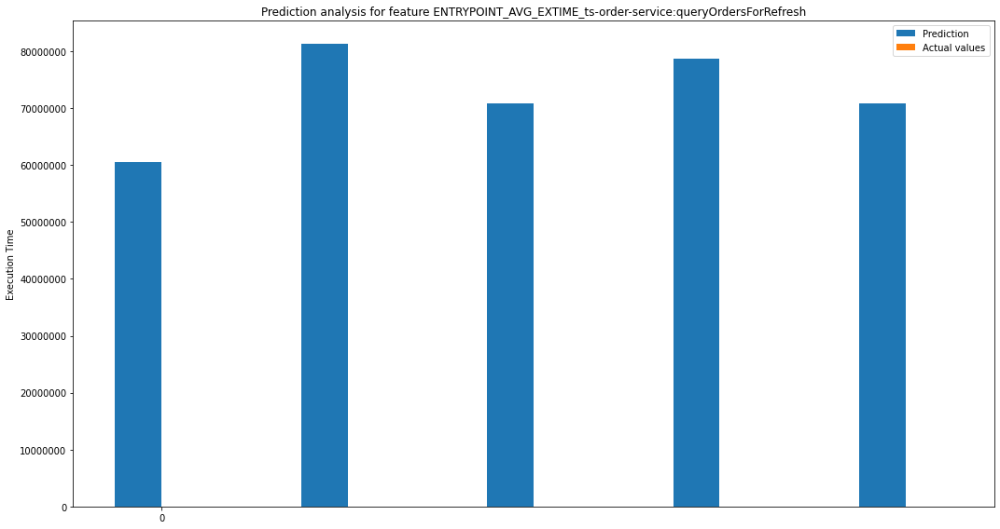

[array([60469904.27606966]), array([81292910.5427363]), array([70881407.40940298]), array([78690034.75940299]), array([70881407.40940298])] [array([3.65660932e+15]), array([6.6085373e+15]), array([5.02417392e+15]), array([6.19212157e+15]), array([5.02417392e+15])] [array([100.]), array([100.]), array([100.]), array([100.]), array([100.])]
ENTRY ENTRYPOINT_AVG_EXTIME_ts-cancel-service:cancelTicket
PRED [409.1411764705883, 409.1411764705883, 409.1411764705883, 409.1411764705883, 409.1411764705883]
VALS [0.0, 0.0, 0.0, 0.0, 0.0]


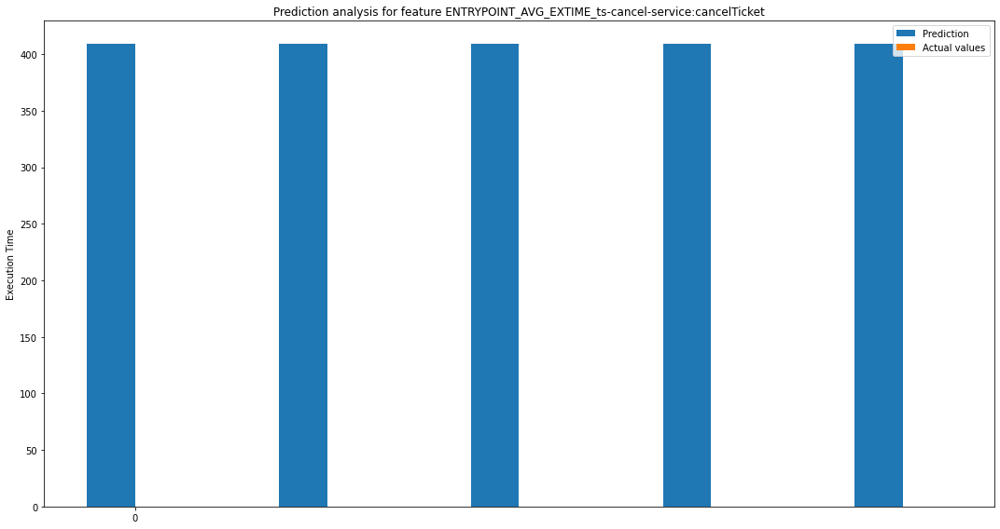

[array([409.14117647]), array([409.14117647]), array([409.14117647]), array([409.14117647]), array([409.14117647])] [array([167396.50228374]), array([167396.50228374]), array([167396.50228374]), array([167396.50228374]), array([167396.50228374])] [array([100.]), array([100.]), array([100.]), array([100.]), array([100.])]
ENTRY ENTRYPOINT_AVG_EXTIME_ts-inside-payment-service:pay
PRED [1416.0255223880597, 1416.0255223880597, 1416.0255223880597, 1416.0255223880597, 1416.0255223880597]
VALS [0.0, 0.0, 0.0, 0.0, 0.0]


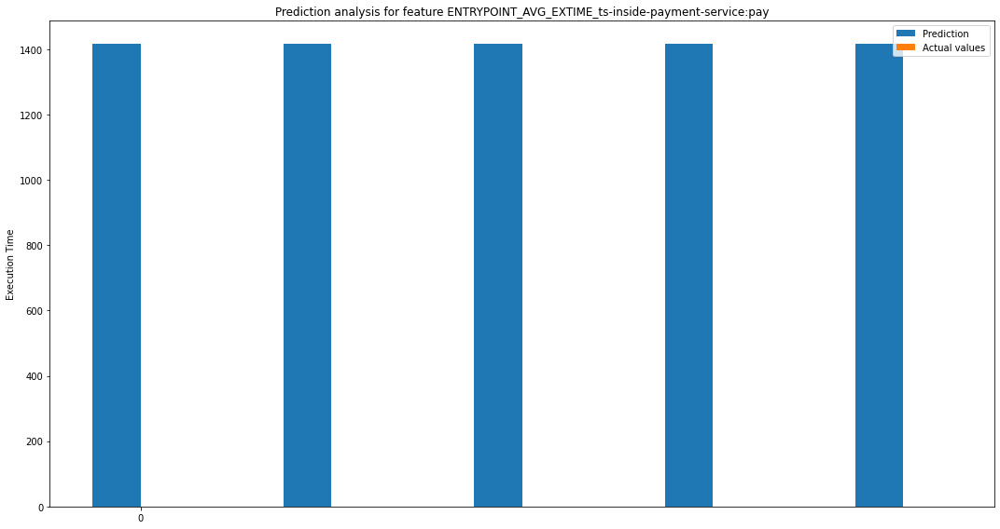

[array([1416.02552239]), array([1416.02552239]), array([1416.02552239]), array([1416.02552239]), array([1416.02552239])] [array([2005128.28005438]), array([2005128.28005438]), array([2005128.28005438]), array([2005128.28005438]), array([2005128.28005438])] [array([100.]), array([100.]), array([100.]), array([100.]), array([100.])]
ENTRY ENTRYPOINT_AVG_EXTIME_ts-travel-service:queryInfo
PRED [161238.81013524745, 160823.0864044782, 160994.39251986283, 161164.45155832433, 160994.39251986283]
VALS [26427.90909090909, 29842.92307692308, 27230.2, 27668.2, 25188.666666666668]


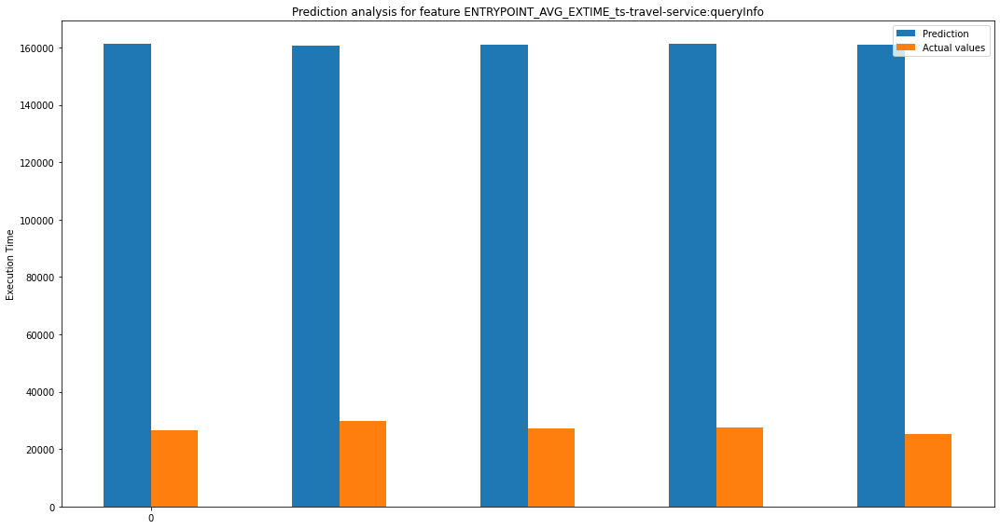

[array([134810.90104434]), array([130980.16332756]), array([133764.19251986]), array([133496.25155832]), array([135805.7258532])] [array([1.8173979e+10]), array([1.71558032e+10]), array([1.78928592e+10]), array([1.78212492e+10]), array([1.84431952e+10])] [array([83.6094616]), array([81.44363241]), array([83.08624321]), array([82.83231834]), array([84.3543205])]
ENTRY ENTRYPOINT_AVG_EXTIME_ts-assurance-service:getAllAssuranceType
PRED [1852.3131598746077, 1835.1766014330494, 1849.3109520824, 1793.253939095387, 1849.3109520824]
VALS [1806.9666666666667, 1851.0, 1818.25, 1867.3478260869565, 1872.75]


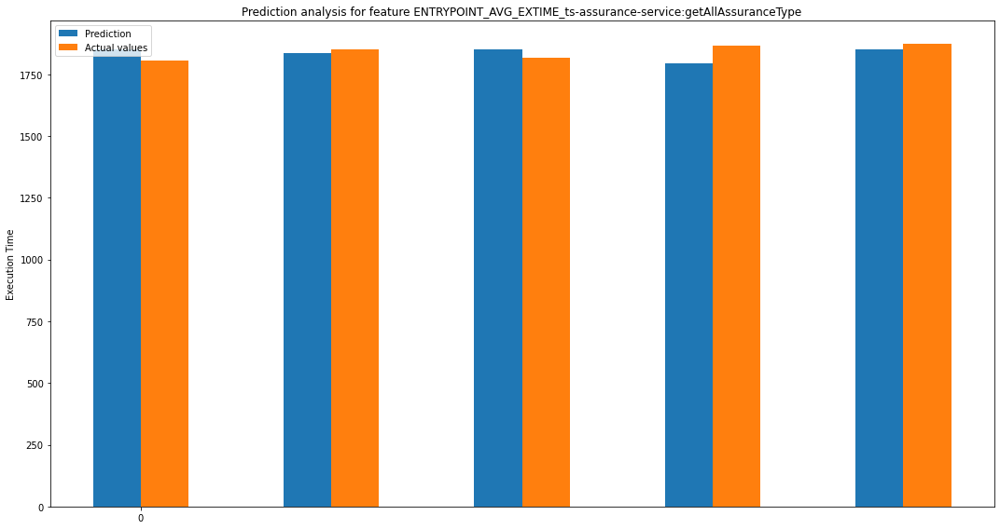

[array([45.34649321]), array([15.82339857]), array([31.06095208]), array([74.09388699]), array([23.43904792])] [array([2056.30444626]), array([250.37994221]), array([964.78274427]), array([5489.90408952]), array([549.38896728])] [array([2.4481008]), array([0.86222757]), array([1.67959596]), array([4.13181231]), array([1.26744763])]
ENTRY ENTRYPOINT_AVG_EXTIME_ts-auth-service:getToken
PRED [109170.06324444445, 109586.78857294687, 109335.15407536233, 109877.26658743962, 109335.15407536233]
VALS [106382.53333333334, 105333.54166666669, 105307.43478260867, 105588.56521739133, 106195.25]


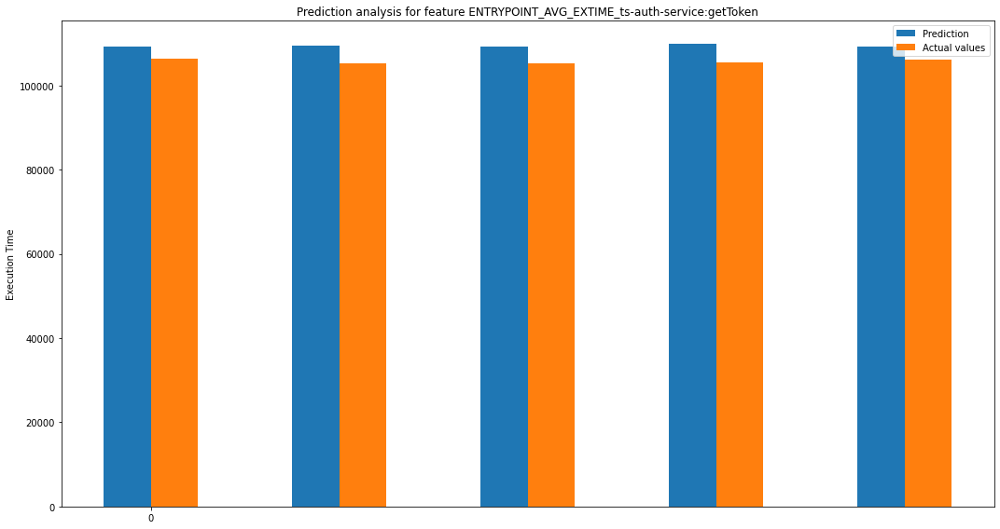

[array([2787.52991111]), array([4253.24690628]), array([4027.71929275]), array([4288.70137005]), array([3139.90407536])] [array([7770323.00533911]), array([18090109.24578195]), array([16222522.70121998]), array([18392959.44145411]), array([9858997.60247695])] [array([2.55338307]), array([3.88116758]), array([3.68382825]), array([3.90317443]), array([2.87181566])]
ENTRY ENTRYPOINT_AVG_EXTIME_ts-order-service:POST
PRED [357704.28, 357704.28, 357704.28, 357704.28, 357704.28]
VALS [0.0, 0.0, 0.0, 0.0, 0.0]


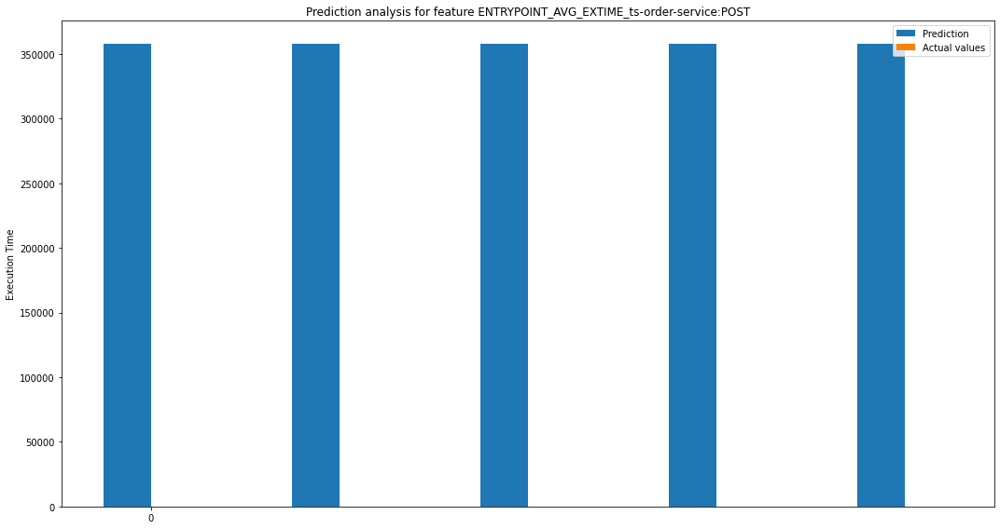

[array([357704.28]), array([357704.28]), array([357704.28]), array([357704.28]), array([357704.28])] [array([1.27952352e+11]), array([1.27952352e+11]), array([1.27952352e+11]), array([1.27952352e+11]), array([1.27952352e+11])] [array([100.]), array([100.]), array([100.]), array([100.]), array([100.])]
ERRORS [58.16816326530612, 58.16816326530612, 58.16816326530612, 58.16816326530612, 58.16816326530612] [3383.5352176593083, 3383.5352176593083, 3383.5352176593083, 3383.5352176593083, 3383.5352176593083] [inf, inf, inf, inf, inf]
0.25 Quartile (MAE: 58.168163, MSE: 3383.535218, MAPE: nan)
0.50 Quartile (MAE: 58.168163, MSE: 3383.535218, MAPE: nan)
0.75 Quartile (MAE: 58.168163, MSE: 3383.535218, MAPE: nan)
ERRORS [172.98816326530613, 172.98816326530613, 172.98816326530613, 172.98816326530613, 172.98816326530613] [29924.90462990421, 29924.90462990421, 29924.90462990421, 29924.90462990421, 29924.90462990421] [inf, inf, inf, inf, inf]
0.25 Quartile (MAE: 172.988163, MSE: 29924.904630, MAPE: 

/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  return abs((true-pred)/true) * 100
/home/dimenna/AVV/git/obstack/notebooks/env/lib/python3.9/site-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  return abs((true-pred)/true) * 100
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  return abs((true-pred)/true) * 100
/home/dimenna/AVV/git/obstack/notebooks/env/lib/python3.9/site-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/tmp/ipykernel_6160/883107803.py:5: RuntimeWarning: divide by zero encountered in true_divide
  

In [9]:
%%time

results[50] = MachineLearningAnalyzer("avv_dataset_DT_50.csv").perform_analysis()
results[100] = MachineLearningAnalyzer("avv_dataset_DT_100.csv").perform_analysis()
results[500] = MachineLearningAnalyzer("avv_dataset_DT_500.csv").perform_analysis()
results[1000] = MachineLearningAnalyzer("avv_dataset_DT_1000.csv").perform_analysis()
results[5000] = MachineLearningAnalyzer("avv_dataset_DT_5000.csv").perform_analysis()
results[10000] = MachineLearningAnalyzer("avv_dataset_DT_10000.csv").perform_analysis()
results[60000] = MachineLearningAnalyzer("avv_dataset_DT_60000.csv").perform_analysis()
results[300000] = MachineLearningAnalyzer("avv_dataset_DT_300000.csv").perform_analysis()

In [10]:
res_df = pd.DataFrame.from_dict(results, orient="index").sort_index()

res_df

,TOTAL MSE,TOTAL MAE,TOTAL MAPE,ENTRYPOINT_AVG_EXTIME_ts-consign-service:findByOrderId MAPE Min,ENTRYPOINT_AVG_EXTIME_ts-consign-service:findByOrderId MAPE Max,ENTRYPOINT_AVG_EXTIME_ts-consign-service:findByOrderId MAPE Mean,ENTRYPOINT_AVG_EXTIME_ts-consign-service:findByOrderId MAE Min,ENTRYPOINT_AVG_EXTIME_ts-consign-service:findByOrderId MSE Min,ENTRYPOINT_AVG_EXTIME_ts-consign-service:findByOrderId MAE Max,ENTRYPOINT_AVG_EXTIME_ts-consign-service:findByOrderId MSE Max,...,ENTRYPOINT_AVG_EXTIME_ts-auth-service:getToken MSE Mean,ENTRYPOINT_AVG_EXTIME_ts-order-service:POST MAPE Min,ENTRYPOINT_AVG_EXTIME_ts-order-service:POST MAPE Max,ENTRYPOINT_AVG_EXTIME_ts-order-service:POST MAPE Mean,ENTRYPOINT_AVG_EXTIME_ts-order-service:POST MAE Min,ENTRYPOINT_AVG_EXTIME_ts-order-service:POST MSE Min,ENTRYPOINT_AVG_EXTIME_ts-order-service:POST MAE Max,ENTRYPOINT_AVG_EXTIME_ts-order-service:POST MSE Max,ENTRYPOINT_AVG_EXTIME_ts-order-service:POST MAE Mean,ENTRYPOINT_AVG_EXTIME_ts-order-service:POST MSE Mean
50,0.000351,0.002877,5.069224e+10,0.363541,inf,1.29,0.000000,0.000000,6944.976565,4.823270e+07,...,4.461730e+06,100.0,100.0,1.178634e+19,0.00,0.000000e+00,17885214.00,3.198809e+14,2617.093064,4.680727e+10
100,0.000607,0.004417,9.663340e+10,0.093084,inf,1.31,0.000000,0.000000,7067.220296,4.994560e+07,...,8.007712e+06,100.0,100.0,2.246802e+19,0.00,0.000000e+00,17885214.00,3.198809e+14,4988.902092,8.922758e+10
500,0.002178,0.013129,4.051822e+11,0.795365,inf,0.16,0.000000,0.000000,7384.535108,5.453136e+07,...,2.626218e+07,100.0,100.0,9.420800e+19,0.00,0.000000e+00,17885214.00,3.198809e+14,20918.378947,3.741297e+11
1000,0.005779,0.028805,6.998601e+11,7.689469,inf,0.13,0.000000,0.000000,985.015403,9.702553e+05,...,3.862946e+07,100.0,100.0,1.627229e+20,0.00,0.000000e+00,17885214.00,3.198809e+14,36131.745455,6.462240e+11
5000,0.000878,0.010726,3.500000e-01,-1.000000,-1.0,-1.00,0.000000,0.000000,0.000000,0.000000e+00,...,2.372962e+07,inf,inf,3.000000e-02,0.00,0.000000e+00,59617.38,3.554232e+09,1406.070283,7.963492e+07
10000,0.000870,0.010367,1.260000e+00,-1.000000,-1.0,-1.00,0.000000,0.000000,0.000000,0.000000e+00,...,1.804572e+07,-1.0,-1.0,-1.000000e+00,0.00,0.000000e+00,0.00,0.000000e+00,0.000000,0.000000e+00
60000,0.004583,0.030696,1.500000e-01,-1.000000,-1.0,-1.00,0.000000,0.000000,0.000000,0.000000e+00,...,7.393732e+06,inf,inf,5.000000e-02,0.00,0.000000e+00,178852.14,3.198809e+10,8942.607000,1.599404e+09
300000,0.018102,0.082361,7.900000e-01,inf,inf,1.00,58.168163,3383.535218,58.168163,3.383535e+03,...,1.406698e+07,inf,inf,1.000000e+00,357704.28,1.279524e+11,357704.28,1.279524e+11,357704.280000,1.279524e+11


In [11]:
dict_doc = []

for key in [key for key in res_df.keys() if "ENTRYPOINT_AVG_EXTIME" in key and "MAPE" in key]:
    vals = {
        "entrypoint": key.lstrip("ENTRYPOINT_AVG_EXTIME").replace("MAPE","")
    }
    print(key)
    print(key.lstrip("ENTRYPOINT_AVG_EXTIME"))
    for idx, row in res_df[key].items():
        vals[idx] = str(round(row * 100, 2)) + "%"
        # dict_doc.append({
        #     "Entrypoint": key.lstrip("ENTRYPOINT_AVG_EXTIME").replace("MAPE",""),
        #     "Delta Time": idx,
        #     "Mape": str(round(row * 100, 5)) + "%"
        # })
        print(idx, ":", round(row * 100, 5), "%")
    dict_doc.append(vals)
        
pd.DataFrame().from_records(dict_doc)

ENTRYPOINT_AVG_EXTIME_ts-consign-service:findByOrderId MAPE Min
ts-consign-service:findByOrderId MAPE Min
50 : 36.35406 %
100 : 9.30841 %
500 : 79.53647 %
1000 : 768.94693 %
5000 : -100.0 %
10000 : -100.0 %
60000 : -100.0 %
300000 : inf %
ENTRYPOINT_AVG_EXTIME_ts-consign-service:findByOrderId MAPE Max
ts-consign-service:findByOrderId MAPE Max
50 : inf %
100 : inf %
500 : inf %
1000 : inf %
5000 : -100.0 %
10000 : -100.0 %
60000 : -100.0 %
300000 : inf %
ENTRYPOINT_AVG_EXTIME_ts-consign-service:findByOrderId MAPE Mean
ts-consign-service:findByOrderId MAPE Mean
50 : 129.0 %
100 : 131.0 %
500 : 16.0 %
1000 : 13.0 %
5000 : -100.0 %
10000 : -100.0 %
60000 : -100.0 %
300000 : 100.0 %
ENTRYPOINT_AVG_EXTIME_ts-consign-service:updateConsign MAPE Min
ts-consign-service:updateConsign MAPE Min
50 : 120.50947 %
100 : 84.36493 %
500 : 137.13576 %
1000 : 217.33209 %
5000 : -100.0 %
10000 : -100.0 %
60000 : -100.0 %
300000 : inf %
ENTRYPOINT_AVG_EXTIME_ts-consign-service:updateConsign MAPE Max
ts-cons

,entrypoint,50,100,500,1000,5000,10000,60000,300000
0,ts-consign-service:findByOrderId Min,36.35%,9.31%,79.54%,768.95%,-100.0%,-100.0%,-100.0%,inf%
1,ts-consign-service:findByOrderId Max,inf%,inf%,inf%,inf%,-100.0%,-100.0%,-100.0%,inf%
2,ts-consign-service:findByOrderId Mean,129.0%,131.0%,16.0%,13.0%,-100.0%,-100.0%,-100.0%,100.0%
3,ts-consign-service:updateConsign Min,120.51%,84.36%,137.14%,217.33%,-100.0%,-100.0%,-100.0%,inf%
4,ts-consign-service:updateConsign Max,inf%,8355.24%,inf%,1563.78%,-100.0%,-100.0%,-100.0%,inf%
5,ts-consign-service:updateConsign Mean,1.0%,2.0%,2.0%,0.0%,-100.0%,-100.0%,-100.0%,100.0%
6,ts-travel-plan-service:getByCheapest Min,72.11%,18.5%,6.88%,1740.78%,inf%,inf%,inf%,inf%
7,ts-travel-plan-service:getByCheapest Max,inf%,inf%,inf%,inf%,inf%,inf%,inf%,inf%
8,ts-travel-plan-service:getByCheapest Mean,491.0%,532.0%,994.0%,306.0%,92.0%,57.0%,5.0%,100.0%
9,ts-preserve-service:preserve Min,1834.52%,1381.22%,112.77%,4557.08%,inf%,inf%,-100.0%,inf%


In [12]:
dict_doc = []

print("MAE")
for key in [key for key in res_df.keys() if "ENTRYPOINT_AVG_EXTIME" in key and "MAE" in key]:
    vals = {
        "entrypoint": key.lstrip("ENTRYPOINT_AVG_EXTIME").replace("MAE","")
    }
    
    for idx, row in res_df[key].items():
        vals[idx] = str(round(row * 100, 2))
    dict_doc.append(vals)
        
pd.DataFrame().from_records(dict_doc)

MAE


,entrypoint,50,100,500,1000,5000,10000,60000,300000
0,ts-consign-service:findByOrderId Min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5816.82
1,ts-consign-service:findByOrderId Max,694497.66,706722.03,738453.51,98501.54,0.0,0.0,0.0,5816.82
2,ts-consign-service:findByOrderId Mean,7331.58,9512.5,7453.03,764.0,0.0,0.0,0.0,5816.82
3,ts-consign-service:updateConsign Min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,17298.82
4,ts-consign-service:updateConsign Max,906343.78,922594.04,495299.24,151731.49,0.0,0.0,0.0,17298.82
5,ts-consign-service:updateConsign Mean,10818.64,17853.42,22064.88,1259.0,0.0,0.0,0.0,17298.82
6,ts-travel-plan-service:getByCheapest Min,58695.14,23503.52,15147.63,17808975.41,0.0,0.0,0.0,5648557689.85
7,ts-travel-plan-service:getByCheapest Max,53258141795.14,53253540603.52,53244601562.84,53138575193.21,2309089271.62,7375980458.92,2697542551.0,7610406817.85
8,ts-travel-plan-service:getByCheapest Mean,39669578.73,67150926.05,219485184.68,482327218.47,166734883.05,503923373.4,134877127.55,6776620938.45
9,ts-preserve-service:preserve Min,621151.22,457673.16,281309.36,0.0,0.0,0.0,0.0,61093394.06


In [13]:
dict_doc = []

print("MAPE")
for key in [key for key in res_df.keys() if "ENTRYPOINT_AVG_EXTIME" in key and "MAPE" in key]:
    vals = {
        "entrypoint": key.lstrip("ENTRYPOINT_AVG_EXTIME").replace("MAPE","")
    }
    
    for idx, row in res_df[key].items():
        vals[idx] = str(round(row * 100, 2)) + " %"
    dict_doc.append(vals)
        
pd.DataFrame().from_records(dict_doc)

MAPE


,entrypoint,50,100,500,1000,5000,10000,60000,300000
0,ts-consign-service:findByOrderId Min,36.35 %,9.31 %,79.54 %,768.95 %,-100.0 %,-100.0 %,-100.0 %,inf %
1,ts-consign-service:findByOrderId Max,inf %,inf %,inf %,inf %,-100.0 %,-100.0 %,-100.0 %,inf %
2,ts-consign-service:findByOrderId Mean,129.0 %,131.0 %,16.0 %,13.0 %,-100.0 %,-100.0 %,-100.0 %,100.0 %
3,ts-consign-service:updateConsign Min,120.51 %,84.36 %,137.14 %,217.33 %,-100.0 %,-100.0 %,-100.0 %,inf %
4,ts-consign-service:updateConsign Max,inf %,8355.24 %,inf %,1563.78 %,-100.0 %,-100.0 %,-100.0 %,inf %
5,ts-consign-service:updateConsign Mean,1.0 %,2.0 %,2.0 %,0.0 %,-100.0 %,-100.0 %,-100.0 %,100.0 %
6,ts-travel-plan-service:getByCheapest Min,72.11 %,18.5 %,6.88 %,1740.78 %,inf %,inf %,inf %,inf %
7,ts-travel-plan-service:getByCheapest Max,inf %,inf %,inf %,inf %,inf %,inf %,inf %,inf %
8,ts-travel-plan-service:getByCheapest Mean,491.0 %,532.0 %,994.0 %,306.0 %,92.0 %,57.0 %,5.0 %,100.0 %
9,ts-preserve-service:preserve Min,1834.52 %,1381.22 %,112.77 %,4557.08 %,inf %,inf %,-100.0 %,inf %


In [27]:
dict_doc = []

print("MSE")
for key in [key for key in res_df.keys() if "ENTRYPOINT_AVG_EXTIME" in key and "MSE" in key]:
    vals = {
        "entrypoint": key.lstrip("ENTRYPOINT_AVG_EXTIME").replace("MSE","")
    }
    
    for idx, row in res_df[key].items():
        vals[idx] = round(row * 100, 2)
    dict_doc.append(vals)
        
pd.DataFrame().from_records(dict_doc)

MSE


,entrypoint,50,100,500,1000,5000,10000,60000,300000
0,ts-travel-plan-service:getByCheapest Min,3.445120e+07,5.524156e+06,2.294508e+06,3.171596e+12,0.000000e+00,0.000000e+00,0.000000e+00,3.190620e+17
1,ts-travel-plan-service:getByCheapest Max,2.836430e+19,2.835940e+19,2.834988e+19,2.823708e+19,5.331893e+16,5.440509e+17,7.276736e+16,5.791829e+17
2,ts-travel-plan-service:getByCheapest Mean,9.277476e+15,1.764816e+16,7.366941e+16,1.263499e+17,1.430630e+15,2.685624e+16,3.638368e+15,4.639408e+17
3,ts-order-service:queryOrdersForRefresh Min,1.339246e+12,6.090620e+12,7.308724e+11,1.027410e+11,0.000000e+00,0.000000e+00,0.000000e+00,3.656609e+17
4,ts-order-service:queryOrdersForRefresh Max,2.780024e+19,2.777428e+19,2.760135e+19,2.749875e+19,2.857831e+17,8.324039e+16,2.200714e+16,6.608537e+17
5,ts-order-service:queryOrdersForRefresh Mean,1.351975e+16,2.569783e+16,1.063752e+17,1.748889e+17,1.006905e+16,6.515786e+15,1.198512e+15,5.301123e+17
6,ts-consign-service:findByOrderId Min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.383535e+05
7,ts-consign-service:findByOrderId Max,4.823270e+09,4.994560e+09,5.453136e+09,9.702553e+07,0.000000e+00,0.000000e+00,0.000000e+00,3.383535e+05
8,ts-consign-service:findByOrderId Mean,7.255491e+06,1.165400e+07,1.247064e+07,4.989423e+05,0.000000e+00,0.000000e+00,0.000000e+00,3.383535e+05
9,ts-inside-payment-service:pay Min,1.762815e+04,1.715823e+05,1.001924e+06,9.952593e+07,0.000000e+00,0.000000e+00,0.000000e+00,2.005128e+08


In [66]:
pad = 2

pd.DataFrame().from_records(dict_doc)[pad*30:(pad+1)*30]

,Entrypoint,Delta Time,Mape
60,ts-contacts-service:findContactsByAccountId,5000,37.63821%
61,ts-contacts-service:findContactsByAccountId,10000,36.6799%
62,ts-contacts-service:findContactsByAccountId,60000,23.54412%
63,ts-contacts-service:findContactsByAccountId,300000,23.13362%
64,ts-cancel-service:cancelTicket,50,163.9178%
65,ts-cancel-service:cancelTicket,100,158.07238%
66,ts-cancel-service:cancelTicket,500,156.75635%
67,ts-cancel-service:cancelTicket,1000,117.36147%
68,ts-cancel-service:cancelTicket,5000,0.0%
69,ts-cancel-service:cancelTicket,10000,0.0%


In [62]:
len(pd.DataFrame().from_records(dict_doc))

104

Loading datasource from avv_dataset_DT_1000.csv
Datasource loaded: len = 1497
Entrypoints size: 13
Entrypoint list
[   'ENTRYPOINT_N_INVOC_API_ts-consign-service:findByOrderId',
    'ENTRYPOINT_N_INVOC_API_ts-consign-service:updateConsign',
    'ENTRYPOINT_N_INVOC_API_ts-travel-plan-service:getByCheapest',
    'ENTRYPOINT_N_INVOC_API_ts-preserve-service:preserve',
    'ENTRYPOINT_N_INVOC_API_ts-contacts-service:findContactsByAccountId',
    'ENTRYPOINT_N_INVOC_API_ts-food-service:getAllFood',
    'ENTRYPOINT_N_INVOC_API_ts-order-service:queryOrdersForRefresh',
    'ENTRYPOINT_N_INVOC_API_ts-cancel-service:cancelTicket',
    'ENTRYPOINT_N_INVOC_API_ts-inside-payment-service:pay',
    'ENTRYPOINT_N_INVOC_API_ts-travel-service:queryInfo',
    'ENTRYPOINT_N_INVOC_API_ts-assurance-service:getAllAssuranceType',
    'ENTRYPOINT_N_INVOC_API_ts-auth-service:getToken',
    'ENTRYPOINT_N_INVOC_API_ts-order-service:POST']


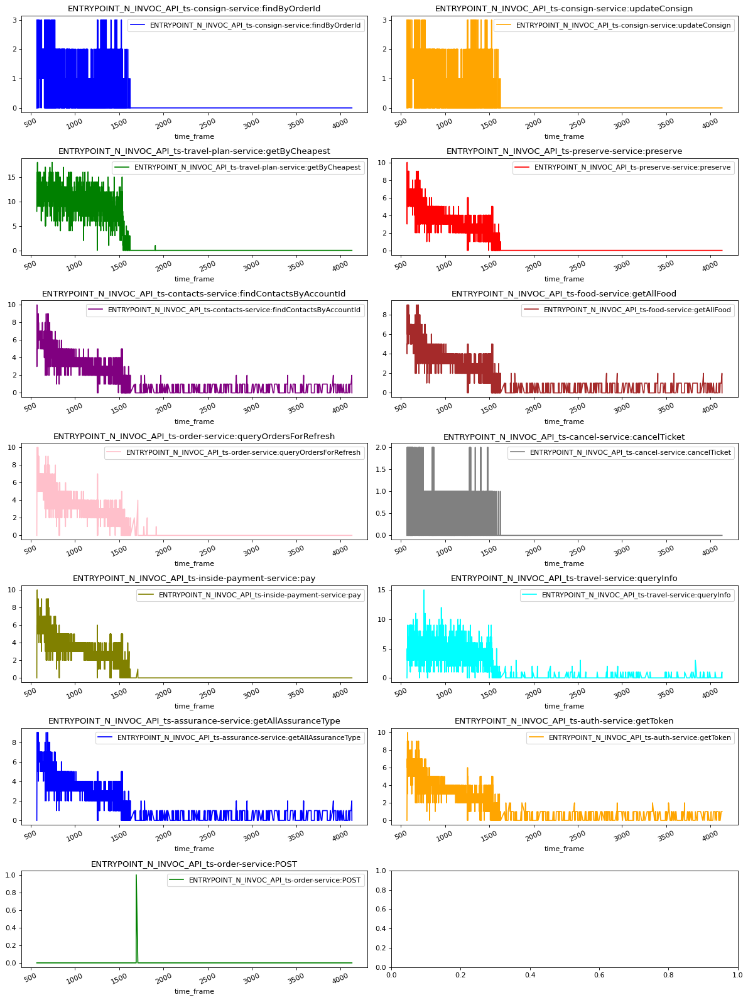

Data normalized
Input size 45 Output size 13
TOTAL MSE:  0.005779069479795955
TOTAL MAE:  0.028805417662216833
TOTAL MAPE:  699860081955.0
FIRST 50 predictions
ENTRY ENTRYPOINT_AVG_EXTIME_ts-consign-service:findByOrderId
PRED [0.0, 0.0, 2920.5384085497826, 4.238142035024006, 0.0, 0.0, 0.0, 3.0271047178919885, 0.0, 0.0, 3269.069362013252, 3.427662729428432, 0.0, 3.6123132222628045, 1.8066873330691833, 0.0, 3.2981523831019657, 0.0, 0.0, 0.0, 0.7679829106044792, 0.0, 0.0, 0.0, 0.0, 2938.261918530543, 2988.9845971610002, 0.0, 0.0, 0.0, 3121.2528667628662, 0.7679829106044792, 0.0, 0.0, 0.0, 5.420424439140085, 0.0, 0.0, 2920.5384085497826, 0.45397565397565404, 0.0, 3.9225239553983386, 0.0, 0.0, 3134.987232503607, 0.0, 3.9234075122085015, 2.5331487202093697, 0.0, 0.6019817375063503]
VALS [0.0, 0.0, 2135.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2964.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3367.5, 3974.0, 0.0, 0.0, 0.0, 2443.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 27

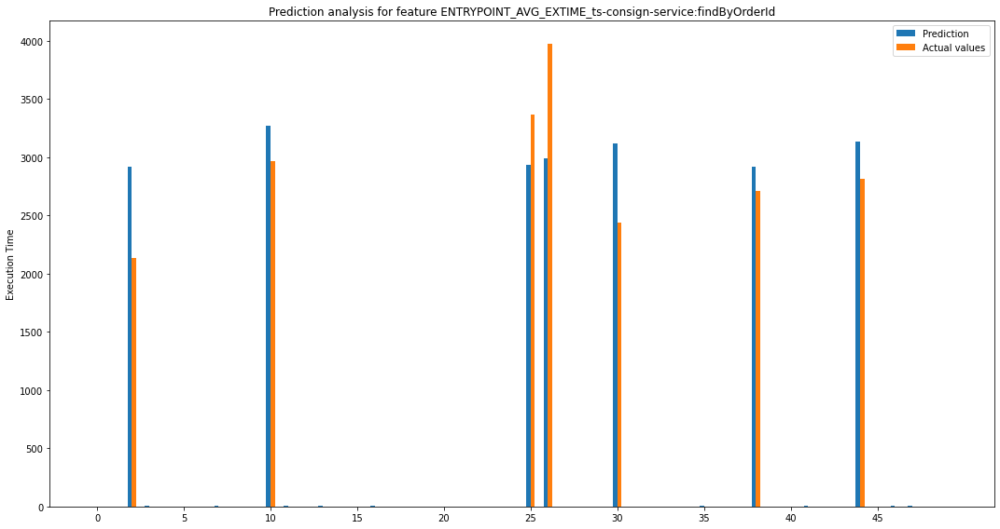

MAE:  74.95882505896344
MAPE:  30.46  %
MSE:  49394.724513279114
ENTRY ENTRYPOINT_AVG_EXTIME_ts-consign-service:updateConsign
PRED [0.0, 0.0, 8546.685137987006, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9959.880941690311, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8541.729668650787, 9405.782627021576, 0.0, 0.0, 0.0, 9267.120209198209, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8546.685137987006, 0.0, 0.0, 0.0, 0.0, 0.0, 9389.130380494504, 0.0, 0.0, 0.0, 0.0, 0.0]
VALS [0.0, 0.0, 9051.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8613.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9223.5, 8318.0, 0.0, 0.0, 0.0, 9070.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 10064.0, 0.0, 0.0, 0.0, 0.0, 0.0, 10286.0, 0.0, 0.0, 0.0, 0.0, 0.0]


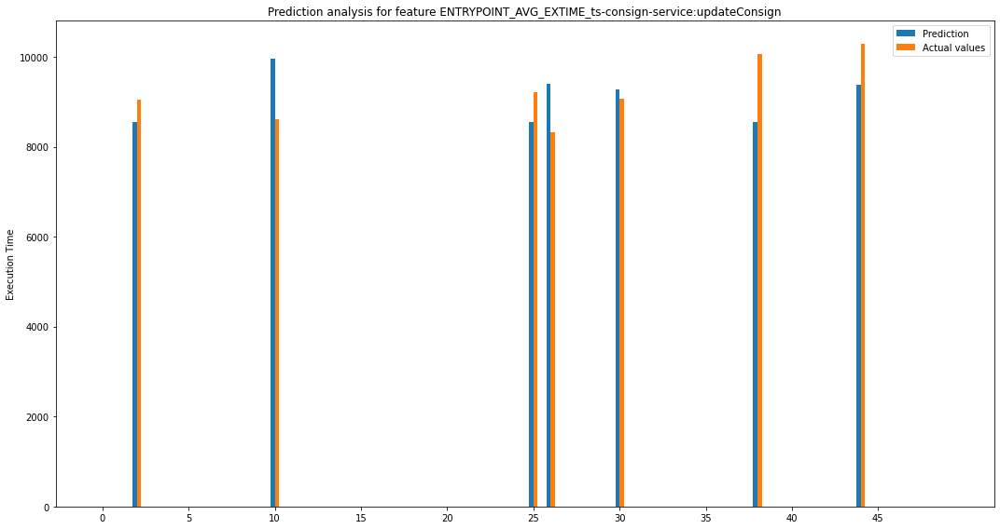

MAE:  124.64106905581586
MAPE:  1.37  %
MSE:  137239.58922491063
ENTRY ENTRYPOINT_AVG_EXTIME_ts-travel-plan-service:getByCheapest
PRED [1336563.1478846138, 1270948.17318942, 370233.47999631613, 1811156.1445571138, 3309007.0692418627, 1292746.7655387719, 1029889.22852224, 1777441.3498515338, 1165096.5431827346, 936609.4552166844, 251871.0067607361, 1074252.4505209096, 599035.3631150147, 674937.0174600126, 1564595.3011763443, 1332055.008461391, 784192.1812992784, 1292794.6532173431, 632214.745536607, 765719.9459380945, 2659314.6950999787, 1044533.7822078944, 1079029.0486712505, 3499168.165399312, 1044533.7822078944, 314049.6291098023, 1908368.2024495457, 2764505.7777621155, 1399518.7099143756, 3076492.355170225, 992162.1254793499, 2639034.386766645, 3726774.181718657, 1219844.9373722577, 178089.7541024442, 324671.7826577866, 1341548.6173429468, 2922320.300885602, 370233.47999631613, 2770274.5744939675, 964511.7313872569, 624260.866188471, 1276476.0678502796, 1254252.4606280576, 936701.10

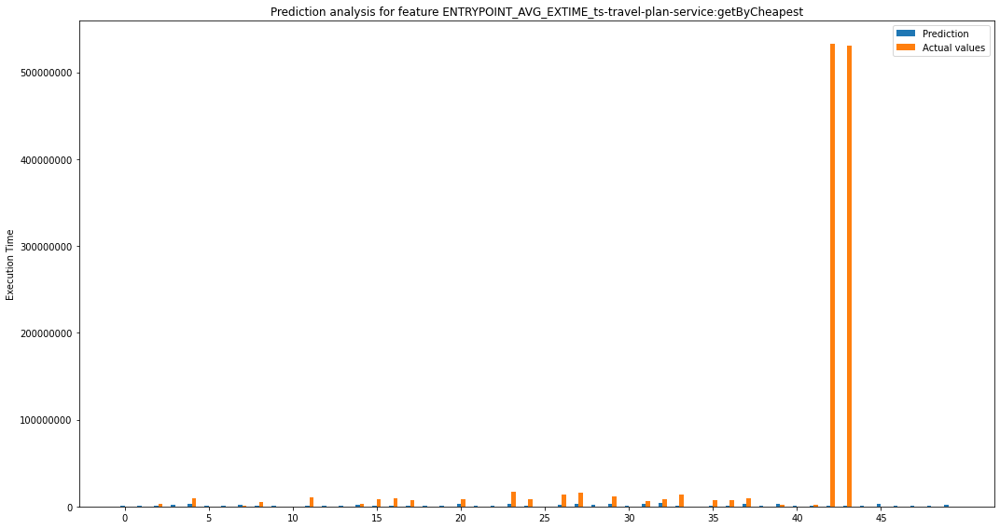

MAE:  24675439.076725125
MAPE:  1955.44  %
MSE:  1.1290146407047508e+16
ENTRY ENTRYPOINT_AVG_EXTIME_ts-preserve-service:preserve
PRED [281461.3333333334, 335869.1304761905, 785919.2186150796, 618213.0182926813, 12097748.832304774, 240781.25214285712, 325248.6433333333, 927697.8932877057, 837638.2795535715, 281461.3333333334, 689300.0917036138, 820715.1479306378, 352303.15685714287, 1385405.607767538, 593843.2077038493, 406710.9539999999, 1361106.2430325116, 54407.79714285715, 0.0, 54407.79714285715, 146755.8925283661, 0.0, 54407.79714285715, 13024900.45153205, 0.0, 789744.9321706352, 460307.91621945455, 384091.6861865615, 764798.192142857, 11354514.761448532, 0.0, 146755.8925283661, 13468590.168077685, 54407.79714285715, 0.0, 1090283.5845178103, 554094.0754761904, 10319280.13492274, 785919.2186150796, 487129.88931823836, 54407.79714285715, 1413176.5117528276, 54407.79714285715, 54407.79714285715, 0.0, 389102.58402289206, 1402586.3378563602, 1138637.5459039127, 54407.79714285715, 839843

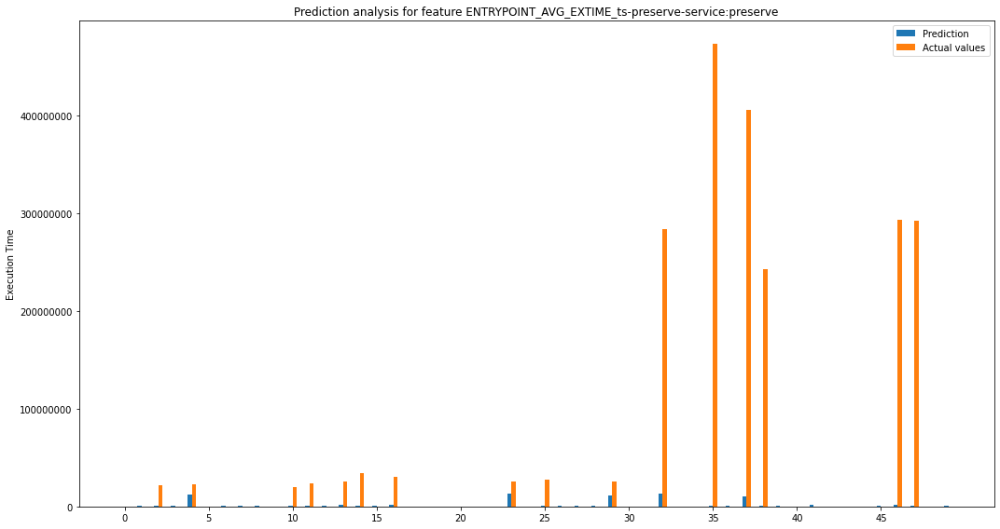

MAE:  43701149.53236189
MAPE:  3007.83  %
MSE:  1.371555535502934e+16
ENTRY ENTRYPOINT_AVG_EXTIME_ts-contacts-service:findContactsByAccountId
PRED [82.26792948717947, 92.52316758241757, 1901.8069603174588, 1432.246156842972, 3463.2267517575024, 33.34023809523809, 219.2285294871795, 1488.211692053618, 168.82270833333334, 82.26792948717947, 2627.0107830108595, 1956.6260638794254, 68.44309523809524, 2429.0602066769634, 1406.7631747297035, 78.69833333333332, 2348.9810160842057, 10.255238095238095, 0.0, 10.255238095238095, 304.3740940779306, 0.0, 10.255238095238095, 3631.0790647204653, 0.0, 1895.685404761903, 1721.8353079308708, 286.74825810373187, 386.55576758241756, 2374.7233390452134, 0.0, 304.3740940779306, 2993.4812456728455, 10.255238095238095, 0.0, 2614.5317730083816, 139.31483424908427, 2371.8555443362193, 1901.8069603174588, 522.5589804133764, 10.255238095238095, 2480.0187513659685, 10.255238095238095, 10.255238095238095, 0.0, 313.8011711005688, 2453.05173167918, 1906.1352273579375

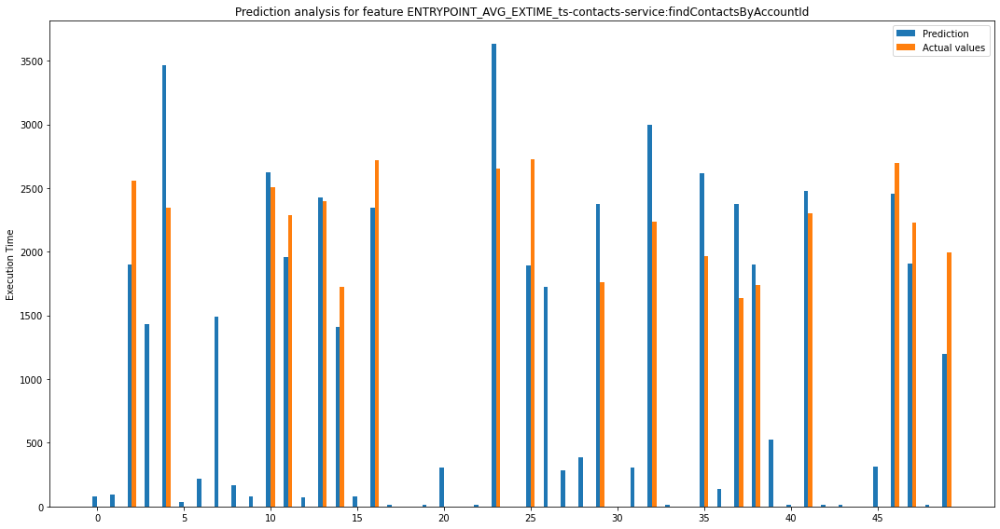

MAE:  340.5006875129642
MAPE:  60.3  %
MSE:  292232.63473861373
ENTRY ENTRYPOINT_AVG_EXTIME_ts-food-service:getAllFood
PRED [394.95688461538464, 476.792598901099, 18183.32169841268, 10593.05553898646, 18885.450066794314, 262.7994642857143, 883.7890846153846, 11023.671310260217, 1417.1307142857142, 394.95688461538464, 19595.837469015383, 14456.452748964983, 566.0110952380953, 17937.640697381008, 10415.279042372329, 647.8468095238095, 17355.49672985446, 81.83571428571429, 0.0, 81.83571428571429, 2310.299332334492, 0.0, 81.83571428571429, 19693.831635481187, 0.0, 18147.61058730157, 13954.855234699664, 2179.879098729607, 1592.3975489010988, 16417.75390512265, 0.0, 2310.299332334492, 19203.104348576417, 81.83571428571429, 0.0, 19276.045758755117, 839.4063489010989, 15717.235374567099, 18183.32169841268, 3914.199016548871, 81.83571428571429, 18319.289712139504, 81.83571428571429, 81.83571428571429, 0.0, 2372.471527255101, 18130.08816850109, 14095.185703845138, 81.83571428571429, 8897.8164303

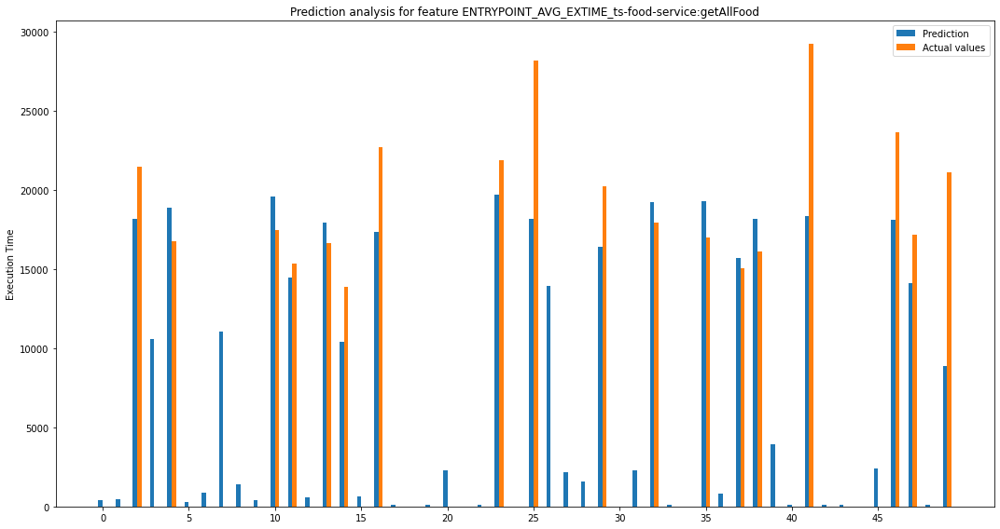

MAE:  2584.4869184767
MAPE:  61.79  %
MSE:  19453295.81757108
ENTRY ENTRYPOINT_AVG_EXTIME_ts-order-service:queryOrdersForRefresh
PRED [1680894.1905230223, 1535029.7462122773, 3873517.2342208666, 3521935.442477893, 2338465.3086521532, 1704084.5625609844, 1567198.1162448835, 3301455.2326916764, 1820634.353569833, 1692391.9052448834, 2327208.8958262154, 2775511.9682260216, 908529.8163548429, 2893032.600098364, 1971938.0374421598, 1664918.5202038414, 2974278.0439997264, 1673648.3168466988, 729515.3107739792, 1559094.5448191427, 2806974.388901169, 1399607.5263550924, 1573761.7387864115, 2714349.691843352, 1399607.5263550924, 3923149.890531472, 1986056.2496523906, 2871566.95248041, 1689014.0789515935, 2442707.3883474017, 2585316.452741176, 2883759.0789011684, 2739293.411013986, 1593050.4847740491, 695559.3708190729, 2606454.498886462, 1661775.8911420698, 2387322.063145021, 3873517.2342208666, 4022301.708613162, 1762721.830919209, 2642605.2426886274, 1803029.9647038416, 1680226.4613705082, 28

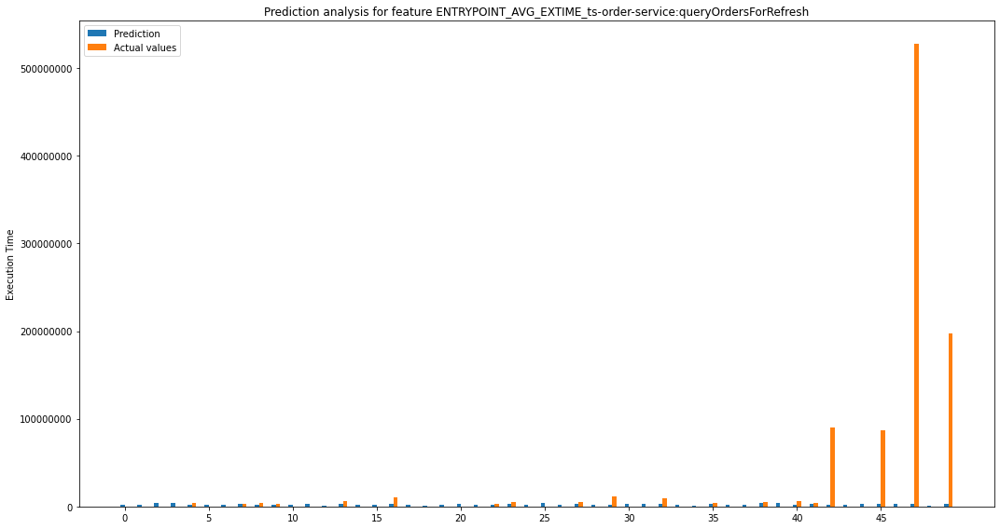

MAE:  20085764.142593555
MAPE:  738.89  %
MSE:  6565031226024865.0
ENTRY ENTRYPOINT_AVG_EXTIME_ts-cancel-service:cancelTicket
PRED [867.9884801236775, 706.8251441540917, 2240.3355339105333, 2811.899836464763, 103.06146284271284, 885.3813372665346, 1548.8661316388295, 4494.978450387765, 1673.9892918119897, 1613.7994649721627, 3673.768727058899, 3770.5560196239476, 958.174566259764, 7249.50638874266, 2668.872385428769, 810.3021705998681, 6972.365236884318, 820.1581229808205, 127.97342503987244, 1734.505825972274, 491.22329084901605, 637.3429097218572, 662.291929452127, 17.392857142857146, 637.3429097218572, 1759.741637806638, 2727.6742507795057, 1608.8859720007324, 958.4313372665346, 170.94631132756138, 2552.1702354867352, 491.22329084901605, 63.38730158730159, 750.3599926389401, 1112.119258373206, 5133.436153593798, 852.9146705998681, 246.02547799422805, 2240.3355339105333, 2089.189901762238, 1601.6771705998688, 7214.711173909534, 885.3813372665346, 844.7980039332014, 2237.535818820069,

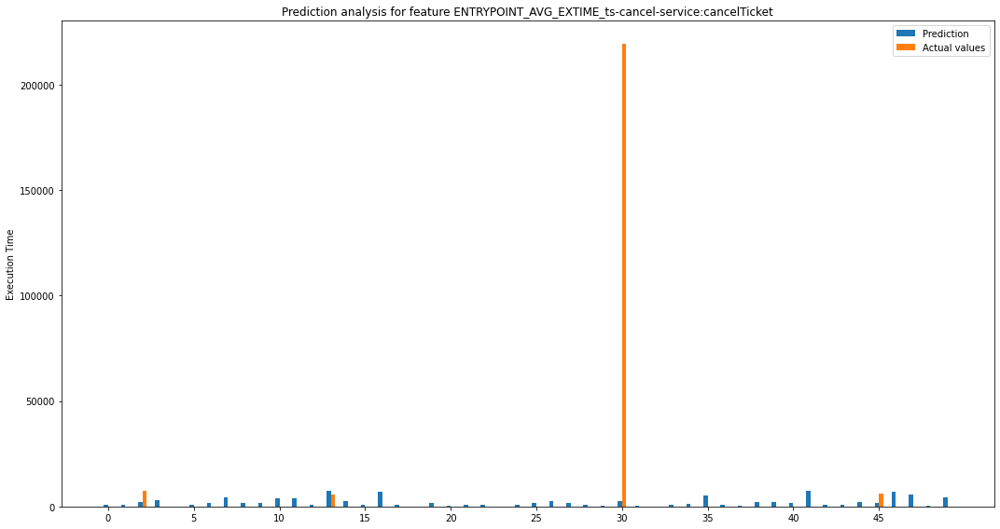

MAE:  6335.145151743841
MAPE:  271.88  %
MSE:  946838479.998968
ENTRY ENTRYPOINT_AVG_EXTIME_ts-inside-payment-service:pay
PRED [30941.124133658737, 72624.58664635441, 19075.44124546055, 4851.859016707444, 38795.24663546176, 26741.943379690485, 71182.14874296612, 5936.9144672644825, 62483.725450286605, 77455.19950487089, 10299.047353755692, 6682.269766684628, 246546.6393272014, 9597.290321219918, 4780.492236583322, 27298.16035984921, 9344.709671018512, 35244.01841937303, 279974.7825270155, 109780.59244180896, 997.6268404791672, 108973.46461872925, 94108.59312709591, 39906.4678430736, 108973.46461872925, 16467.572020689026, 33854.495485765714, 1720.3006773235365, 24512.862284452385, 52575.97507713122, 65441.289817695244, 997.6268404791672, 53757.23070815296, 63256.350858475635, 326499.0241103489, 8888.952094479553, 27651.22204635715, 49789.90856522646, 19075.44124546055, 2529.946285432803, 66268.67857413496, 9768.97973376694, 27666.911990801593, 32448.556990801593, 64184.701693621166, 17

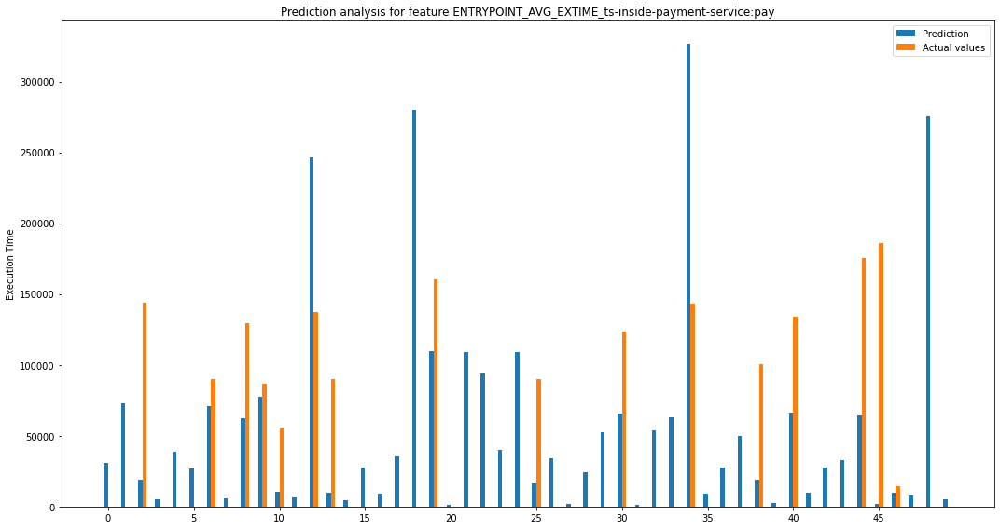

MAE:  56830.6854199538
MAPE:  343.09  %
MSE:  7181666958.832952
ENTRY ENTRYPOINT_AVG_EXTIME_ts-travel-service:queryInfo
PRED [2099543.821358886, 1886418.8318654909, 147690.94100091397, 1337862.2210130554, 247244.0139109095, 2134544.607588212, 2337319.7922358694, 1129073.7478496002, 2344330.046131262, 2295798.2830057107, 111430.91037244546, 593448.5581116285, 1586443.6505122457, 362073.3290090187, 408450.00551090966, 2080884.6290326568, 451547.306262973, 2085114.5809116245, 966631.1605853667, 2247264.3071384667, 1522083.2120271022, 1725465.0753675574, 1774723.3594232239, 141751.80662214087, 1725465.0753675574, 134816.45902207802, 507697.55032154213, 1538249.6715388608, 2012901.9151366635, 491228.7422618177, 543451.691327439, 1568847.437027102, 177855.11932134716, 1959615.5922780784, 1254279.8754457566, 134129.4790510216, 2056199.2477874577, 526753.9919726643, 147690.94100091397, 2111160.5758180874, 2446056.955876452, 177344.24578738585, 2083706.7894929738, 2098815.451715196, 557421.6765

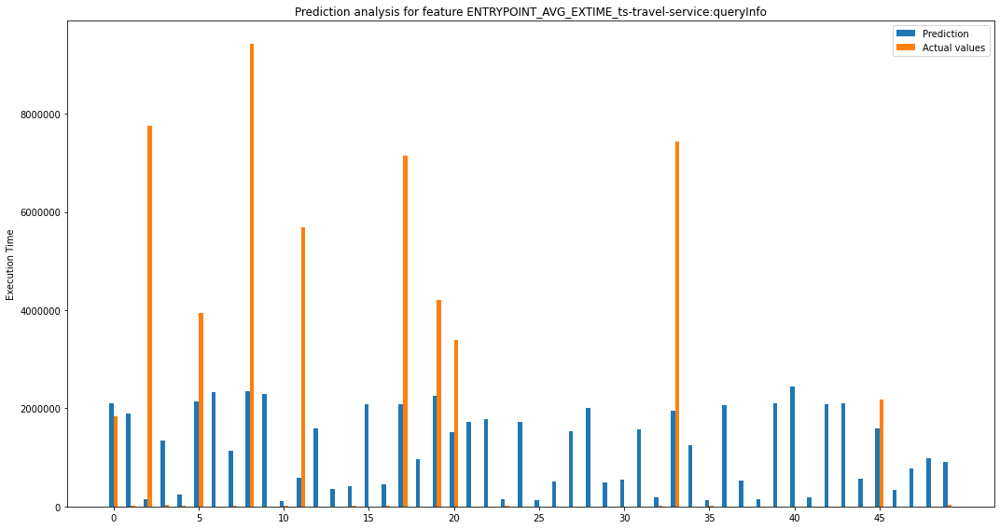

MAE:  1614965.083953094
MAPE:  222.11  %
MSE:  5463622713811.724
ENTRY ENTRYPOINT_AVG_EXTIME_ts-assurance-service:getAllAssuranceType
PRED [27.86016025641026, 34.46111263736264, 1456.6644900793656, 960.5350995257347, 1288.755570910571, 21.57095238095238, 31.69516025641026, 997.2518738977064, 115.91205357142857, 27.86016025641026, 1781.4355657414537, 1310.7649575968187, 46.68238095238095, 1623.6223621956735, 942.9247523030442, 53.28333333333334, 1569.970614160354, 6.600952380952381, 0.0, 6.600952380952381, 207.86669504726945, 0.0, 6.600952380952381, 1397.601415186665, 0.0, 1459.0752678571432, 1207.6305771595062, 194.65352857481003, 72.44111263736264, 1248.7992420033665, 0.0, 207.86669504726945, 1421.9926532819027, 6.600952380952381, 0.0, 1748.7387555643777, 65.26444597069596, 1092.1277711038963, 1456.6644900793656, 352.1530851005015, 6.600952380952381, 1658.2903813779676, 6.600952380952381, 6.600952380952381, 0.0, 212.9073982241536, 1640.078406074409, 1274.3126438809402, 6.6009523809523

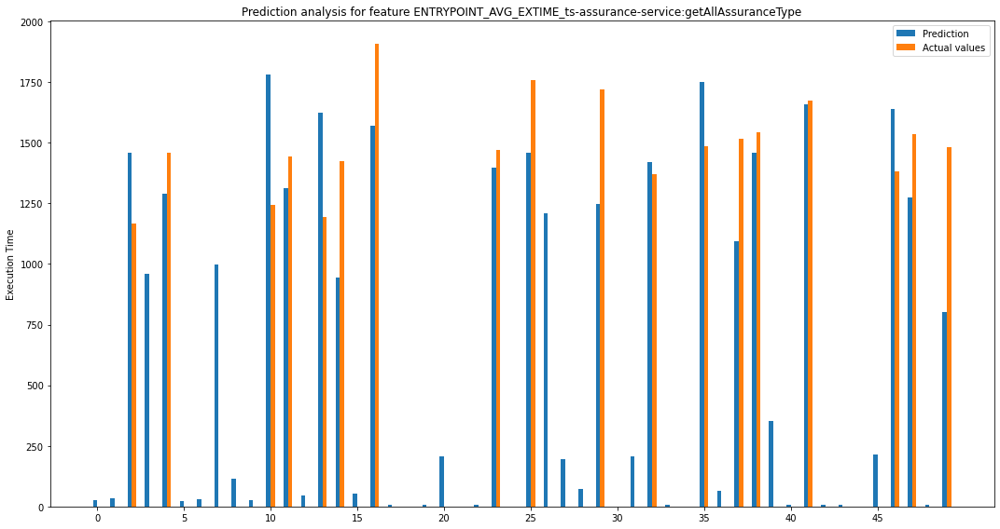

MAE:  203.0557630584512
MAPE:  60.42  %
MSE:  116487.72928624968
ENTRY ENTRYPOINT_AVG_EXTIME_ts-auth-service:getToken
PRED [0.0, 0.0, 0.0, 116541.43959547195, 0.0, 0.0, 0.0, 116506.60102279337, 0.0, 0.0, 116613.76384338253, 116620.80139027658, 0.0, 116694.08310122025, 116416.94914952188, 0.0, 116685.00413821598, 0.0, 0.0, 0.0, 116111.88362282935, 0.0, 0.0, 0.0, 0.0, 0.0, 115892.47488214438, 116091.60051250293, 0.0, 0.0, 0.0, 116107.25028949602, 0.0, 0.0, 0.0, 116782.87357915378, 0.0, 0.0, 0.0, 116245.20766074024, 0.0, 116710.48452329644, 0.0, 0.0, 0.0, 116098.18318288695, 116702.77206150569, 116588.58458541539, 0.0, 116322.45535349887]
VALS [0.0, 0.0, 0.0, 115681.0, 0.0, 0.0, 0.0, 116975.0, 0.0, 0.0, 117736.0, 115765.0, 0.0, 115733.0, 117305.0, 0.0, 125752.0, 0.0, 0.0, 0.0, 118840.5, 0.0, 0.0, 0.0, 0.0, 0.0, 114422.0, 121345.0, 0.0, 0.0, 0.0, 115303.5, 0.0, 0.0, 0.0, 115853.66666666669, 0.0, 0.0, 0.0, 114098.0, 0.0, 116198.0, 0.0, 0.0, 0.0, 117688.0, 110138.0, 113290.0, 0.0, 116682.0]


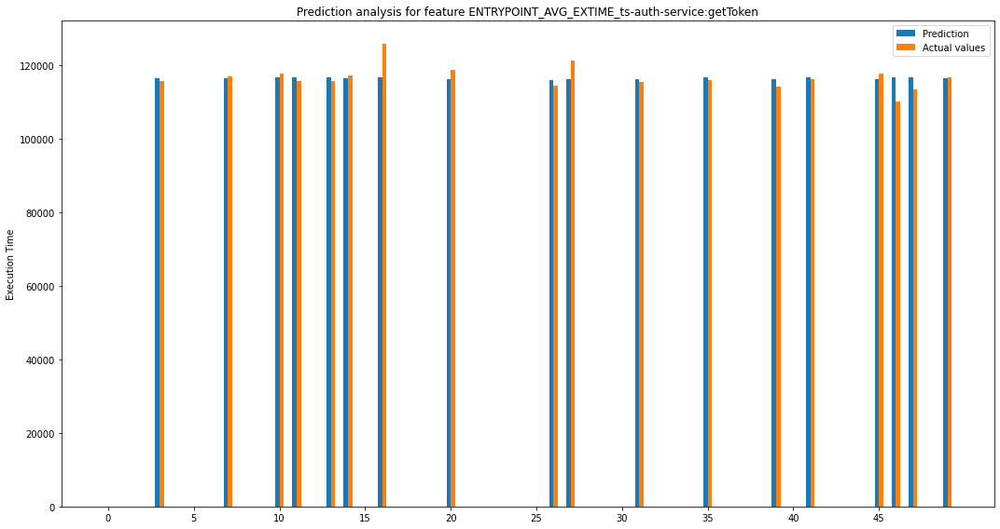

MAE:  797.6172835284434
MAPE:  0.68  %
MSE:  3741928.1257348172
ENTRY ENTRYPOINT_AVG_EXTIME_ts-order-service:POST
PRED [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
VALS [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


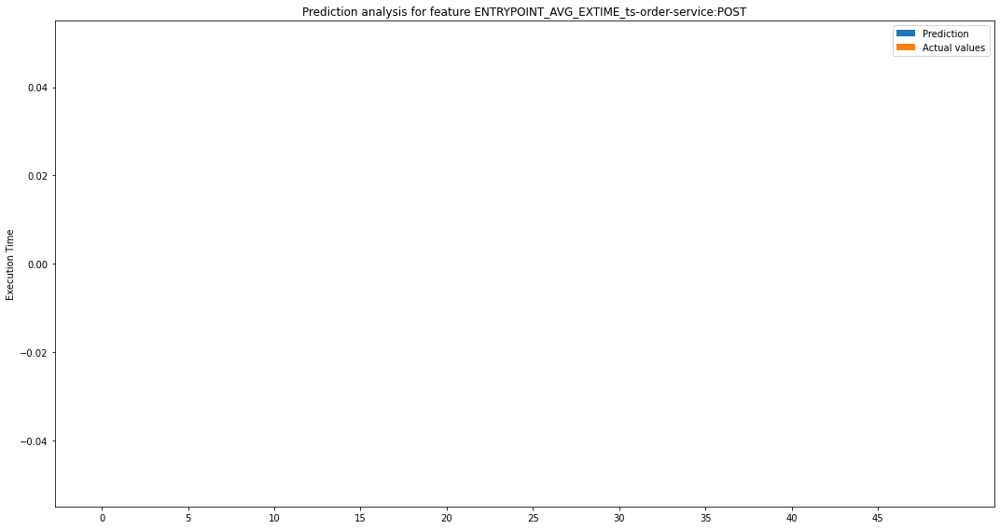

MAE:  0.0
MAPE:  0.0  %
MSE:  0.0
MAE:  0.0004391583094316591
MAPE:  0.13
MSE:  1.6485481337357842e-05
MAE:  0.0004975107474644325
MAPE:  0.0
MSE:  2.1646974596407425e-05
MAE:  0.009055029493689276
MAPE:  3.06
MSE:  0.0044531897169166465
MAE:  0.014400702484234267
MAPE:  3.74
MSE:  0.006255370342435833
MAE:  0.06082408531868935
MAPE:  0.58
MSE:  0.007723958919451549
MAE:  0.08138543345497873
MAPE:  0.85
MSE:  0.013955985840029234
MAE:  0.013147509571538131
MAPE:  5.13
MSE:  0.0062851858759239215
MAE:  0.007161358122279546
MAPE:  1.17
MSE:  0.0020351652779669496
MAE:  0.09195575992220746
MAPE:  1.25
MSE:  0.017300591672893915
MAE:  0.007807651575925703
MAPE:  3.25
MSE:  0.004912136279843163
MAE:  0.05829792969354126
MAPE:  0.88
MSE:  0.00792010253724234
MAE:  0.02747809889463664
MAPE:  0.03
MSE:  0.0022278822985080764
MAE:  0.00202020202020202
MAPE:  9098181065394.94
MSE:  0.00202020202020202


{'TOTAL MSE': 0.005779069479795955,
 'TOTAL MAE': 0.028805417662216833,
 'TOTAL MAPE': 699860081955.0,
 'ENTRYPOINT_AVG_EXTIME_ts-consign-service:findByOrderId MAE': 0.0004391583094316591,
 'ENTRYPOINT_AVG_EXTIME_ts-consign-service:findByOrderId MSE': 1.6485481337357842e-05,
 'ENTRYPOINT_AVG_EXTIME_ts-consign-service:findByOrderId MAPE': 0.12773379378032892,
 'ENTRYPOINT_AVG_EXTIME_ts-consign-service:updateConsign MAE': 0.0004975107474644325,
 'ENTRYPOINT_AVG_EXTIME_ts-consign-service:updateConsign MSE': 2.1646974596407425e-05,
 'ENTRYPOINT_AVG_EXTIME_ts-consign-service:updateConsign MAPE': 0.0013818790574270268,
 'ENTRYPOINT_AVG_EXTIME_ts-travel-plan-service:getByCheapest MAE': 0.009055029493689276,
 'ENTRYPOINT_AVG_EXTIME_ts-travel-plan-service:getByCheapest MSE': 0.0044531897169166465,
 'ENTRYPOINT_AVG_EXTIME_ts-travel-plan-service:getByCheapest MAPE': 3.0564372158374824,
 'ENTRYPOINT_AVG_EXTIME_ts-preserve-service:preserve MAE': 0.014400702484234267,
 'ENTRYPOINT_AVG_EXTIME_ts-pres

In [70]:
MachineLearningAnalyzer("avv_dataset_DT_1000.csv").perform_analysis()

In [ ]:
MachineLearningAnalyzer("avv_dataset_DT_10000.csv").perform_analysis()